In [5]:
import os
import optuna
import numpy as np
import pandas as pd
import warnings
# from three_class.three_class_nested_cv import NestedCVOptimizer
from three_class_nested_cv_class_metrics_plus_auc import NestedCVOptimizer

warnings.filterwarnings('ignore')

In [6]:
def nested_cv(X, y, groups, exp_name):
    """
    Run nested cross-validation with comprehensive results.
    Returns a DataFrame with all metrics, fold results, and summary statistics.
    """
    # Initialize and run optimizer
    optimizer = NestedCVOptimizer(
        X=X,
        y=y,
        groups=groups,
        n_outer_folds=5,
        n_inner_folds=3,
        n_trials=50,
        random_state=42
    )
    
    print("\nRunning nested cross-validation...")
    summaries = optimizer.run_nested_cv()
    
    print(f"\n📊 RESULTS SUMMARY:")
    if 'best_model' in summaries:
        print(f"Best performing model: {summaries['best_model'].upper()}")
        print(f"Best accuracy: {summaries['best_accuracy']:.4f}")
    else:
        print("Error: Could not determine best model due to processing issues")

    # # Display summary
    # print(f"\n📊 RESULTS SUMMARY:")
    # print(f"Best performing model: {summaries['best_model'].upper()}")
    # print(f"Best accuracy: {summaries['best_accuracy']:.4f}")

    results = optimizer.get_results_dataframe()
    
    optimizer.plot_roc_curves(save_path=f'/home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/roc_curves/{exp_name}_roc_curves.png')
    optimizer.plot_auc_comparison(save_path=f'/home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/{exp_name}_auc_comparison.png')

    
    return results

In [7]:
files = [
    'three_class_pp_1s_no.csv',
    'three_class_pp_1s_0.5.csv',
    'three_class_pp_1s_0.8.csv',
    'three_class_pp_2s_no.csv',
    'three_class_pp_2s_0.5.csv',
    'three_class_pp_2s_0.8.csv',
    'three_class_pp_3s_no.csv',
    'three_class_pp_3s_0.5.csv',
    'three_class_pp_3s_0.8.csv',
    'three_class_pp_4s_no.csv',
    'three_class_pp_4s_0.5.csv',
    'three_class_pp_4s_0.8.csv',
    'three_class_pp_5s_no.csv',
    'three_class_pp_5s_0.5.csv',
    'three_class_pp_5s_0.8.csv'
]


base_path = '/home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/feature_datasets/subject_based_norm/preprocessed/feature_set_2/with_gravity'

1. Loop through all files
2. Perform nested cross validation on each file
3. Store result in this format

![Output format](/home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/output_format.png)


[I 2025-09-06 13:58:07,202] A new study created in memory with name: no-name-78873858-ae4b-4f64-94b6-3c6f3ed425e4


Nested cross-validation for 1s_no
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 1878, Test size: 520
Class distribution in test set: [208  86 226]

--- Optimizing RF ---


[I 2025-09-06 13:58:08,503] Trial 0 finished with value: 0.5000344937132826 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5000344937132826.
[I 2025-09-06 13:58:10,096] Trial 1 finished with value: 0.49663969160279 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5000344937132826.
[I 2025-09-06 13:58:20,630] Trial 2 finished with value: 0.49490946979296774 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5000344937132826.
[I 2025-09-06 13:58:32,845] Trial 3 finished with value: 0.4900688828836614 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 87, 'max_depth': 15, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5089


[I 2025-09-06 14:00:14,994] A new study created in memory with name: no-name-1ea91648-8cc0-46b8-b85f-a24a6f02532b


rf test accuracy: 0.6038
rf macro AUC: 0.7123
rf micro AUC: 0.7543
rf post-void - Recall: 0.6346, AUC: 0.8085
rf pre-void - Recall: 0.2907, AUC: 0.5470
rf void - Recall: 0.6947, AUC: 0.7813

--- Optimizing XGB ---


[I 2025-09-06 14:00:28,821] Trial 0 finished with value: 0.48863946966691724 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.48863946966691724.
[I 2025-09-06 14:00:34,578] Trial 1 finished with value: 0.5047446715176207 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5047446715176207.
[I 2025-09-06 14:00:40,748] Trial 2 finished with value: 0.4881427465832915 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 

Best xgb params: {'n_estimators': 230, 'max_depth': 12, 'learning_rate': 0.07186477267909576, 'subsample': 0.6103141924766858, 'colsample_bytree': 0.8030491686485612, 'min_child_weight': 9, 'gamma': 3.9076030893497524, 'reg_alpha': 1.6021379224619694, 'reg_lambda': 1.519632604248976}
Best xgb CV score: 0.5137


[I 2025-09-06 14:04:55,424] A new study created in memory with name: no-name-b267ec8b-42da-4273-9ad0-4ff991668dfc
[I 2025-09-06 14:04:55,472] Trial 0 finished with value: 0.4236380298878905 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4236380298878905.


xgb test accuracy: 0.5942
xgb macro AUC: 0.7226
xgb micro AUC: 0.7590
xgb post-void - Recall: 0.6250, AUC: 0.8015
xgb pre-void - Recall: 0.2907, AUC: 0.5761
xgb void - Recall: 0.6814, AUC: 0.7903

--- Optimizing DT ---


[I 2025-09-06 14:04:56,092] Trial 1 finished with value: 0.4118731458438029 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4236380298878905.
[I 2025-09-06 14:04:56,134] Trial 2 finished with value: 0.4639430667513791 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4639430667513791.
[I 2025-09-06 14:04:56,160] Trial 3 finished with value: 0.44303002115550894 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4639430667513791.
[I 2025-09-06 14:04:56,184] Trial 4 finished with value: 0.46149407164145506 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 1, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.4992
dt test accuracy: 0.5808
dt macro AUC: 0.6576
dt micro AUC: 0.7125
dt post-void - Recall: 0.5144, AUC: 0.7399
dt pre-void - Recall: 0.2093, AUC: 0.5287
dt void - Recall: 0.7832, AUC: 0.7042

OUTER FOLD 2/5
Train size: 1955, Test size: 443
Class distribution in test set: [177  78 188]

--- Optimizing RF ---


[I 2025-09-06 14:05:02,057] Trial 0 finished with value: 0.5133798142192362 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5133798142192362.
[I 2025-09-06 14:05:03,466] Trial 1 finished with value: 0.5149592172824652 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5149592172824652.
[I 2025-09-06 14:05:12,265] Trial 2 finished with value: 0.49652072664125213 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5149592172824652.
[I 2025-09-06 14:05:22,679] Trial 3 finished with value: 0.4969619164698549 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_featur

Best rf params: {'n_estimators': 102, 'max_depth': 6, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5325


[I 2025-09-06 14:07:28,126] A new study created in memory with name: no-name-572ad387-3631-4d32-87c9-3f9167189742


rf test accuracy: 0.5237
rf macro AUC: 0.6659
rf micro AUC: 0.7160
rf post-void - Recall: 0.5876, AUC: 0.7456
rf pre-void - Recall: 0.1538, AUC: 0.5501
rf void - Recall: 0.6170, AUC: 0.7021

--- Optimizing XGB ---


[I 2025-09-06 14:07:36,715] Trial 0 finished with value: 0.5043838427756243 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5043838427756243.
[I 2025-09-06 14:07:39,431] Trial 1 finished with value: 0.5034244723801375 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5043838427756243.
[I 2025-09-06 14:07:42,559] Trial 2 finished with value: 0.5055156603548098 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 300, 'max_depth': 11, 'learning_rate': 0.04886900132294601, 'subsample': 0.7624364887824514, 'colsample_bytree': 0.8526333921184072, 'min_child_weight': 8, 'gamma': 4.960718199702326, 'reg_alpha': 1.0737883010647444, 'reg_lambda': 1.754708787074853}
Best xgb CV score: 0.5238


[I 2025-09-06 14:11:37,501] A new study created in memory with name: no-name-4fcc920d-7e1e-4fe0-8106-25c38c3b738e
[I 2025-09-06 14:11:37,550] Trial 0 finished with value: 0.410815455194842 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.410815455194842.


xgb test accuracy: 0.5327
xgb macro AUC: 0.6735
xgb micro AUC: 0.7218
xgb post-void - Recall: 0.5706, AUC: 0.7525
xgb pre-void - Recall: 0.1667, AUC: 0.5619
xgb void - Recall: 0.6489, AUC: 0.7060

--- Optimizing DT ---


[I 2025-09-06 14:11:38,158] Trial 1 finished with value: 0.4413776209436475 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4413776209436475.
[I 2025-09-06 14:11:38,201] Trial 2 finished with value: 0.43666128504276397 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.4413776209436475.
[I 2025-09-06 14:11:38,229] Trial 3 finished with value: 0.47817389479504485 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.47817389479504485.
[I 2025-09-06 14:11:38,253] Trial 4 finished with value: 0.4598243839861443 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 15, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5206
dt test accuracy: 0.4379
dt macro AUC: 0.5979
dt micro AUC: 0.6467
dt post-void - Recall: 0.2768, AUC: 0.6548
dt pre-void - Recall: 0.2564, AUC: 0.4877
dt void - Recall: 0.6649, AUC: 0.6511

OUTER FOLD 3/5
Train size: 2023, Test size: 375
Class distribution in test set: [121 110 144]

--- Optimizing RF ---


[I 2025-09-06 14:11:42,545] Trial 0 finished with value: 0.557457944621018 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.557457944621018.
[I 2025-09-06 14:11:43,981] Trial 1 finished with value: 0.5757465734475892 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5757465734475892.
[I 2025-09-06 14:11:53,274] Trial 2 finished with value: 0.5567759814548201 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5757465734475892.
[I 2025-09-06 14:12:04,358] Trial 3 finished with value: 0.55100455680933 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 

Best rf params: {'n_estimators': 110, 'max_depth': 5, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5830


[I 2025-09-06 14:13:26,916] A new study created in memory with name: no-name-299e4d7c-ca23-48de-98ed-8da426e5abe9


rf test accuracy: 0.4080
rf macro AUC: 0.6359
rf micro AUC: 0.6281
rf post-void - Recall: 0.5950, AUC: 0.5497
rf pre-void - Recall: 0.1091, AUC: 0.6844
rf void - Recall: 0.4792, AUC: 0.6736

--- Optimizing XGB ---


[I 2025-09-06 14:13:34,476] Trial 0 finished with value: 0.5608853364842176 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5608853364842176.
[I 2025-09-06 14:13:37,280] Trial 1 finished with value: 0.5445418694403009 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5608853364842176.
[I 2025-09-06 14:13:40,105] Trial 2 finished with value: 0.5690028400769421 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 476, 'max_depth': 9, 'learning_rate': 0.029323105618991638, 'subsample': 0.6071847502459278, 'colsample_bytree': 0.9924283304357214, 'min_child_weight': 7, 'gamma': 4.865188803848123, 'reg_alpha': 1.2481670543447305, 'reg_lambda': 0.07959921215402954}
Best xgb CV score: 0.5813


[I 2025-09-06 14:18:47,958] A new study created in memory with name: no-name-93e71afa-752f-473d-9d63-3c2fe72fb182
[I 2025-09-06 14:18:48,010] Trial 0 finished with value: 0.43997646621752823 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.43997646621752823.


xgb test accuracy: 0.4773
xgb macro AUC: 0.6512
xgb micro AUC: 0.6513
xgb post-void - Recall: 0.5785, AUC: 0.5977
xgb pre-void - Recall: 0.2818, AUC: 0.6711
xgb void - Recall: 0.5417, AUC: 0.6846

--- Optimizing DT ---


[I 2025-09-06 14:18:48,689] Trial 1 finished with value: 0.4422538346836185 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4422538346836185.
[I 2025-09-06 14:18:48,737] Trial 2 finished with value: 0.501599556653769 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.501599556653769.
[I 2025-09-06 14:18:48,765] Trial 3 finished with value: 0.5143415307422904 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5143415307422904.
[I 2025-09-06 14:18:48,790] Trial 4 finished with value: 0.49721942579679884 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_f

Best dt params: {'criterion': 'gini', 'max_depth': 3, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5568
dt test accuracy: 0.4080
dt macro AUC: 0.6132
dt micro AUC: 0.6199
dt post-void - Recall: 0.5950, AUC: 0.5324
dt pre-void - Recall: 0.0000, AUC: 0.6682
dt void - Recall: 0.5625, AUC: 0.6390

OUTER FOLD 4/5
Train size: 1840, Test size: 558
Class distribution in test set: [215 128 215]

--- Optimizing RF ---


[I 2025-09-06 14:18:52,954] Trial 0 finished with value: 0.5268080909082935 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5268080909082935.
[I 2025-09-06 14:18:54,363] Trial 1 finished with value: 0.5289395220321725 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5289395220321725.
[I 2025-09-06 14:19:03,416] Trial 2 finished with value: 0.5247444579734136 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5289395220321725.
[I 2025-09-06 14:19:13,215] Trial 3 finished with value: 0.5251957984505414 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 498, 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5404


[I 2025-09-06 14:21:44,267] A new study created in memory with name: no-name-a3123653-75fd-4de0-956a-824a7b00d446


rf test accuracy: 0.5448
rf macro AUC: 0.7139
rf micro AUC: 0.7428
rf post-void - Recall: 0.5070, AUC: 0.7163
rf pre-void - Recall: 0.1406, AUC: 0.6449
rf void - Recall: 0.8233, AUC: 0.7806

--- Optimizing XGB ---


[I 2025-09-06 14:21:51,579] Trial 0 finished with value: 0.519286836656518 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.519286836656518.
[I 2025-09-06 14:21:54,983] Trial 1 finished with value: 0.4977420606449893 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.519286836656518.
[I 2025-09-06 14:22:00,378] Trial 2 finished with value: 0.5186383580194596 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.655

Best xgb params: {'n_estimators': 304, 'max_depth': 11, 'learning_rate': 0.016172851295725186, 'subsample': 0.9079641690155484, 'colsample_bytree': 0.948471867171936, 'min_child_weight': 7, 'gamma': 4.9609644971072, 'reg_alpha': 0.9643525634936368, 'reg_lambda': 1.141199413006008}
Best xgb CV score: 0.5432


[I 2025-09-06 14:27:14,931] A new study created in memory with name: no-name-6820c569-1801-47f1-a38b-625705f8f5a6
[I 2025-09-06 14:27:14,978] Trial 0 finished with value: 0.3980632555876616 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.3980632555876616.


xgb test accuracy: 0.5663
xgb macro AUC: 0.7159
xgb micro AUC: 0.7426
xgb post-void - Recall: 0.5395, AUC: 0.7032
xgb pre-void - Recall: 0.2109, AUC: 0.6626
xgb void - Recall: 0.8047, AUC: 0.7820

--- Optimizing DT ---


[I 2025-09-06 14:27:15,624] Trial 1 finished with value: 0.4466137104744583 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4466137104744583.
[I 2025-09-06 14:27:15,668] Trial 2 finished with value: 0.5079500737080401 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5079500737080401.
[I 2025-09-06 14:27:15,694] Trial 3 finished with value: 0.506526168618635 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5079500737080401.
[I 2025-09-06 14:27:15,719] Trial 4 finished with value: 0.48261623560942035 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5170
dt test accuracy: 0.4391
dt macro AUC: 0.5970
dt micro AUC: 0.6246
dt post-void - Recall: 0.3488, AUC: 0.5579
dt pre-void - Recall: 0.2891, AUC: 0.6122
dt void - Recall: 0.6186, AUC: 0.6210

OUTER FOLD 5/5
Train size: 1896, Test size: 502
Class distribution in test set: [161 149 192]

--- Optimizing RF ---


[I 2025-09-06 14:27:20,066] Trial 0 finished with value: 0.5141714310785944 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5141714310785944.
[I 2025-09-06 14:27:21,538] Trial 1 finished with value: 0.523160672468631 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.523160672468631.
[I 2025-09-06 14:27:30,922] Trial 2 finished with value: 0.5178389154425376 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.523160672468631.
[I 2025-09-06 14:27:42,163] Trial 3 finished with value: 0.508171730026254 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 

Best rf params: {'n_estimators': 358, 'max_depth': 5, 'min_samples_split': 11, 'min_samples_leaf': 8, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5407


[I 2025-09-06 14:29:58,297] A new study created in memory with name: no-name-1cde1ec8-d26d-4339-b760-300497cbf6d3


rf test accuracy: 0.5319
rf macro AUC: 0.7131
rf micro AUC: 0.6994
rf post-void - Recall: 0.4658, AUC: 0.5780
rf pre-void - Recall: 0.1007, AUC: 0.7445
rf void - Recall: 0.9219, AUC: 0.8170

--- Optimizing XGB ---


[I 2025-09-06 14:30:07,020] Trial 0 finished with value: 0.4995161807279896 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4995161807279896.
[I 2025-09-06 14:30:10,548] Trial 1 finished with value: 0.5050824820389718 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5050824820389718.
[I 2025-09-06 14:30:13,855] Trial 2 finished with value: 0.5063592297009069 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 273, 'max_depth': 5, 'learning_rate': 0.021164021005190013, 'subsample': 0.7991319272522994, 'colsample_bytree': 0.7940610057735219, 'min_child_weight': 2, 'gamma': 4.235380677772333, 'reg_alpha': 1.9317600046593324, 'reg_lambda': 1.8874151708411677}
Best xgb CV score: 0.5290


[I 2025-09-06 14:36:19,111] A new study created in memory with name: no-name-0eec737e-5ce2-454f-81fa-882eb159f301
[I 2025-09-06 14:36:19,162] Trial 0 finished with value: 0.4316675340823173 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4316675340823173.


xgb test accuracy: 0.5478
xgb macro AUC: 0.7004
xgb micro AUC: 0.7011
xgb post-void - Recall: 0.5031, AUC: 0.5889
xgb pre-void - Recall: 0.1409, AUC: 0.6880
xgb void - Recall: 0.9010, AUC: 0.8244

--- Optimizing DT ---


[I 2025-09-06 14:36:19,817] Trial 1 finished with value: 0.42301984623636696 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4316675340823173.
[I 2025-09-06 14:36:19,861] Trial 2 finished with value: 0.4733130890312662 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4733130890312662.
[I 2025-09-06 14:36:19,890] Trial 3 finished with value: 0.4545012869941089 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4733130890312662.
[I 2025-09-06 14:36:19,917] Trial 4 finished with value: 0.49122240165455944 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 18, 'min_samples_leaf': 10, 'max_features': None, 'splitter': 'best'}
Best dt CV score: 0.5068
dt test accuracy: 0.4582
dt macro AUC: 0.6433
dt micro AUC: 0.6315
dt post-void - Recall: 0.6646, AUC: 0.5405
dt pre-void - Recall: 0.0000, AUC: 0.6869
dt void - Recall: 0.6406, AUC: 0.7026

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5224 ± 0.0713
f1_macro       : 0.4536 ± 0.0621
precision_macro: 0.5367 ± 0.0709
recall_macro   : 0.4747 ± 0.0545
macro_auc      : 0.6882 ± 0.0357
micro_auc      : 0.7081 ± 0.0497

Per-class Performance:
post-void    - Recall: 0.5580±0.0693, AUC: 0.6796±0.1113
pre-void     - Recall: 0.1590±0.0768, AUC: 0.6342±0.0858
void         - Recall: 0.7072±0.1731, AUC: 0.7509±0.0603
Individual fold accuracies: ['0.6038', '0.5237', '0.4080', '0.5448', '0.5319']
Individual fold macro AUCs: ['0.7123', '0.6659', '0.6359', '0.7139', '

[I 2025-09-06 14:36:26,915] A new study created in memory with name: no-name-e0af2aa3-4c3a-4c3f-bd93-da60a82e57c0


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/1s_no_auc_comparison.png
Nested cross-validation for 1s_0.5
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 4035, Test size: 747
Class distribution in test set: [189 130 428]

--- Optimizing RF ---


[I 2025-09-06 14:36:29,167] Trial 0 finished with value: 0.49322629832657955 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.49322629832657955.
[I 2025-09-06 14:36:31,651] Trial 1 finished with value: 0.5002353744315758 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5002353744315758.
[I 2025-09-06 14:36:53,017] Trial 2 finished with value: 0.4806409530738222 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5002353744315758.
[I 2025-09-06 14:37:22,162] Trial 3 finished with value: 0.48027003199168067 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feat

Best rf params: {'n_estimators': 476, 'max_depth': 3, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5103


[I 2025-09-06 14:42:49,966] A new study created in memory with name: no-name-f7c33f66-ce9d-474b-a584-7f72311a64ed


rf test accuracy: 0.6198
rf macro AUC: 0.7343
rf micro AUC: 0.7913
rf post-void - Recall: 0.4868, AUC: 0.6679
rf pre-void - Recall: 0.0000, AUC: 0.7662
rf void - Recall: 0.8668, AUC: 0.7688

--- Optimizing XGB ---


[I 2025-09-06 14:43:20,249] Trial 0 finished with value: 0.4712261585520628 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4712261585520628.
[I 2025-09-06 14:43:30,241] Trial 1 finished with value: 0.47412765856691896 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.47412765856691896.
[I 2025-09-06 14:43:42,044] Trial 2 finished with value: 0.4754397620902588 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 

Best xgb params: {'n_estimators': 303, 'max_depth': 4, 'learning_rate': 0.01625052427116579, 'subsample': 0.808154230344385, 'colsample_bytree': 0.9648727039581695, 'min_child_weight': 2, 'gamma': 4.992483437747104, 'reg_alpha': 1.7042965114014081, 'reg_lambda': 0.4453483716386819}
Best xgb CV score: 0.4979


[I 2025-09-06 14:54:30,036] A new study created in memory with name: no-name-7d6e0deb-6f6e-4939-8aa6-f59d4d42213e
[I 2025-09-06 14:54:30,131] Trial 0 finished with value: 0.39466837122541404 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.39466837122541404.


xgb test accuracy: 0.6627
xgb macro AUC: 0.7246
xgb micro AUC: 0.7964
xgb post-void - Recall: 0.4921, AUC: 0.6709
xgb pre-void - Recall: 0.3231, AUC: 0.7401
xgb void - Recall: 0.8411, AUC: 0.7628

--- Optimizing DT ---


[I 2025-09-06 14:54:31,696] Trial 1 finished with value: 0.42899903510349396 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.42899903510349396.
[I 2025-09-06 14:54:31,792] Trial 2 finished with value: 0.4395251943932901 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4395251943932901.
[I 2025-09-06 14:54:31,844] Trial 3 finished with value: 0.43693780632993673 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4395251943932901.
[I 2025-09-06 14:54:31,882] Trial 4 finished with value: 0.4335515802822703 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 7, 'min_samples_leaf': 9, 'max_features': None, 'splitter': 'best'}
Best dt CV score: 0.4841
dt test accuracy: 0.5542
dt macro AUC: 0.6542
dt micro AUC: 0.7239
dt post-void - Recall: 0.6085, AUC: 0.6263
dt pre-void - Recall: 0.0000, AUC: 0.6501
dt void - Recall: 0.6986, AUC: 0.6861

OUTER FOLD 2/5
Train size: 3986, Test size: 796
Class distribution in test set: [243 228 325]

--- Optimizing RF ---


[I 2025-09-06 14:54:44,149] Trial 0 finished with value: 0.5441661101613389 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5441661101613389.
[I 2025-09-06 14:54:46,455] Trial 1 finished with value: 0.5583692437941025 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5583692437941025.
[I 2025-09-06 14:55:08,447] Trial 2 finished with value: 0.5418390369387743 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5583692437941025.
[I 2025-09-06 14:55:36,279] Trial 3 finished with value: 0.5381975821420296 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 280, 'max_depth': 4, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5654


[I 2025-09-06 14:59:22,453] A new study created in memory with name: no-name-9c8303a0-ecc7-4ab1-a9d1-6a304866eec7


rf test accuracy: 0.3769
rf macro AUC: 0.5798
rf micro AUC: 0.5863
rf post-void - Recall: 0.6173, AUC: 0.5768
rf pre-void - Recall: 0.0746, AUC: 0.5553
rf void - Recall: 0.4092, AUC: 0.6073

--- Optimizing XGB ---


[I 2025-09-06 14:59:37,701] Trial 0 finished with value: 0.5247386123226389 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5247386123226389.
[I 2025-09-06 14:59:43,074] Trial 1 finished with value: 0.5166879428459139 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5247386123226389.
[I 2025-09-06 14:59:49,141] Trial 2 finished with value: 0.5364659870688986 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 293, 'max_depth': 8, 'learning_rate': 0.018053276533310014, 'subsample': 0.9137475337279908, 'colsample_bytree': 0.6049998358151609, 'min_child_weight': 2, 'gamma': 4.957366471897871, 'reg_alpha': 1.5786167351137101, 'reg_lambda': 1.5223966419719628}
Best xgb CV score: 0.5547


[I 2025-09-06 15:13:04,919] A new study created in memory with name: no-name-7199c343-8276-4333-a60c-e333031f07f4
[I 2025-09-06 15:13:05,011] Trial 0 finished with value: 0.4315744238116503 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4315744238116503.


xgb test accuracy: 0.4183
xgb macro AUC: 0.5945
xgb micro AUC: 0.6026
xgb post-void - Recall: 0.5103, AUC: 0.5879
xgb pre-void - Recall: 0.2149, AUC: 0.6009
xgb void - Recall: 0.4923, AUC: 0.5945

--- Optimizing DT ---


[I 2025-09-06 15:13:06,533] Trial 1 finished with value: 0.4370891310869997 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4370891310869997.
[I 2025-09-06 15:13:06,616] Trial 2 finished with value: 0.5212229394593143 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5212229394593143.
[I 2025-09-06 15:13:06,660] Trial 3 finished with value: 0.442810960458933 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5212229394593143.
[I 2025-09-06 15:13:06,698] Trial 4 finished with value: 0.44700468556107315 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 14, 'min_samples_leaf': 9, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5482
dt test accuracy: 0.4033
dt macro AUC: 0.5685
dt micro AUC: 0.5738
dt post-void - Recall: 0.5597, AUC: 0.5374
dt pre-void - Recall: 0.0219, AUC: 0.5737
dt void - Recall: 0.5538, AUC: 0.5942

OUTER FOLD 3/5
Train size: 3502, Test size: 1280
Class distribution in test set: [629 353 298]

--- Optimizing RF ---


[I 2025-09-06 15:13:12,492] Trial 0 finished with value: 0.5158431370354549 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5158431370354549.
[I 2025-09-06 15:13:14,925] Trial 1 finished with value: 0.5245126491125424 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5245126491125424.
[I 2025-09-06 15:13:34,231] Trial 2 finished with value: 0.4977294126400554 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5245126491125424.
[I 2025-09-06 15:13:57,604] Trial 3 finished with value: 0.5004914390017084 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 285, 'max_depth': 5, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5418


[I 2025-09-06 15:16:32,026] A new study created in memory with name: no-name-86867553-5587-478d-bcd4-72f7a7777028


rf test accuracy: 0.5109
rf macro AUC: 0.7251
rf micro AUC: 0.6732
rf post-void - Recall: 0.5453, AUC: 0.7059
rf pre-void - Recall: 0.0652, AUC: 0.6326
rf void - Recall: 0.9664, AUC: 0.8368

--- Optimizing XGB ---


[I 2025-09-06 15:16:50,137] Trial 0 finished with value: 0.4973079741751387 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4973079741751387.
[I 2025-09-06 15:16:59,840] Trial 1 finished with value: 0.5003671116234466 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5003671116234466.
[I 2025-09-06 15:17:04,939] Trial 2 finished with value: 0.5040001394829349 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 378, 'max_depth': 3, 'learning_rate': 0.010215493843460856, 'subsample': 0.7929824641258137, 'colsample_bytree': 0.7459839334208376, 'min_child_weight': 5, 'gamma': 2.3261022742639406, 'reg_alpha': 0.9487664419830881, 'reg_lambda': 1.0952959506320314}
Best xgb CV score: 0.5270


[I 2025-09-06 15:23:52,972] A new study created in memory with name: no-name-57f25768-7790-4dd8-adfa-82937ec587f2
[I 2025-09-06 15:23:53,051] Trial 0 finished with value: 0.3877469423081586 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.3877469423081586.


xgb test accuracy: 0.5336
xgb macro AUC: 0.7259
xgb micro AUC: 0.6865
xgb post-void - Recall: 0.5866, AUC: 0.7138
xgb pre-void - Recall: 0.0992, AUC: 0.6287
xgb void - Recall: 0.9362, AUC: 0.8353

--- Optimizing DT ---


[I 2025-09-06 15:23:54,559] Trial 1 finished with value: 0.4228107966838295 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4228107966838295.
[I 2025-09-06 15:23:54,660] Trial 2 finished with value: 0.4592618585883456 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4592618585883456.
[I 2025-09-06 15:23:54,712] Trial 3 finished with value: 0.4752680331434666 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4752680331434666.
[I 2025-09-06 15:23:54,755] Trial 4 finished with value: 0.4949373756855753 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 'log2', 'splitter': 'random'}
Best dt CV score: 0.5341
dt test accuracy: 0.4102
dt macro AUC: 0.6685
dt micro AUC: 0.6288
dt post-void - Recall: 0.3609, AUC: 0.6486
dt pre-void - Recall: 0.0623, AUC: 0.5900
dt void - Recall: 0.9262, AUC: 0.7670

OUTER FOLD 4/5
Train size: 3771, Test size: 1011
Class distribution in test set: [314 180 517]

--- Optimizing RF ---


[I 2025-09-06 15:23:59,540] Trial 0 finished with value: 0.5053538056491339 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5053538056491339.
[I 2025-09-06 15:24:01,866] Trial 1 finished with value: 0.4923190276853387 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5053538056491339.
[I 2025-09-06 15:24:21,956] Trial 2 finished with value: 0.4835930808289093 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5053538056491339.
[I 2025-09-06 15:24:48,187] Trial 3 finished with value: 0.4898193219063581 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 494, 'max_depth': 17, 'min_samples_split': 19, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5087


[I 2025-09-06 15:31:21,358] A new study created in memory with name: no-name-03636bd0-8990-4318-9721-b14903111847


rf test accuracy: 0.5628
rf macro AUC: 0.6989
rf micro AUC: 0.7120
rf post-void - Recall: 0.6306, AUC: 0.6780
rf pre-void - Recall: 0.2944, AUC: 0.7206
rf void - Recall: 0.6151, AUC: 0.6981

--- Optimizing XGB ---


[I 2025-09-06 15:31:40,523] Trial 0 finished with value: 0.4924658856928597 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4924658856928597.
[I 2025-09-06 15:31:46,382] Trial 1 finished with value: 0.48089134230662883 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.4924658856928597.
[I 2025-09-06 15:31:55,027] Trial 2 finished with value: 0.491148727623057 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 192, 'max_depth': 4, 'learning_rate': 0.01131230746895698, 'subsample': 0.7261800650237537, 'colsample_bytree': 0.6421298247419491, 'min_child_weight': 10, 'gamma': 4.658694008647853, 'reg_alpha': 1.4331363336275558, 'reg_lambda': 1.3496047843996721}
Best xgb CV score: 0.5074


[I 2025-09-06 15:40:45,357] A new study created in memory with name: no-name-003b4e08-0d29-4092-b480-6c3e657f1791
[I 2025-09-06 15:40:45,445] Trial 0 finished with value: 0.44190404186859994 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.44190404186859994.


xgb test accuracy: 0.5490
xgb macro AUC: 0.6881
xgb micro AUC: 0.7082
xgb post-void - Recall: 0.6465, AUC: 0.6707
xgb pre-void - Recall: 0.3167, AUC: 0.7022
xgb void - Recall: 0.5706, AUC: 0.6916

--- Optimizing DT ---


[I 2025-09-06 15:40:46,825] Trial 1 finished with value: 0.4422559074911548 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4422559074911548.
[I 2025-09-06 15:40:46,902] Trial 2 finished with value: 0.43120448650919974 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.4422559074911548.
[I 2025-09-06 15:40:46,950] Trial 3 finished with value: 0.4539641822202906 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4539641822202906.
[I 2025-09-06 15:40:46,987] Trial 4 finished with value: 0.44883798873010344 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': None, 'splitter': 'best'}
Best dt CV score: 0.4906


[I 2025-09-06 15:41:02,747] A new study created in memory with name: no-name-370355ca-e37a-4d1f-b78a-c70c28ff0629


dt test accuracy: 0.4738
dt macro AUC: 0.6179
dt micro AUC: 0.6475
dt post-void - Recall: 0.7548, AUC: 0.5960
dt pre-void - Recall: 0.1167, AUC: 0.6285
dt void - Recall: 0.4275, AUC: 0.6291

OUTER FOLD 5/5
Train size: 3834, Test size: 948
Class distribution in test set: [401 199 348]

--- Optimizing RF ---


[I 2025-09-06 15:41:04,846] Trial 0 finished with value: 0.4643993638683241 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.4643993638683241.
[I 2025-09-06 15:41:07,125] Trial 1 finished with value: 0.47969991556771924 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.47969991556771924.
[I 2025-09-06 15:41:26,606] Trial 2 finished with value: 0.45319531480864134 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.47969991556771924.
[I 2025-09-06 15:41:53,247] Trial 3 finished with value: 0.45255639025643585 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_fe

Best rf params: {'n_estimators': 187, 'max_depth': 4, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.4857


[I 2025-09-06 15:44:58,843] A new study created in memory with name: no-name-646e0a2d-6a27-465d-a099-bcd2d717cca3


rf test accuracy: 0.6561
rf macro AUC: 0.7730
rf micro AUC: 0.8017
rf post-void - Recall: 0.6933, AUC: 0.8095
rf pre-void - Recall: 0.1658, AUC: 0.6575
rf void - Recall: 0.8937, AUC: 0.8519

--- Optimizing XGB ---


[I 2025-09-06 15:45:15,276] Trial 0 finished with value: 0.4404370134194296 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4404370134194296.
[I 2025-09-06 15:45:21,535] Trial 1 finished with value: 0.4456529155966631 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.4456529155966631.
[I 2025-09-06 15:45:28,476] Trial 2 finished with value: 0.4575477934300878 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 188, 'max_depth': 3, 'learning_rate': 0.1355236375958329, 'subsample': 0.8741010211378308, 'colsample_bytree': 0.6913253986037604, 'min_child_weight': 3, 'gamma': 4.631384653352055, 'reg_alpha': 1.838579146446554, 'reg_lambda': 0.6728848933832177}
Best xgb CV score: 0.4730


[I 2025-09-06 15:53:51,307] A new study created in memory with name: no-name-390cbab6-a302-4e1b-91a7-416782e5fe24
[I 2025-09-06 15:53:51,393] Trial 0 finished with value: 0.38871840638395144 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.38871840638395144.


xgb test accuracy: 0.6350
xgb macro AUC: 0.7800
xgb micro AUC: 0.8080
xgb post-void - Recall: 0.6608, AUC: 0.7840
xgb pre-void - Recall: 0.2814, AUC: 0.6922
xgb void - Recall: 0.8075, AUC: 0.8639

--- Optimizing DT ---


[I 2025-09-06 15:53:52,849] Trial 1 finished with value: 0.3713587616214953 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.38871840638395144.
[I 2025-09-06 15:53:52,929] Trial 2 finished with value: 0.4022293661453747 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4022293661453747.
[I 2025-09-06 15:53:52,972] Trial 3 finished with value: 0.4267773975828595 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4267773975828595.
[I 2025-09-06 15:53:53,009] Trial 4 finished with value: 0.44651424996744726 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 14, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'splitter': 'random'}
Best dt CV score: 0.4745
dt test accuracy: 0.5380
dt macro AUC: 0.6549
dt micro AUC: 0.7115
dt post-void - Recall: 0.4663, AUC: 0.6678
dt pre-void - Recall: 0.0201, AUC: 0.5731
dt void - Recall: 0.9167, AUC: 0.7236

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5453 ± 0.1092
f1_macro       : 0.4480 ± 0.0927
precision_macro: 0.5055 ± 0.1328
recall_macro   : 0.4883 ± 0.0826
macro_auc      : 0.7022 ± 0.0734
micro_auc      : 0.7129 ± 0.0889

Per-class Performance:
post-void    - Recall: 0.5946±0.0800, AUC: 0.6876±0.0836
pre-void     - Recall: 0.1200±0.1140, AUC: 0.6664±0.0813
void         - Recall: 0.7503±0.2321, AUC: 0.7526±0.1016
Individual fold accuracies: ['0.6198', '0.3769', '0.5109', '0.5628', '0.6561']
Individual fold macro AUCs: ['0.7343', '0.5798', '0.7251', '0.6989'

[I 2025-09-06 15:53:59,009] A new study created in memory with name: no-name-02824a45-b63e-4b8b-b4a0-b59cea1bd61a


Nested cross-validation for 1s_0.8
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 9124, Test size: 2793
Class distribution in test set: [1092  619 1082]

--- Optimizing RF ---


[I 2025-09-06 15:54:04,390] Trial 0 finished with value: 0.5198708796358164 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5198708796358164.
[I 2025-09-06 15:54:09,004] Trial 1 finished with value: 0.52625678859168 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.52625678859168.
[I 2025-09-06 15:54:59,705] Trial 2 finished with value: 0.5141379036544259 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.52625678859168.
[I 2025-09-06 15:56:12,127] Trial 3 finished with value: 0.5029495580253759 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': No

Best rf params: {'n_estimators': 431, 'max_depth': 7, 'min_samples_split': 17, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5358


[I 2025-09-06 16:07:04,627] A new study created in memory with name: no-name-e36a96be-aa38-48c1-bd00-1836d8baf9c0


rf test accuracy: 0.6513
rf macro AUC: 0.7803
rf micro AUC: 0.8070
rf post-void - Recall: 0.6951, AUC: 0.8327
rf pre-void - Recall: 0.2811, AUC: 0.6566
rf void - Recall: 0.8189, AUC: 0.8516

--- Optimizing XGB ---


[I 2025-09-06 16:07:29,527] Trial 0 finished with value: 0.5044619211548177 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5044619211548177.
[I 2025-09-06 16:07:38,208] Trial 1 finished with value: 0.4924738536597828 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5044619211548177.
[I 2025-09-06 16:07:47,078] Trial 2 finished with value: 0.5029106852984485 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 168, 'max_depth': 3, 'learning_rate': 0.02536334780530939, 'subsample': 0.7516439025049594, 'colsample_bytree': 0.9749317201745061, 'min_child_weight': 2, 'gamma': 2.0871249058671313, 'reg_alpha': 1.004946185140471, 'reg_lambda': 1.9972818651185718}
Best xgb CV score: 0.5243


[I 2025-09-06 16:16:43,206] A new study created in memory with name: no-name-b0d5be8a-b735-4324-b523-6fac27dcdc1f
[I 2025-09-06 16:16:43,386] Trial 0 finished with value: 0.4186503120044161 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4186503120044161.


xgb test accuracy: 0.6423
xgb macro AUC: 0.7735
xgb micro AUC: 0.8009
xgb post-void - Recall: 0.6941, AUC: 0.8135
xgb pre-void - Recall: 0.3344, AUC: 0.6708
xgb void - Recall: 0.7662, AUC: 0.8362

--- Optimizing DT ---


[I 2025-09-06 16:16:46,842] Trial 1 finished with value: 0.41833792846612256 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4186503120044161.
[I 2025-09-06 16:16:47,010] Trial 2 finished with value: 0.4545852900288369 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4545852900288369.
[I 2025-09-06 16:16:47,090] Trial 3 finished with value: 0.42763401036238835 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4545852900288369.
[I 2025-09-06 16:16:47,154] Trial 4 finished with value: 0.4506812844426062 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 'log2', 'splitter': 'best'}
Best dt CV score: 0.5047
dt test accuracy: 0.5675
dt macro AUC: 0.6890
dt micro AUC: 0.7330
dt post-void - Recall: 0.7463, AUC: 0.7149
dt pre-void - Recall: 0.0194, AUC: 0.5781
dt void - Recall: 0.7006, AUC: 0.7740

OUTER FOLD 2/5
Train size: 10285, Test size: 1632
Class distribution in test set: [349 548 735]

--- Optimizing RF ---


[I 2025-09-06 16:17:02,698] Trial 0 finished with value: 0.5549297219468691 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5549297219468691.
[I 2025-09-06 16:17:07,584] Trial 1 finished with value: 0.5576421856919036 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5576421856919036.
[I 2025-09-06 16:18:01,228] Trial 2 finished with value: 0.5524535519106326 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5576421856919036.
[I 2025-09-06 16:19:19,004] Trial 3 finished with value: 0.5496283261335532 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 258, 'max_depth': 5, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5738


[I 2025-09-06 16:31:06,687] A new study created in memory with name: no-name-792b6b29-c128-446d-a29d-fc3ad0c73650


rf test accuracy: 0.3983
rf macro AUC: 0.6173
rf micro AUC: 0.5878
rf post-void - Recall: 0.6390, AUC: 0.6022
rf pre-void - Recall: 0.0712, AUC: 0.5852
rf void - Recall: 0.5279, AUC: 0.6646

--- Optimizing XGB ---


[I 2025-09-06 16:31:35,543] Trial 0 finished with value: 0.5389581542123124 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5389581542123124.
[I 2025-09-06 16:31:44,576] Trial 1 finished with value: 0.5370533245653076 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5389581542123124.
[I 2025-09-06 16:31:55,883] Trial 2 finished with value: 0.5454637998632094 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 308, 'max_depth': 3, 'learning_rate': 0.012224550751771973, 'subsample': 0.70368437893101, 'colsample_bytree': 0.90336097123816, 'min_child_weight': 4, 'gamma': 4.772113720068853, 'reg_alpha': 0.6788413651042524, 'reg_lambda': 1.2160039580862216}
Best xgb CV score: 0.5691


[I 2025-09-06 16:46:00,605] A new study created in memory with name: no-name-aad765c6-4dc2-4dda-975c-44c91497efc6


xgb test accuracy: 0.4320
xgb macro AUC: 0.6287
xgb micro AUC: 0.6141
xgb post-void - Recall: 0.5559, AUC: 0.6141
xgb pre-void - Recall: 0.1131, AUC: 0.6053
xgb void - Recall: 0.6109, AUC: 0.6666

--- Optimizing DT ---


[I 2025-09-06 16:46:00,819] Trial 0 finished with value: 0.43969463846585666 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.43969463846585666.
[I 2025-09-06 16:46:05,180] Trial 1 finished with value: 0.4596007027938424 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4596007027938424.
[I 2025-09-06 16:46:05,374] Trial 2 finished with value: 0.4939997016055846 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4939997016055846.
[I 2025-09-06 16:46:05,466] Trial 3 finished with value: 0.4655961339755 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5302
dt test accuracy: 0.3799
dt macro AUC: 0.5741
dt micro AUC: 0.5582
dt post-void - Recall: 0.5731, AUC: 0.5637
dt pre-void - Recall: 0.1478, AUC: 0.5508
dt void - Recall: 0.4612, AUC: 0.6079

OUTER FOLD 3/5
Train size: 9254, Test size: 2663
Class distribution in test set: [1124  771  768]

--- Optimizing RF ---


[I 2025-09-06 16:46:15,526] Trial 0 finished with value: 0.5376095310981487 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5376095310981487.
[I 2025-09-06 16:46:20,083] Trial 1 finished with value: 0.5550216443172925 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5550216443172925.
[I 2025-09-06 16:47:09,681] Trial 2 finished with value: 0.5107118013755155 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5550216443172925.
[I 2025-09-06 16:48:22,923] Trial 3 finished with value: 0.5161476152949166 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 61, 'max_depth': 4, 'min_samples_split': 7, 'min_samples_leaf': 6, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5662


[I 2025-09-06 16:56:31,298] A new study created in memory with name: no-name-993ca903-90ed-4546-a7b9-ef80f3fdc52c


rf test accuracy: 0.4949
rf macro AUC: 0.7152
rf micro AUC: 0.6720
rf post-void - Recall: 0.4795, AUC: 0.6414
rf pre-void - Recall: 0.0584, AUC: 0.6700
rf void - Recall: 0.9557, AUC: 0.8342

--- Optimizing XGB ---


[I 2025-09-06 16:57:00,134] Trial 0 finished with value: 0.5302582275551383 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5302582275551383.
[I 2025-09-06 16:57:06,311] Trial 1 finished with value: 0.5117795142577158 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5302582275551383.
[I 2025-09-06 16:57:16,168] Trial 2 finished with value: 0.5332824675156799 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 172, 'max_depth': 4, 'learning_rate': 0.01589532370978375, 'subsample': 0.8185666496407024, 'colsample_bytree': 0.6000190683753812, 'min_child_weight': 3, 'gamma': 4.631542707243338, 'reg_alpha': 1.867154934362274, 'reg_lambda': 1.439878291756097}
Best xgb CV score: 0.5483


[I 2025-09-06 17:04:13,143] A new study created in memory with name: no-name-790796d8-10c8-4ee4-b092-e30b091227ad
[I 2025-09-06 17:04:13,324] Trial 0 finished with value: 0.44720996311336014 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.44720996311336014.


xgb test accuracy: 0.5092
xgb macro AUC: 0.6879
xgb micro AUC: 0.6743
xgb post-void - Recall: 0.5151, AUC: 0.6438
xgb pre-void - Recall: 0.0960, AUC: 0.5913
xgb void - Recall: 0.9154, AUC: 0.8285

--- Optimizing DT ---


[I 2025-09-06 17:04:16,980] Trial 1 finished with value: 0.44113415064847245 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.44720996311336014.
[I 2025-09-06 17:04:17,144] Trial 2 finished with value: 0.5042683125935907 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5042683125935907.
[I 2025-09-06 17:04:17,224] Trial 3 finished with value: 0.45582487518049347 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5042683125935907.
[I 2025-09-06 17:04:17,286] Trial 4 finished with value: 0.5214161938936065 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5370
dt test accuracy: 0.4874
dt macro AUC: 0.6944
dt micro AUC: 0.6706
dt post-void - Recall: 0.4875, AUC: 0.6484
dt pre-void - Recall: 0.0389, AUC: 0.6408
dt void - Recall: 0.9375, AUC: 0.7939

OUTER FOLD 4/5
Train size: 9408, Test size: 2509
Class distribution in test set: [ 887  343 1279]

--- Optimizing RF ---


[I 2025-09-06 17:04:32,937] Trial 0 finished with value: 0.523653493945324 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.523653493945324.
[I 2025-09-06 17:04:37,274] Trial 1 finished with value: 0.5201065611656371 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.523653493945324.
[I 2025-09-06 17:05:23,485] Trial 2 finished with value: 0.5204321289873216 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.523653493945324.
[I 2025-09-06 17:06:30,131] Trial 3 finished with value: 0.5124257828519089 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 

Best rf params: {'n_estimators': 364, 'max_depth': 9, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5364


[I 2025-09-06 17:18:04,972] A new study created in memory with name: no-name-d620ab69-6598-480f-864a-2e4a3cf040e0


rf test accuracy: 0.4819
rf macro AUC: 0.6353
rf micro AUC: 0.6436
rf post-void - Recall: 0.3799, AUC: 0.6268
rf pre-void - Recall: 0.4082, AUC: 0.6736
rf void - Recall: 0.5723, AUC: 0.6055

--- Optimizing XGB ---


[I 2025-09-06 17:18:21,732] Trial 0 finished with value: 0.5132044031794073 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5132044031794073.
[I 2025-09-06 17:18:26,943] Trial 1 finished with value: 0.5047865410050715 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5132044031794073.
[I 2025-09-06 17:18:33,383] Trial 2 finished with value: 0.5217261988411215 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 380, 'max_depth': 3, 'learning_rate': 0.026955874257542076, 'subsample': 0.7322727118523488, 'colsample_bytree': 0.7020479228482127, 'min_child_weight': 4, 'gamma': 3.2346372724127326, 'reg_alpha': 1.31389445937798, 'reg_lambda': 0.9693482793679833}
Best xgb CV score: 0.5379


[I 2025-09-06 17:25:22,499] A new study created in memory with name: no-name-67fe47ad-3944-455d-b78c-94a1022009b0
[I 2025-09-06 17:25:22,685] Trial 0 finished with value: 0.4299720527757462 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4299720527757462.


xgb test accuracy: 0.4583
xgb macro AUC: 0.5997
xgb micro AUC: 0.6210
xgb post-void - Recall: 0.3191, AUC: 0.5609
xgb pre-void - Recall: 0.4286, AUC: 0.6795
xgb void - Recall: 0.5629, AUC: 0.5587

--- Optimizing DT ---


[I 2025-09-06 17:25:26,401] Trial 1 finished with value: 0.44556908733563455 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.44556908733563455.
[I 2025-09-06 17:25:26,570] Trial 2 finished with value: 0.47737707899449894 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.47737707899449894.
[I 2025-09-06 17:25:26,652] Trial 3 finished with value: 0.49648378450290515 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.49648378450290515.
[I 2025-09-06 17:25:26,716] Trial 4 finished with value: 0.4510125060422192 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3,

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 13, 'min_samples_leaf': 5, 'max_features': None, 'splitter': 'best'}
Best dt CV score: 0.5061


[I 2025-09-06 17:25:58,574] A new study created in memory with name: no-name-b9518357-7c87-4b02-a771-95bcf371e4c9


dt test accuracy: 0.5110
dt macro AUC: 0.6205
dt micro AUC: 0.6275
dt post-void - Recall: 0.7046, AUC: 0.6225
dt pre-void - Recall: 0.2041, AUC: 0.6310
dt void - Recall: 0.4590, AUC: 0.6081

OUTER FOLD 5/5
Train size: 9597, Test size: 2320
Class distribution in test set: [956 400 964]

--- Optimizing RF ---


[I 2025-09-06 17:26:03,309] Trial 0 finished with value: 0.5075232978196967 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5075232978196967.
[I 2025-09-06 17:26:07,624] Trial 1 finished with value: 0.5169373860365511 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5169373860365511.
[I 2025-09-06 17:26:54,537] Trial 2 finished with value: 0.5094329898641138 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5169373860365511.
[I 2025-09-06 17:28:02,663] Trial 3 finished with value: 0.502233476566098 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 296, 'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5187


[I 2025-09-06 17:36:58,995] A new study created in memory with name: no-name-17cbd558-088d-4138-a8ed-b061eb15db00


rf test accuracy: 0.6384
rf macro AUC: 0.7496
rf micro AUC: 0.7880
rf post-void - Recall: 0.6025, AUC: 0.7201
rf pre-void - Recall: 0.1400, AUC: 0.7258
rf void - Recall: 0.8807, AUC: 0.8028

--- Optimizing XGB ---


[I 2025-09-06 17:37:16,329] Trial 0 finished with value: 0.49234166920957306 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.49234166920957306.
[I 2025-09-06 17:37:21,781] Trial 1 finished with value: 0.48528690431078997 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.49234166920957306.
[I 2025-09-06 17:37:28,837] Trial 2 finished with value: 0.49264690903234065 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample

Best xgb params: {'n_estimators': 356, 'max_depth': 5, 'learning_rate': 0.010116600274967366, 'subsample': 0.6897641953324888, 'colsample_bytree': 0.9973719547174564, 'min_child_weight': 9, 'gamma': 0.532819126765206, 'reg_alpha': 1.9637081262927625, 'reg_lambda': 1.4741864181068085}
Best xgb CV score: 0.5078


[I 2025-09-06 17:50:31,390] A new study created in memory with name: no-name-2fd59f0a-1bc7-4901-8b29-1d1bbd0a15cc
[I 2025-09-06 17:50:31,578] Trial 0 finished with value: 0.4255307999112777 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4255307999112777.


xgb test accuracy: 0.6513
xgb macro AUC: 0.7582
xgb micro AUC: 0.7894
xgb post-void - Recall: 0.5983, AUC: 0.7376
xgb pre-void - Recall: 0.3700, AUC: 0.7131
xgb void - Recall: 0.8205, AUC: 0.8240

--- Optimizing DT ---


[I 2025-09-06 17:50:35,382] Trial 1 finished with value: 0.4318884955981901 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4318884955981901.
[I 2025-09-06 17:50:35,551] Trial 2 finished with value: 0.4322212153139779 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4322212153139779.
[I 2025-09-06 17:50:35,633] Trial 3 finished with value: 0.46252150425868965 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.46252150425868965.
[I 2025-09-06 17:50:35,698] Trial 4 finished with value: 0.4776856624687495 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 14, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.4974
dt test accuracy: 0.5448
dt macro AUC: 0.6750
dt micro AUC: 0.7144
dt post-void - Recall: 0.2029, AUC: 0.6305
dt pre-void - Recall: 0.3975, AUC: 0.6650
dt void - Recall: 0.9450, AUC: 0.7296

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5329 ± 0.1087
f1_macro       : 0.4648 ± 0.0984
precision_macro: 0.5500 ± 0.1381
recall_macro   : 0.5007 ± 0.0727
macro_auc      : 0.6995 ± 0.0710
micro_auc      : 0.6997 ± 0.0945

Per-class Performance:
post-void    - Recall: 0.5592±0.1277, AUC: 0.6846±0.0938
pre-void     - Recall: 0.1918±0.1499, AUC: 0.6622±0.0505
void         - Recall: 0.7511±0.1904, AUC: 0.7517±0.1100
Individual fold accuracies: ['0.6513', '0.3983', '0.4949', '0.4819', '0.6384']
Individual fold macro AUCs: ['0.7803', '0.6173', '0.7152', '0.6353', 

[I 2025-09-06 17:50:51,161] A new study created in memory with name: no-name-6abc0980-4872-403f-b904-374901b85454


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/1s_0.8_auc_comparison.png
Nested cross-validation for 2s_no
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 968, Test size: 220
Class distribution in test set: [ 73  38 109]

--- Optimizing RF ---


[I 2025-09-06 17:50:52,025] Trial 0 finished with value: 0.5015035971970973 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5015035971970973.
[I 2025-09-06 17:50:53,121] Trial 1 finished with value: 0.47743824465098866 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5015035971970973.
[I 2025-09-06 17:50:56,901] Trial 2 finished with value: 0.4743205871956418 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5015035971970973.
[I 2025-09-06 17:51:01,049] Trial 3 finished with value: 0.47074288357973093 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_featu

Best rf params: {'n_estimators': 79, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5073
rf test accuracy: 0.6682
rf macro AUC: 0.7558
rf micro AUC: 0.7987
rf post-void - Recall: 0.6027, AUC: 0.7480
rf pre-void - Recall: 0.3947, AUC: 0.7616
rf void - Recall: 0.8073, AUC: 0.7579

--- Optimizing XGB ---


[I 2025-09-06 17:52:01,792] Trial 0 finished with value: 0.4619864117439128 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4619864117439128.
[I 2025-09-06 17:52:04,021] Trial 1 finished with value: 0.4729664400224565 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.4729664400224565.
[I 2025-09-06 17:52:06,353] Trial 2 finished with value: 0.4690651446156406 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 431, 'max_depth': 7, 'learning_rate': 0.20805757599000108, 'subsample': 0.7391658761704627, 'colsample_bytree': 0.754144126069669, 'min_child_weight': 7, 'gamma': 4.369794306410908, 'reg_alpha': 0.7842098879169747, 'reg_lambda': 0.026358428761846797}
Best xgb CV score: 0.4877


[I 2025-09-06 17:53:59,090] A new study created in memory with name: no-name-8727e673-0a7c-4ac6-89f4-50b7c3a94bf6
[I 2025-09-06 17:53:59,120] Trial 0 finished with value: 0.4242223400494874 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4242223400494874.


xgb test accuracy: 0.6636
xgb macro AUC: 0.7493
xgb micro AUC: 0.8020
xgb post-void - Recall: 0.5890, AUC: 0.7664
xgb pre-void - Recall: 0.3421, AUC: 0.7315
xgb void - Recall: 0.8257, AUC: 0.7499

--- Optimizing DT ---


[I 2025-09-06 17:53:59,399] Trial 1 finished with value: 0.37509096957977256 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4242223400494874.
[I 2025-09-06 17:53:59,427] Trial 2 finished with value: 0.4485476056806604 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4485476056806604.
[I 2025-09-06 17:53:59,447] Trial 3 finished with value: 0.44262548603746904 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4485476056806604.
[I 2025-09-06 17:53:59,466] Trial 4 finished with value: 0.4451375460046161 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 14, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.4988
dt test accuracy: 0.6318
dt macro AUC: 0.7337
dt micro AUC: 0.7904
dt post-void - Recall: 0.4795, AUC: 0.7139
dt pre-void - Recall: 0.3684, AUC: 0.7261
dt void - Recall: 0.8257, AUC: 0.7611

OUTER FOLD 2/5
Train size: 909, Test size: 279
Class distribution in test set: [104  82  93]

--- Optimizing RF ---


[I 2025-09-06 17:54:02,590] Trial 0 finished with value: 0.5184812238819235 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5184812238819235.
[I 2025-09-06 17:54:03,651] Trial 1 finished with value: 0.5275309174969987 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5275309174969987.
[I 2025-09-06 17:54:07,357] Trial 2 finished with value: 0.5197969452994267 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5275309174969987.
[I 2025-09-06 17:54:11,252] Trial 3 finished with value: 0.5181355391512305 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 65, 'max_depth': 7, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5442
rf test accuracy: 0.5806
rf macro AUC: 0.7217
rf micro AUC: 0.7317
rf post-void - Recall: 0.7308, AUC: 0.7391
rf pre-void - Recall: 0.1707, AUC: 0.6141
rf void - Recall: 0.7742, AUC: 0.8120

--- Optimizing XGB ---


[I 2025-09-06 17:55:02,387] Trial 0 finished with value: 0.5269401969463444 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5269401969463444.
[I 2025-09-06 17:55:04,676] Trial 1 finished with value: 0.5303218580696553 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5303218580696553.
[I 2025-09-06 17:55:06,502] Trial 2 finished with value: 0.526315231726087 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 267, 'max_depth': 7, 'learning_rate': 0.04939749298203958, 'subsample': 0.8514107577606861, 'colsample_bytree': 0.7405157954124179, 'min_child_weight': 8, 'gamma': 0.5118504609262433, 'reg_alpha': 0.4937700631227402, 'reg_lambda': 1.5698955866432582}
Best xgb CV score: 0.5426


[I 2025-09-06 17:57:39,820] A new study created in memory with name: no-name-bd46e392-dcca-4d1e-afed-dd4ac23386f2
[I 2025-09-06 17:57:39,850] Trial 0 finished with value: 0.46276773441227587 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.46276773441227587.


xgb test accuracy: 0.5520
xgb macro AUC: 0.7330
xgb micro AUC: 0.7380
xgb post-void - Recall: 0.5481, AUC: 0.7131
xgb pre-void - Recall: 0.3293, AUC: 0.6616
xgb void - Recall: 0.7527, AUC: 0.8243

--- Optimizing DT ---


[I 2025-09-06 17:57:40,100] Trial 1 finished with value: 0.44406794932333477 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.46276773441227587.
[I 2025-09-06 17:57:40,127] Trial 2 finished with value: 0.48887238963045404 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48887238963045404.
[I 2025-09-06 17:57:40,146] Trial 3 finished with value: 0.4652617324881229 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48887238963045404.
[I 2025-09-06 17:57:40,165] Trial 4 finished with value: 0.46602730691050437 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3,

Best dt params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5197
dt test accuracy: 0.5233
dt macro AUC: 0.6836
dt micro AUC: 0.6785
dt post-void - Recall: 0.5385, AUC: 0.6545
dt pre-void - Recall: 0.2195, AUC: 0.6141
dt void - Recall: 0.7742, AUC: 0.7823

OUTER FOLD 3/5
Train size: 979, Test size: 209
Class distribution in test set: [81 56 72]

--- Optimizing RF ---


[I 2025-09-06 17:57:43,470] Trial 0 finished with value: 0.5642902838024789 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5642902838024789.
[I 2025-09-06 17:57:44,553] Trial 1 finished with value: 0.5649030618542813 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5649030618542813.
[I 2025-09-06 17:57:48,639] Trial 2 finished with value: 0.5684761385980898 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5684761385980898.
[I 2025-09-06 17:57:52,978] Trial 3 finished with value: 0.5756034048716976 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 104, 'max_depth': 17, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5836
rf test accuracy: 0.4976
rf macro AUC: 0.6295
rf micro AUC: 0.6454
rf post-void - Recall: 0.5309, AUC: 0.6209
rf pre-void - Recall: 0.1429, AUC: 0.5296
rf void - Recall: 0.7361, AUC: 0.7379

--- Optimizing XGB ---


[I 2025-09-06 18:00:50,802] Trial 0 finished with value: 0.5740695710207905 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5740695710207905.
[I 2025-09-06 18:00:52,972] Trial 1 finished with value: 0.5580742775864728 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5740695710207905.
[I 2025-09-06 18:00:54,921] Trial 2 finished with value: 0.5756760726272921 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 277, 'max_depth': 11, 'learning_rate': 0.02006157036015353, 'subsample': 0.6816034651003954, 'colsample_bytree': 0.6449321369764893, 'min_child_weight': 9, 'gamma': 2.7876006108727758, 'reg_alpha': 0.8894952571489902, 'reg_lambda': 1.546279928946067}
Best xgb CV score: 0.5901


[I 2025-09-06 18:03:49,604] A new study created in memory with name: no-name-82187097-9f95-4e8b-bdd7-ecb78aeec67a
[I 2025-09-06 18:03:49,634] Trial 0 finished with value: 0.4538576398332496 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4538576398332496.


xgb test accuracy: 0.5359
xgb macro AUC: 0.6413
xgb micro AUC: 0.6567
xgb post-void - Recall: 0.5185, AUC: 0.6236
xgb pre-void - Recall: 0.3036, AUC: 0.5568
xgb void - Recall: 0.7361, AUC: 0.7434

--- Optimizing DT ---


[I 2025-09-06 18:03:49,902] Trial 1 finished with value: 0.4856510954071929 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4856510954071929.
[I 2025-09-06 18:03:49,929] Trial 2 finished with value: 0.5024277432814018 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5024277432814018.
[I 2025-09-06 18:03:49,949] Trial 3 finished with value: 0.42486947974752853 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5024277432814018.
[I 2025-09-06 18:03:49,966] Trial 4 finished with value: 0.45466754917974433 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 14, 'min_samples_leaf': 7, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5574
dt test accuracy: 0.4450
dt macro AUC: 0.6310
dt micro AUC: 0.6358
dt post-void - Recall: 0.3827, AUC: 0.5899
dt pre-void - Recall: 0.1250, AUC: 0.6238
dt void - Recall: 0.7639, AUC: 0.6793

OUTER FOLD 4/5
Train size: 916, Test size: 272
Class distribution in test set: [104  41 127]

--- Optimizing RF ---


[I 2025-09-06 18:03:52,423] Trial 0 finished with value: 0.5299725691222997 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5299725691222997.
[I 2025-09-06 18:03:53,478] Trial 1 finished with value: 0.5237748053473504 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5299725691222997.
[I 2025-09-06 18:03:57,388] Trial 2 finished with value: 0.5468494489434953 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5468494489434953.
[I 2025-09-06 18:04:01,392] Trial 3 finished with value: 0.5351178281437342 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 207, 'max_depth': 7, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5562


[I 2025-09-06 18:06:08,114] A new study created in memory with name: no-name-009fb6f1-0fd0-43df-a846-096991bfe931


rf test accuracy: 0.4338
rf macro AUC: 0.5996
rf micro AUC: 0.6184
rf post-void - Recall: 0.3654, AUC: 0.5701
rf pre-void - Recall: 0.3415, AUC: 0.6151
rf void - Recall: 0.5197, AUC: 0.6134

--- Optimizing XGB ---


[I 2025-09-06 18:06:11,278] Trial 0 finished with value: 0.5395833272359568 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5395833272359568.
[I 2025-09-06 18:06:13,473] Trial 1 finished with value: 0.5231661408289116 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5395833272359568.
[I 2025-09-06 18:06:15,314] Trial 2 finished with value: 0.5402238322548294 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 109, 'max_depth': 10, 'learning_rate': 0.045153967365739275, 'subsample': 0.6968237488986522, 'colsample_bytree': 0.7644864154584593, 'min_child_weight': 6, 'gamma': 2.5235713804760076, 'reg_alpha': 0.9148346700690537, 'reg_lambda': 0.21875334090457021}
Best xgb CV score: 0.5500


[I 2025-09-06 18:08:16,507] A new study created in memory with name: no-name-690738bc-88d1-4ea4-9606-18de550ea2b1
[I 2025-09-06 18:08:16,536] Trial 0 finished with value: 0.4272160793185767 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4272160793185767.


xgb test accuracy: 0.4559
xgb macro AUC: 0.6048
xgb micro AUC: 0.6263
xgb post-void - Recall: 0.3462, AUC: 0.6015
xgb pre-void - Recall: 0.3415, AUC: 0.5963
xgb void - Recall: 0.5827, AUC: 0.6166

--- Optimizing DT ---


[I 2025-09-06 18:08:16,777] Trial 1 finished with value: 0.43495774761934025 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.43495774761934025.
[I 2025-09-06 18:08:16,804] Trial 2 finished with value: 0.45941467867801067 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.45941467867801067.
[I 2025-09-06 18:08:16,823] Trial 3 finished with value: 0.4931472194499484 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4931472194499484.
[I 2025-09-06 18:08:16,841] Trial 4 finished with value: 0.45807217050020926 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5253
dt test accuracy: 0.5331
dt macro AUC: 0.6260
dt micro AUC: 0.6461
dt post-void - Recall: 0.7308, AUC: 0.6599
dt pre-void - Recall: 0.2195, AUC: 0.5994
dt void - Recall: 0.4724, AUC: 0.6188

OUTER FOLD 5/5
Train size: 980, Test size: 208
Class distribution in test set: [70 63 75]

--- Optimizing RF ---


[I 2025-09-06 18:08:19,909] Trial 0 finished with value: 0.5417066289073315 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5417066289073315.
[I 2025-09-06 18:08:21,113] Trial 1 finished with value: 0.5165129074715836 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5417066289073315.
[I 2025-09-06 18:08:25,267] Trial 2 finished with value: 0.5284811151964707 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5417066289073315.
[I 2025-09-06 18:08:29,607] Trial 3 finished with value: 0.535622205493704 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 433, 'max_depth': 18, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5564


[I 2025-09-06 18:09:58,449] A new study created in memory with name: no-name-d4b813ef-8be2-4990-bd24-2db8528af483


rf test accuracy: 0.5337
rf macro AUC: 0.7418
rf micro AUC: 0.7439
rf post-void - Recall: 0.7286, AUC: 0.7874
rf pre-void - Recall: 0.0794, AUC: 0.6243
rf void - Recall: 0.7333, AUC: 0.8136

--- Optimizing XGB ---


[I 2025-09-06 18:10:02,398] Trial 0 finished with value: 0.5258510633614636 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5258510633614636.
[I 2025-09-06 18:10:04,758] Trial 1 finished with value: 0.502201140640634 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5258510633614636.
[I 2025-09-06 18:10:06,669] Trial 2 finished with value: 0.5424240951420392 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6557975442608167, 'colsample_bytree': 0.7168578594140873, 'min_child_weight': 4, 'gamma': 2.28034992108518, 'reg_alpha': 1.5703519227860272, 'reg_lambda': 0.39934756431671947}
Best xgb CV score: 0.5424


[I 2025-09-06 18:12:06,010] A new study created in memory with name: no-name-c68ba245-3594-4aba-a63d-f5f06d396ddb
[I 2025-09-06 18:12:06,041] Trial 0 finished with value: 0.4493813799536273 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4493813799536273.


xgb test accuracy: 0.5337
xgb macro AUC: 0.7346
xgb micro AUC: 0.7307
xgb post-void - Recall: 0.7143, AUC: 0.7682
xgb pre-void - Recall: 0.1587, AUC: 0.6288
xgb void - Recall: 0.6800, AUC: 0.8067

--- Optimizing DT ---


[I 2025-09-06 18:12:06,334] Trial 1 finished with value: 0.44887303011089646 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4493813799536273.
[I 2025-09-06 18:12:06,369] Trial 2 finished with value: 0.48018065213220984 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48018065213220984.
[I 2025-09-06 18:12:06,390] Trial 3 finished with value: 0.4632999096112714 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48018065213220984.
[I 2025-09-06 18:12:06,409] Trial 4 finished with value: 0.4531385444531419 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, '

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5189
dt test accuracy: 0.5144
dt macro AUC: 0.6730
dt micro AUC: 0.6875
dt post-void - Recall: 0.7571, AUC: 0.6905
dt pre-void - Recall: 0.0476, AUC: 0.5521
dt void - Recall: 0.6800, AUC: 0.7763

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5428 ± 0.0883
f1_macro       : 0.4896 ± 0.0843
precision_macro: 0.5293 ± 0.1076
recall_macro   : 0.5105 ± 0.0752
macro_auc      : 0.6897 ± 0.0705
micro_auc      : 0.7076 ± 0.0742

Per-class Performance:
post-void    - Recall: 0.5917±0.1526, AUC: 0.6931±0.0927
pre-void     - Recall: 0.2258±0.1353, AUC: 0.6289±0.0835
void         - Recall: 0.7141±0.1129, AUC: 0.7470±0.0817
Individual fold accuracies: ['0.6682', '0.5806', '0.4976', '0.4338', '0.5337']
Individual fold macro AUCs: ['0.7558', '0.7217', '0.6295', '0.5996', '0.

[I 2025-09-06 18:12:10,219] A new study created in memory with name: no-name-44e6557b-6225-4c3f-a2c9-968df3b018c2


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/2s_no_auc_comparison.png
Nested cross-validation for 2s_0.5
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 1952, Test size: 405
Class distribution in test set: [121  73 211]

--- Optimizing RF ---


[I 2025-09-06 18:12:11,349] Trial 0 finished with value: 0.5056314567025953 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5056314567025953.
[I 2025-09-06 18:12:12,777] Trial 1 finished with value: 0.4906212262932332 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5056314567025953.
[I 2025-09-06 18:12:21,234] Trial 2 finished with value: 0.48779511196261494 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5056314567025953.
[I 2025-09-06 18:12:31,122] Trial 3 finished with value: 0.4922446617970633 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_featur

Best rf params: {'n_estimators': 305, 'max_depth': 13, 'min_samples_split': 13, 'min_samples_leaf': 9, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5113


[I 2025-09-06 18:14:10,709] A new study created in memory with name: no-name-d7b6c3e3-1686-4778-9abf-94bfb0a42b5b


rf test accuracy: 0.6420
rf macro AUC: 0.7339
rf micro AUC: 0.7850
rf post-void - Recall: 0.4793, AUC: 0.6964
rf pre-void - Recall: 0.3973, AUC: 0.7589
rf void - Recall: 0.8199, AUC: 0.7463

--- Optimizing XGB ---


[I 2025-09-06 18:14:17,056] Trial 0 finished with value: 0.49683334566759935 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.49683334566759935.
[I 2025-09-06 18:14:19,897] Trial 1 finished with value: 0.4962491379930139 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.49683334566759935.
[I 2025-09-06 18:14:22,896] Trial 2 finished with value: 0.5117560789620371 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample':

Best xgb params: {'n_estimators': 82, 'max_depth': 5, 'learning_rate': 0.0667661054535584, 'subsample': 0.6608574162674525, 'colsample_bytree': 0.8930956266876056, 'min_child_weight': 3, 'gamma': 1.9330345722503972, 'reg_alpha': 1.392206720078846, 'reg_lambda': 0.012187371902128707}
Best xgb CV score: 0.5212


[I 2025-09-06 18:17:38,562] A new study created in memory with name: no-name-a7b51d22-d19d-4dc7-a645-14b0e29215a8
[I 2025-09-06 18:17:38,613] Trial 0 finished with value: 0.4280167988601146 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4280167988601146.


xgb test accuracy: 0.5753
xgb macro AUC: 0.7135
xgb micro AUC: 0.7535
xgb post-void - Recall: 0.4711, AUC: 0.6783
xgb pre-void - Recall: 0.4110, AUC: 0.7517
xgb void - Recall: 0.6919, AUC: 0.7104

--- Optimizing DT ---


[I 2025-09-06 18:17:39,219] Trial 1 finished with value: 0.43940851891716043 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.43940851891716043.
[I 2025-09-06 18:17:39,262] Trial 2 finished with value: 0.4699210026885184 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4699210026885184.
[I 2025-09-06 18:17:39,288] Trial 3 finished with value: 0.43139102629120574 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4699210026885184.
[I 2025-09-06 18:17:39,311] Trial 4 finished with value: 0.47029043006860843 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, '

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5064
dt test accuracy: 0.5358
dt macro AUC: 0.6549
dt micro AUC: 0.7055
dt post-void - Recall: 0.3884, AUC: 0.6136
dt pre-void - Recall: 0.3151, AUC: 0.6543
dt void - Recall: 0.6967, AUC: 0.6967

OUTER FOLD 2/5
Train size: 1658, Test size: 699
Class distribution in test set: [327 193 179]

--- Optimizing RF ---


[I 2025-09-06 18:17:44,157] Trial 0 finished with value: 0.574656025848649 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.574656025848649.
[I 2025-09-06 18:17:45,496] Trial 1 finished with value: 0.5711280497643814 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.574656025848649.
[I 2025-09-06 18:17:52,575] Trial 2 finished with value: 0.5749318494117435 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5749318494117435.
[I 2025-09-06 18:18:01,500] Trial 3 finished with value: 0.5765036020269589 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features':

Best rf params: {'n_estimators': 217, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5867


[I 2025-09-06 18:19:51,211] A new study created in memory with name: no-name-3f9f998e-724b-41e4-b1c5-fdd875e51a0e


rf test accuracy: 0.5465
rf macro AUC: 0.6951
rf micro AUC: 0.6941
rf post-void - Recall: 0.6391, AUC: 0.6967
rf pre-void - Recall: 0.1140, AUC: 0.5808
rf void - Recall: 0.8436, AUC: 0.8080

--- Optimizing XGB ---


[I 2025-09-06 18:19:59,322] Trial 0 finished with value: 0.5584472413179059 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5584472413179059.
[I 2025-09-06 18:20:03,001] Trial 1 finished with value: 0.5589160871319918 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5589160871319918.
[I 2025-09-06 18:20:06,353] Trial 2 finished with value: 0.5723825572976913 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 311, 'max_depth': 8, 'learning_rate': 0.04198967540001774, 'subsample': 0.7096594616554849, 'colsample_bytree': 0.8730206243124292, 'min_child_weight': 9, 'gamma': 2.7876006108727758, 'reg_alpha': 0.9990902644970441, 'reg_lambda': 0.29253451442018547}
Best xgb CV score: 0.5897


[I 2025-09-06 18:23:50,491] A new study created in memory with name: no-name-cf39216c-9762-4a56-ba97-5df558258b5b
[I 2025-09-06 18:23:50,534] Trial 0 finished with value: 0.4593416051671262 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4593416051671262.


xgb test accuracy: 0.5422
xgb macro AUC: 0.6969
xgb micro AUC: 0.6884
xgb post-void - Recall: 0.6208, AUC: 0.6887
xgb pre-void - Recall: 0.1451, AUC: 0.5995
xgb void - Recall: 0.8268, AUC: 0.8026

--- Optimizing DT ---


[I 2025-09-06 18:23:51,038] Trial 1 finished with value: 0.49053237840072067 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.49053237840072067.
[I 2025-09-06 18:23:51,078] Trial 2 finished with value: 0.5031873885548642 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5031873885548642.
[I 2025-09-06 18:23:51,109] Trial 3 finished with value: 0.47622859628403735 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5031873885548642.
[I 2025-09-06 18:23:51,135] Trial 4 finished with value: 0.5066515305558181 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 6, 'min_samples_split': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5542
dt test accuracy: 0.4363
dt macro AUC: 0.6541
dt micro AUC: 0.6215
dt post-void - Recall: 0.3119, AUC: 0.5971
dt pre-void - Recall: 0.1451, AUC: 0.5890
dt void - Recall: 0.9777, AUC: 0.7763

OUTER FOLD 3/5
Train size: 1895, Test size: 462
Class distribution in test set: [165  83 214]

--- Optimizing RF ---


[I 2025-09-06 18:23:55,591] Trial 0 finished with value: 0.537856321514485 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.537856321514485.
[I 2025-09-06 18:23:56,986] Trial 1 finished with value: 0.5447747096176752 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5447747096176752.
[I 2025-09-06 18:24:05,292] Trial 2 finished with value: 0.5297389834659206 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5447747096176752.
[I 2025-09-06 18:24:15,154] Trial 3 finished with value: 0.5314294959798365 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features'

Best rf params: {'n_estimators': 70, 'max_depth': 5, 'min_samples_split': 16, 'min_samples_leaf': 3, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5532
rf test accuracy: 0.4935
rf macro AUC: 0.6549
rf micro AUC: 0.6738
rf post-void - Recall: 0.6182, AUC: 0.6731
rf pre-void - Recall: 0.2651, AUC: 0.6585
rf void - Recall: 0.4860, AUC: 0.6331

--- Optimizing XGB ---


[I 2025-09-06 18:25:44,080] Trial 0 finished with value: 0.5299416360544916 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5299416360544916.
[I 2025-09-06 18:25:46,603] Trial 1 finished with value: 0.5378823059414907 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5378823059414907.
[I 2025-09-06 18:25:49,393] Trial 2 finished with value: 0.5278839002671526 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 130, 'max_depth': 3, 'learning_rate': 0.03340814733491021, 'subsample': 0.7383708475154821, 'colsample_bytree': 0.6957541503344541, 'min_child_weight': 2, 'gamma': 2.329265144399172, 'reg_alpha': 0.384838099632687, 'reg_lambda': 1.562865107130278}
Best xgb CV score: 0.5463


[I 2025-09-06 18:28:25,588] A new study created in memory with name: no-name-8f022555-299c-425f-81c2-67ae797bb203
[I 2025-09-06 18:28:25,639] Trial 0 finished with value: 0.4524711899518581 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4524711899518581.


xgb test accuracy: 0.5325
xgb macro AUC: 0.6652
xgb micro AUC: 0.6728
xgb post-void - Recall: 0.6061, AUC: 0.6781
xgb pre-void - Recall: 0.4096, AUC: 0.6822
xgb void - Recall: 0.5234, AUC: 0.6355

--- Optimizing DT ---


[I 2025-09-06 18:28:26,198] Trial 1 finished with value: 0.44365362242077827 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4524711899518581.
[I 2025-09-06 18:28:26,240] Trial 2 finished with value: 0.48632410435100226 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48632410435100226.
[I 2025-09-06 18:28:26,265] Trial 3 finished with value: 0.46822496884886516 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48632410435100226.
[I 2025-09-06 18:28:26,288] Trial 4 finished with value: 0.46139770624641274 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3,

Best dt params: {'criterion': 'gini', 'max_depth': 3, 'min_samples_split': 15, 'min_samples_leaf': 8, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5294
dt test accuracy: 0.5022
dt macro AUC: 0.6256
dt micro AUC: 0.6575
dt post-void - Recall: 0.6364, AUC: 0.6408
dt pre-void - Recall: 0.1205, AUC: 0.5926
dt void - Recall: 0.5467, AUC: 0.6433

OUTER FOLD 4/5
Train size: 1986, Test size: 371
Class distribution in test set: [121  82 168]

--- Optimizing RF ---


[I 2025-09-06 18:28:29,703] Trial 0 finished with value: 0.5480367177326074 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5480367177326074.
[I 2025-09-06 18:28:31,128] Trial 1 finished with value: 0.5448554727480838 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5480367177326074.
[I 2025-09-06 18:28:39,876] Trial 2 finished with value: 0.5397043581885588 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5480367177326074.
[I 2025-09-06 18:28:50,501] Trial 3 finished with value: 0.5371864898474544 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 294, 'max_depth': 6, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5587


[I 2025-09-06 18:31:19,829] A new study created in memory with name: no-name-ae24db66-13cf-4be5-8aec-25ab9e26f816


rf test accuracy: 0.5445
rf macro AUC: 0.7021
rf micro AUC: 0.7209
rf post-void - Recall: 0.6116, AUC: 0.7352
rf pre-void - Recall: 0.1341, AUC: 0.6381
rf void - Recall: 0.6964, AUC: 0.7331

--- Optimizing XGB ---


[I 2025-09-06 18:31:26,094] Trial 0 finished with value: 0.5315214976060783 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5315214976060783.
[I 2025-09-06 18:31:28,837] Trial 1 finished with value: 0.5215238199319929 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5315214976060783.
[I 2025-09-06 18:31:39,265] Trial 2 finished with value: 0.530811508300223 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 164, 'max_depth': 12, 'learning_rate': 0.19985884798535716, 'subsample': 0.7443788323400671, 'colsample_bytree': 0.945791557453664, 'min_child_weight': 7, 'gamma': 4.992483437747104, 'reg_alpha': 1.6304773907033747, 'reg_lambda': 1.2406982229762582}
Best xgb CV score: 0.5612


[I 2025-09-06 18:34:18,066] A new study created in memory with name: no-name-2f71de3e-f179-49fe-a37a-70d2a70d5419
[I 2025-09-06 18:34:18,115] Trial 0 finished with value: 0.4194756103166652 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4194756103166652.


xgb test accuracy: 0.5391
xgb macro AUC: 0.6962
xgb micro AUC: 0.7119
xgb post-void - Recall: 0.5372, AUC: 0.7242
xgb pre-void - Recall: 0.1951, AUC: 0.6575
xgb void - Recall: 0.7083, AUC: 0.7071

--- Optimizing DT ---


[I 2025-09-06 18:34:18,783] Trial 1 finished with value: 0.46397271937780377 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.46397271937780377.
[I 2025-09-06 18:34:18,827] Trial 2 finished with value: 0.43863656823979946 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.46397271937780377.
[I 2025-09-06 18:34:18,854] Trial 3 finished with value: 0.4991126518211337 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4991126518211337.
[I 2025-09-06 18:34:18,877] Trial 4 finished with value: 0.5082689940138265 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, '

Best dt params: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 9, 'min_samples_leaf': 10, 'max_features': None, 'splitter': 'best'}
Best dt CV score: 0.5388
dt test accuracy: 0.4744
dt macro AUC: 0.6011
dt micro AUC: 0.6451
dt post-void - Recall: 0.2149, AUC: 0.6602
dt pre-void - Recall: 0.0976, AUC: 0.5064
dt void - Recall: 0.8452, AUC: 0.6366

OUTER FOLD 5/5
Train size: 1937, Test size: 420
Class distribution in test set: [133 108 179]

--- Optimizing RF ---


[I 2025-09-06 18:34:25,122] Trial 0 finished with value: 0.45363796115904625 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.45363796115904625.
[I 2025-09-06 18:34:26,527] Trial 1 finished with value: 0.4386652757663974 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.45363796115904625.
[I 2025-09-06 18:34:34,889] Trial 2 finished with value: 0.4589356371375326 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.4589356371375326.
[I 2025-09-06 18:34:44,992] Trial 3 finished with value: 0.46267283229286527 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_fea

Best rf params: {'n_estimators': 360, 'max_depth': 6, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.4663


[I 2025-09-06 18:42:15,665] A new study created in memory with name: no-name-a8373f6b-ce7c-4b76-8367-9db8de534d83


rf test accuracy: 0.6095
rf macro AUC: 0.7853
rf micro AUC: 0.7900
rf post-void - Recall: 0.6090, AUC: 0.7492
rf pre-void - Recall: 0.2500, AUC: 0.7820
rf void - Recall: 0.8268, AUC: 0.8246

--- Optimizing XGB ---


[I 2025-09-06 18:42:21,934] Trial 0 finished with value: 0.4383192847239452 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4383192847239452.
[I 2025-09-06 18:42:24,431] Trial 1 finished with value: 0.4625985346357488 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.4625985346357488.
[I 2025-09-06 18:42:27,222] Trial 2 finished with value: 0.4607322992246042 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 420, 'max_depth': 4, 'learning_rate': 0.04323444823345436, 'subsample': 0.933345656652941, 'colsample_bytree': 0.9616633157205492, 'min_child_weight': 9, 'gamma': 3.1370991330748375, 'reg_alpha': 0.07260962646423663, 'reg_lambda': 1.3424739347011032}
Best xgb CV score: 0.4785


[I 2025-09-06 18:45:56,223] A new study created in memory with name: no-name-1d2ae5da-2f9f-40ea-8abe-d95bdcaac4c1
[I 2025-09-06 18:45:56,272] Trial 0 finished with value: 0.3992986647973171 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.3992986647973171.


xgb test accuracy: 0.6357
xgb macro AUC: 0.7834
xgb micro AUC: 0.7961
xgb post-void - Recall: 0.6466, AUC: 0.7639
xgb pre-void - Recall: 0.3519, AUC: 0.7733
xgb void - Recall: 0.7989, AUC: 0.8131

--- Optimizing DT ---


[I 2025-09-06 18:45:56,875] Trial 1 finished with value: 0.42324338946371814 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.42324338946371814.
[I 2025-09-06 18:45:56,919] Trial 2 finished with value: 0.40931515325046325 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.42324338946371814.
[I 2025-09-06 18:45:56,945] Trial 3 finished with value: 0.43374800591564355 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.43374800591564355.
[I 2025-09-06 18:45:56,967] Trial 4 finished with value: 0.3953852007064771 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3,

Best dt params: {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 11, 'min_samples_leaf': 1, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.4791
dt test accuracy: 0.5214
dt macro AUC: 0.6869
dt micro AUC: 0.7004
dt post-void - Recall: 0.4361, AUC: 0.6737
dt pre-void - Recall: 0.1389, AUC: 0.6742
dt void - Recall: 0.8156, AUC: 0.7127

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5672 ± 0.0586
f1_macro       : 0.5071 ± 0.0573
precision_macro: 0.5534 ± 0.0728
recall_macro   : 0.5194 ± 0.0489
macro_auc      : 0.7143 ± 0.0486
micro_auc      : 0.7328 ± 0.0528

Per-class Performance:
post-void    - Recall: 0.5915±0.0638, AUC: 0.7101±0.0312
pre-void     - Recall: 0.2321±0.1143, AUC: 0.6837±0.0846
void         - Recall: 0.7345±0.1508, AUC: 0.7490±0.0756
Individual fold accuracies: ['0.6420', '0.5465', '0.4935', '0.5445', '0.6095']
Individual fold macro AUCs: ['0.7339', '0.6951', '0.6549', '0.7021', '0.

[I 2025-09-06 18:46:00,847] A new study created in memory with name: no-name-efb08f91-80f2-4aac-aea9-171e289dc46e


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/2s_0.5_auc_comparison.png
Nested cross-validation for 2s_0.8
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 4419, Test size: 1448
Class distribution in test set: [603 266 579]

--- Optimizing RF ---


[I 2025-09-06 18:46:03,045] Trial 0 finished with value: 0.5196330141015651 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5196330141015651.
[I 2025-09-06 18:46:05,270] Trial 1 finished with value: 0.5240446165465369 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5240446165465369.
[I 2025-09-06 18:46:25,511] Trial 2 finished with value: 0.5201563885504503 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5240446165465369.
[I 2025-09-06 18:46:52,710] Trial 3 finished with value: 0.5249999773504924 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 252, 'max_depth': 9, 'min_samples_split': 4, 'min_samples_leaf': 10, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5344


[I 2025-09-06 18:50:41,036] A new study created in memory with name: no-name-073847c4-6b26-4bef-bd64-6cc00998f803


rf test accuracy: 0.5794
rf macro AUC: 0.7182
rf micro AUC: 0.7456
rf post-void - Recall: 0.7114, AUC: 0.7919
rf pre-void - Recall: 0.3271, AUC: 0.5868
rf void - Recall: 0.5579, AUC: 0.7759

--- Optimizing XGB ---


[I 2025-09-06 18:50:50,748] Trial 0 finished with value: 0.5051776835259322 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5051776835259322.
[I 2025-09-06 18:50:54,446] Trial 1 finished with value: 0.4862482576923515 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5051776835259322.
[I 2025-09-06 18:50:58,207] Trial 2 finished with value: 0.5155169335847835 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 138, 'max_depth': 4, 'learning_rate': 0.033221811136147465, 'subsample': 0.8733137243700742, 'colsample_bytree': 0.7093074599022801, 'min_child_weight': 8, 'gamma': 3.22421587432574, 'reg_alpha': 0.6060059750681905, 'reg_lambda': 0.7432872830056824}
Best xgb CV score: 0.5357


[I 2025-09-06 18:55:11,530] A new study created in memory with name: no-name-a9924674-a685-4e8f-afa3-80457dd9586a
[I 2025-09-06 18:55:11,620] Trial 0 finished with value: 0.400899367560775 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.400899367560775.


xgb test accuracy: 0.5642
xgb macro AUC: 0.7178
xgb micro AUC: 0.7399
xgb post-void - Recall: 0.6915, AUC: 0.7863
xgb pre-void - Recall: 0.3835, AUC: 0.5988
xgb void - Recall: 0.5147, AUC: 0.7682

--- Optimizing DT ---


[I 2025-09-06 18:55:13,177] Trial 1 finished with value: 0.42728380025438034 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.42728380025438034.
[I 2025-09-06 18:55:13,260] Trial 2 finished with value: 0.48296161281844624 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48296161281844624.
[I 2025-09-06 18:55:13,304] Trial 3 finished with value: 0.44575227581717997 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48296161281844624.
[I 2025-09-06 18:55:13,342] Trial 4 finished with value: 0.48958825016392976 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 15, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5125
dt test accuracy: 0.4910
dt macro AUC: 0.6439
dt micro AUC: 0.6868
dt post-void - Recall: 0.2405, AUC: 0.6831
dt pre-void - Recall: 0.3271, AUC: 0.5293
dt void - Recall: 0.8273, AUC: 0.7194

OUTER FOLD 2/5
Train size: 5015, Test size: 852
Class distribution in test set: [271 186 395]

--- Optimizing RF ---


[I 2025-09-06 18:55:25,819] Trial 0 finished with value: 0.5271816113693558 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5271816113693558.
[I 2025-09-06 18:55:28,281] Trial 1 finished with value: 0.5074003111894615 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5271816113693558.
[I 2025-09-06 18:55:51,924] Trial 2 finished with value: 0.48502811007723984 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5271816113693558.
[I 2025-09-06 18:56:24,294] Trial 3 finished with value: 0.4888513966164136 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_featur

Best rf params: {'n_estimators': 400, 'max_depth': 12, 'min_samples_split': 12, 'min_samples_leaf': 9, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5300


[I 2025-09-06 19:03:19,204] A new study created in memory with name: no-name-72d1097c-9824-437f-8ca5-4c75c8400e8a


rf test accuracy: 0.5153
rf macro AUC: 0.7140
rf micro AUC: 0.7374
rf post-void - Recall: 0.6900, AUC: 0.7629
rf pre-void - Recall: 0.1774, AUC: 0.6469
rf void - Recall: 0.5544, AUC: 0.7322

--- Optimizing XGB ---


[I 2025-09-06 19:03:29,916] Trial 0 finished with value: 0.4970110618439712 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4970110618439712.
[I 2025-09-06 19:03:33,798] Trial 1 finished with value: 0.4920480792985928 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.4970110618439712.
[I 2025-09-06 19:03:37,983] Trial 2 finished with value: 0.5038602876282517 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 438, 'max_depth': 3, 'learning_rate': 0.012775334135245377, 'subsample': 0.8457025427838752, 'colsample_bytree': 0.6027404136578872, 'min_child_weight': 5, 'gamma': 1.6034206346148236, 'reg_alpha': 1.6236210897732901, 'reg_lambda': 1.4932699924165613}
Best xgb CV score: 0.5134


[I 2025-09-06 19:12:29,744] A new study created in memory with name: no-name-e929fd13-dc10-45b2-9ff2-a01263a7f597
[I 2025-09-06 19:12:29,844] Trial 0 finished with value: 0.4001852723926193 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4001852723926193.


xgb test accuracy: 0.5763
xgb macro AUC: 0.7358
xgb micro AUC: 0.7596
xgb post-void - Recall: 0.7196, AUC: 0.7831
xgb pre-void - Recall: 0.2151, AUC: 0.6680
xgb void - Recall: 0.6481, AUC: 0.7564

--- Optimizing DT ---


[I 2025-09-06 19:12:31,606] Trial 1 finished with value: 0.43242381450109857 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.43242381450109857.
[I 2025-09-06 19:12:31,700] Trial 2 finished with value: 0.4320174154243363 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.43242381450109857.
[I 2025-09-06 19:12:31,748] Trial 3 finished with value: 0.4510648370699795 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4510648370699795.
[I 2025-09-06 19:12:31,787] Trial 4 finished with value: 0.4732105468003123 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.4939
dt test accuracy: 0.5528
dt macro AUC: 0.6569
dt micro AUC: 0.6985
dt post-void - Recall: 0.3801, AUC: 0.6695
dt pre-void - Recall: 0.1720, AUC: 0.6394
dt void - Recall: 0.8506, AUC: 0.6618

OUTER FOLD 3/5
Train size: 4936, Test size: 931
Class distribution in test set: [290 366 275]

--- Optimizing RF ---


[I 2025-09-06 19:12:39,406] Trial 0 finished with value: 0.5834110174921094 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5834110174921094.
[I 2025-09-06 19:12:41,842] Trial 1 finished with value: 0.5677903271264393 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5834110174921094.
[I 2025-09-06 19:13:04,897] Trial 2 finished with value: 0.5733407078973568 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5834110174921094.
[I 2025-09-06 19:13:36,199] Trial 3 finished with value: 0.5755131541720125 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 91, 'max_depth': 6, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5892


[I 2025-09-06 19:17:09,701] A new study created in memory with name: no-name-3efd94a7-63cb-4012-a2c9-d91cf489abae


rf test accuracy: 0.3545
rf macro AUC: 0.5754
rf micro AUC: 0.5465
rf post-void - Recall: 0.3828, AUC: 0.4398
rf pre-void - Recall: 0.0464, AUC: 0.5591
rf void - Recall: 0.7345, AUC: 0.7272

--- Optimizing XGB ---


[I 2025-09-06 19:17:20,396] Trial 0 finished with value: 0.5836737556321056 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5836737556321056.
[I 2025-09-06 19:17:24,234] Trial 1 finished with value: 0.5736294023462886 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5836737556321056.
[I 2025-09-06 19:17:28,592] Trial 2 finished with value: 0.5872127189065238 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 232, 'max_depth': 5, 'learning_rate': 0.015365512570318632, 'subsample': 0.6871956476401323, 'colsample_bytree': 0.6465255811631712, 'min_child_weight': 8, 'gamma': 3.3436974388693836, 'reg_alpha': 1.2135481198965608, 'reg_lambda': 0.45084336352090787}
Best xgb CV score: 0.5977


[I 2025-09-06 19:25:24,919] A new study created in memory with name: no-name-b3380ec3-370a-4daf-b36f-907530024139
[I 2025-09-06 19:25:25,016] Trial 0 finished with value: 0.4717667060774477 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4717667060774477.


xgb test accuracy: 0.3620
xgb macro AUC: 0.5641
xgb micro AUC: 0.5453
xgb post-void - Recall: 0.4276, AUC: 0.4685
xgb pre-void - Recall: 0.0710, AUC: 0.5068
xgb void - Recall: 0.6800, AUC: 0.7169

--- Optimizing DT ---


[I 2025-09-06 19:25:26,661] Trial 1 finished with value: 0.4887748879737832 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4887748879737832.
[I 2025-09-06 19:25:26,752] Trial 2 finished with value: 0.5327380657689084 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5327380657689084.
[I 2025-09-06 19:25:26,801] Trial 3 finished with value: 0.4957621369320195 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5327380657689084.
[I 2025-09-06 19:25:26,839] Trial 4 finished with value: 0.4774694540051902 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 'log2', 'splitter': 'best'}
Best dt CV score: 0.5602
dt test accuracy: 0.3416
dt macro AUC: 0.5913
dt micro AUC: 0.5587
dt post-void - Recall: 0.3759, AUC: 0.4172
dt pre-void - Recall: 0.0410, AUC: 0.6020
dt void - Recall: 0.7055, AUC: 0.7549

OUTER FOLD 4/5
Train size: 4425, Test size: 1442
Class distribution in test set: [545 286 611]

--- Optimizing RF ---


[I 2025-09-06 19:25:33,902] Trial 0 finished with value: 0.47566608846593894 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.47566608846593894.
[I 2025-09-06 19:25:36,247] Trial 1 finished with value: 0.49473460072657716 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.49473460072657716.
[I 2025-09-06 19:25:57,549] Trial 2 finished with value: 0.4737791703287418 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.49473460072657716.
[I 2025-09-06 19:26:25,697] Trial 3 finished with value: 0.4585280351066481 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_fe

Best rf params: {'n_estimators': 425, 'max_depth': 5, 'min_samples_split': 19, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.4960


[I 2025-09-06 19:31:54,147] A new study created in memory with name: no-name-d896cab3-7d5c-4cec-a409-606a1dbe93c0


rf test accuracy: 0.6075
rf macro AUC: 0.7691
rf micro AUC: 0.7897
rf post-void - Recall: 0.4642, AUC: 0.7851
rf pre-void - Recall: 0.3007, AUC: 0.6874
rf void - Recall: 0.8789, AUC: 0.8348

--- Optimizing XGB ---


[I 2025-09-06 19:32:04,146] Trial 0 finished with value: 0.4675922808132205 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4675922808132205.
[I 2025-09-06 19:32:07,830] Trial 1 finished with value: 0.46548978270351643 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.4675922808132205.
[I 2025-09-06 19:32:12,173] Trial 2 finished with value: 0.4634548241680649 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0

Best xgb params: {'n_estimators': 499, 'max_depth': 10, 'learning_rate': 0.030012065582985872, 'subsample': 0.6007517500837968, 'colsample_bytree': 0.994373858677548, 'min_child_weight': 7, 'gamma': 3.9600311379011637, 'reg_alpha': 1.0679499753429336, 'reg_lambda': 0.03658406545278675}
Best xgb CV score: 0.4798


[I 2025-09-06 19:42:08,312] A new study created in memory with name: no-name-1b9bcab7-0f47-4ab2-89cc-c374dacef112
[I 2025-09-06 19:42:08,406] Trial 0 finished with value: 0.4363324933516208 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4363324933516208.


xgb test accuracy: 0.6068
xgb macro AUC: 0.7743
xgb micro AUC: 0.7928
xgb post-void - Recall: 0.4862, AUC: 0.7641
xgb pre-void - Recall: 0.3671, AUC: 0.7521
xgb void - Recall: 0.8265, AUC: 0.8067

--- Optimizing DT ---


[I 2025-09-06 19:42:10,017] Trial 1 finished with value: 0.4024088950803635 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4363324933516208.
[I 2025-09-06 19:42:10,116] Trial 2 finished with value: 0.4434941296674347 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4434941296674347.
[I 2025-09-06 19:42:10,189] Trial 3 finished with value: 0.4636068619570961 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4636068619570961.
[I 2025-09-06 19:42:10,234] Trial 4 finished with value: 0.45595280401640875 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 18, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5310
dt test accuracy: 0.5922
dt macro AUC: 0.7097
dt micro AUC: 0.7546
dt post-void - Recall: 0.4495, AUC: 0.7038
dt pre-void - Recall: 0.2448, AUC: 0.6781
dt void - Recall: 0.8822, AUC: 0.7472

OUTER FOLD 5/5
Train size: 4673, Test size: 1194
Class distribution in test set: [448 201 545]

--- Optimizing RF ---


[I 2025-09-06 19:42:20,054] Trial 0 finished with value: 0.518376019056959 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.518376019056959.
[I 2025-09-06 19:42:22,523] Trial 1 finished with value: 0.5273578189224514 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5273578189224514.
[I 2025-09-06 19:42:45,054] Trial 2 finished with value: 0.507122905938012 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5273578189224514.
[I 2025-09-06 19:43:18,086] Trial 3 finished with value: 0.5009660554613794 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features':

Best rf params: {'n_estimators': 222, 'max_depth': 4, 'min_samples_split': 16, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5345


[I 2025-09-06 19:47:28,182] A new study created in memory with name: no-name-1c8ca7b2-4ff4-478b-9dc8-0a63048cef67


rf test accuracy: 0.5561
rf macro AUC: 0.6917
rf micro AUC: 0.7303
rf post-void - Recall: 0.3348, AUC: 0.6011
rf pre-void - Recall: 0.2935, AUC: 0.7492
rf void - Recall: 0.8349, AUC: 0.7248

--- Optimizing XGB ---


[I 2025-09-06 19:47:44,580] Trial 0 finished with value: 0.5027585053693363 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5027585053693363.
[I 2025-09-06 19:47:51,202] Trial 1 finished with value: 0.49877409591061816 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5027585053693363.
[I 2025-09-06 19:47:58,567] Trial 2 finished with value: 0.5114234321817196 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0

Best xgb params: {'n_estimators': 255, 'max_depth': 3, 'learning_rate': 0.010048260865401004, 'subsample': 0.9385448512112797, 'colsample_bytree': 0.6621522963623859, 'min_child_weight': 2, 'gamma': 1.9710262444024587, 'reg_alpha': 0.4946572891187962, 'reg_lambda': 1.608817187812883}
Best xgb CV score: 0.5311


[I 2025-09-06 20:01:43,531] A new study created in memory with name: no-name-e0330ea2-7d80-47e1-84bb-7acba337f758
[I 2025-09-06 20:01:43,635] Trial 0 finished with value: 0.44567530010447715 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.44567530010447715.


xgb test accuracy: 0.5544
xgb macro AUC: 0.7205
xgb micro AUC: 0.7350
xgb post-void - Recall: 0.3259, AUC: 0.6138
xgb pre-void - Recall: 0.3085, AUC: 0.8154
xgb void - Recall: 0.8330, AUC: 0.7323

--- Optimizing DT ---


[I 2025-09-06 20:01:45,306] Trial 1 finished with value: 0.4586056225970235 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4586056225970235.
[I 2025-09-06 20:01:45,399] Trial 2 finished with value: 0.4604807502974931 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4604807502974931.
[I 2025-09-06 20:01:45,450] Trial 3 finished with value: 0.470631244871377 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.470631244871377.
[I 2025-09-06 20:01:45,493] Trial 4 finished with value: 0.46884389881395866 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_f

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 17, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5036
dt test accuracy: 0.4782
dt macro AUC: 0.6049
dt micro AUC: 0.6606
dt post-void - Recall: 0.2701, AUC: 0.5413
dt pre-void - Recall: 0.3532, AUC: 0.6483
dt void - Recall: 0.6954, AUC: 0.6251

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5225 ± 0.0999
f1_macro       : 0.4698 ± 0.0945
precision_macro: 0.5450 ± 0.0576
recall_macro   : 0.4859 ± 0.0627
macro_auc      : 0.6937 ± 0.0719
micro_auc      : 0.7099 ± 0.0942

Per-class Performance:
post-void    - Recall: 0.5167±0.1745, AUC: 0.6762±0.1535
pre-void     - Recall: 0.2290±0.1172, AUC: 0.6459±0.0765
void         - Recall: 0.7121±0.1517, AUC: 0.7590±0.0472
Individual fold accuracies: ['0.5794', '0.5153', '0.3545', '0.6075', '0.5561']
Individual fold macro AUCs: ['0.7182', '0.7140', '0.5754', '0.7691',

[I 2025-09-06 20:02:05,520] A new study created in memory with name: no-name-423aeceb-d86c-42f6-abd4-4bb7a7f1269b


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/2s_0.8_auc_comparison.png
Nested cross-validation for 3s_no
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 648, Test size: 138
Class distribution in test set: [37 26 75]

--- Optimizing RF ---


[I 2025-09-06 20:02:06,504] Trial 0 finished with value: 0.5190104681019159 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5190104681019159.
[I 2025-09-06 20:02:07,649] Trial 1 finished with value: 0.5272830849810901 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5272830849810901.
[I 2025-09-06 20:02:10,849] Trial 2 finished with value: 0.5065910271322083 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5272830849810901.
[I 2025-09-06 20:02:13,948] Trial 3 finished with value: 0.5032622902051437 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 439, 'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5370


[I 2025-09-06 20:03:43,384] A new study created in memory with name: no-name-8258f45e-ee5c-4790-bfd4-e389d9c882e0


rf test accuracy: 0.6377
rf macro AUC: 0.7290
rf micro AUC: 0.7614
rf post-void - Recall: 0.5405, AUC: 0.6741
rf pre-void - Recall: 0.3077, AUC: 0.7830
rf void - Recall: 0.8000, AUC: 0.7299

--- Optimizing XGB ---


[I 2025-09-06 20:03:47,584] Trial 0 finished with value: 0.5030998310180613 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5030998310180613.
[I 2025-09-06 20:03:51,456] Trial 1 finished with value: 0.4758661238761969 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5030998310180613.
[I 2025-09-06 20:03:55,505] Trial 2 finished with value: 0.4988222470940227 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 110, 'max_depth': 11, 'learning_rate': 0.010112096189463606, 'subsample': 0.6270807693319538, 'colsample_bytree': 0.6381523891144405, 'min_child_weight': 10, 'gamma': 2.0199589999887486, 'reg_alpha': 1.0215528358066663, 'reg_lambda': 0.46748338106729503}
Best xgb CV score: 0.5158


[I 2025-09-06 20:06:50,078] A new study created in memory with name: no-name-da97a9de-985c-4d97-99cf-35d4b778548b
[I 2025-09-06 20:06:50,107] Trial 0 finished with value: 0.4349779201810277 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4349779201810277.


xgb test accuracy: 0.6159
xgb macro AUC: 0.7108
xgb micro AUC: 0.7515
xgb post-void - Recall: 0.4595, AUC: 0.6717
xgb pre-void - Recall: 0.3462, AUC: 0.7438
xgb void - Recall: 0.7867, AUC: 0.7168

--- Optimizing DT ---


[I 2025-09-06 20:06:50,286] Trial 1 finished with value: 0.3671400843202805 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4349779201810277.
[I 2025-09-06 20:06:50,313] Trial 2 finished with value: 0.41210409336191156 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.4349779201810277.
[I 2025-09-06 20:06:50,334] Trial 3 finished with value: 0.4581909910437134 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4581909910437134.
[I 2025-09-06 20:06:50,355] Trial 4 finished with value: 0.45654506306952153 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 7, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}
Best dt CV score: 0.5018
dt test accuracy: 0.5942
dt macro AUC: 0.6505
dt micro AUC: 0.7076
dt post-void - Recall: 0.3243, AUC: 0.6276
dt pre-void - Recall: 0.5000, AUC: 0.6236
dt void - Recall: 0.7600, AUC: 0.7002

OUTER FOLD 2/5
Train size: 668, Test size: 118
Class distribution in test set: [27 30 61]

--- Optimizing RF ---


[I 2025-09-06 20:06:52,725] Trial 0 finished with value: 0.5487360717540085 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5487360717540085.
[I 2025-09-06 20:06:53,903] Trial 1 finished with value: 0.5461650919194131 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5487360717540085.
[I 2025-09-06 20:06:57,322] Trial 2 finished with value: 0.552220264787934 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.552220264787934.
[I 2025-09-06 20:07:00,773] Trial 3 finished with value: 0.5458137832004897 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features'

Best rf params: {'n_estimators': 367, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5701


[I 2025-09-06 20:08:28,126] A new study created in memory with name: no-name-22658cf8-c6bd-483d-86a5-14efc873dc34


rf test accuracy: 0.6186
rf macro AUC: 0.7283
rf micro AUC: 0.7755
rf post-void - Recall: 0.4444, AUC: 0.7090
rf pre-void - Recall: 0.3667, AUC: 0.6610
rf void - Recall: 0.8197, AUC: 0.8148

--- Optimizing XGB ---


[I 2025-09-06 20:08:34,798] Trial 0 finished with value: 0.533778246484134 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.533778246484134.
[I 2025-09-06 20:08:39,119] Trial 1 finished with value: 0.5429582827764561 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5429582827764561.
[I 2025-09-06 20:08:42,587] Trial 2 finished with value: 0.5529796284521095 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.65

Best xgb params: {'n_estimators': 176, 'max_depth': 12, 'learning_rate': 0.02260431911620805, 'subsample': 0.6534491092782351, 'colsample_bytree': 0.6343092535930587, 'min_child_weight': 3, 'gamma': 1.4179657014543465, 'reg_alpha': 1.421097574462251, 'reg_lambda': 0.6686670584818268}
Best xgb CV score: 0.5703


[I 2025-09-06 20:12:10,488] A new study created in memory with name: no-name-496c5703-10ac-48d6-abcd-33bce0c6c1b5
[I 2025-09-06 20:12:10,523] Trial 0 finished with value: 0.41913185915668727 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.41913185915668727.


xgb test accuracy: 0.6441
xgb macro AUC: 0.7312
xgb micro AUC: 0.7717
xgb post-void - Recall: 0.4815, AUC: 0.7375
xgb pre-void - Recall: 0.3667, AUC: 0.6867
xgb void - Recall: 0.8525, AUC: 0.7693

--- Optimizing DT ---


[I 2025-09-06 20:12:10,747] Trial 1 finished with value: 0.4277373912221893 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4277373912221893.
[I 2025-09-06 20:12:10,776] Trial 2 finished with value: 0.44208749188121604 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.44208749188121604.
[I 2025-09-06 20:12:10,800] Trial 3 finished with value: 0.4654630845745505 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4654630845745505.
[I 2025-09-06 20:12:10,823] Trial 4 finished with value: 0.49488803972703205 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 10, 'max_features': None, 'splitter': 'best'}
Best dt CV score: 0.5159
dt test accuracy: 0.4831
dt macro AUC: 0.6377
dt micro AUC: 0.6740
dt post-void - Recall: 0.2222, AUC: 0.6365
dt pre-void - Recall: 0.3667, AUC: 0.6180
dt void - Recall: 0.6557, AUC: 0.6586

OUTER FOLD 3/5
Train size: 631, Test size: 155
Class distribution in test set: [49 44 62]

--- Optimizing RF ---


[I 2025-09-06 20:12:14,937] Trial 0 finished with value: 0.5695337894763827 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5695337894763827.
[I 2025-09-06 20:12:16,163] Trial 1 finished with value: 0.5481433396293066 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5695337894763827.
[I 2025-09-06 20:12:19,615] Trial 2 finished with value: 0.5914810571152103 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5914810571152103.
[I 2025-09-06 20:12:22,995] Trial 3 finished with value: 0.5757674113642969 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 338, 'max_depth': 11, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.6055


[I 2025-09-06 20:14:08,446] A new study created in memory with name: no-name-c8760f2b-8d61-493a-8bf6-36aade889846


rf test accuracy: 0.4839
rf macro AUC: 0.6787
rf micro AUC: 0.6814
rf post-void - Recall: 0.5918, AUC: 0.6030
rf pre-void - Recall: 0.1364, AUC: 0.6368
rf void - Recall: 0.6452, AUC: 0.7964

--- Optimizing XGB ---


[I 2025-09-06 20:14:14,281] Trial 0 finished with value: 0.5692804732277748 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5692804732277748.
[I 2025-09-06 20:14:19,206] Trial 1 finished with value: 0.5842606750204543 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5842606750204543.
[I 2025-09-06 20:14:23,092] Trial 2 finished with value: 0.5972217334044182 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6557975442608167, 'colsample_bytree': 0.7168578594140873, 'min_child_weight': 4, 'gamma': 2.28034992108518, 'reg_alpha': 1.5703519227860272, 'reg_lambda': 0.39934756431671947}
Best xgb CV score: 0.5972


[I 2025-09-06 20:18:19,919] A new study created in memory with name: no-name-ef579c66-44f1-4627-af6b-fc1d1fc7114e
[I 2025-09-06 20:18:19,951] Trial 0 finished with value: 0.44829089743038253 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.44829089743038253.


xgb test accuracy: 0.4516
xgb macro AUC: 0.6658
xgb micro AUC: 0.6618
xgb post-void - Recall: 0.6327, AUC: 0.6003
xgb pre-void - Recall: 0.0909, AUC: 0.6155
xgb void - Recall: 0.5645, AUC: 0.7815

--- Optimizing DT ---


[I 2025-09-06 20:18:20,137] Trial 1 finished with value: 0.4554043913653485 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4554043913653485.
[I 2025-09-06 20:18:20,166] Trial 2 finished with value: 0.4743083879831638 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4743083879831638.
[I 2025-09-06 20:18:20,193] Trial 3 finished with value: 0.47659344827721056 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.47659344827721056.
[I 2025-09-06 20:18:20,216] Trial 4 finished with value: 0.45405329895532026 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'random'}
Best dt CV score: 0.5316
dt test accuracy: 0.3871
dt macro AUC: 0.5828
dt micro AUC: 0.6054
dt post-void - Recall: 0.7551, AUC: 0.5307
dt pre-void - Recall: 0.1136, AUC: 0.5348
dt void - Recall: 0.2903, AUC: 0.6828

OUTER FOLD 4/5
Train size: 630, Test size: 156
Class distribution in test set: [62 34 60]

--- Optimizing RF ---


[I 2025-09-06 20:18:22,721] Trial 0 finished with value: 0.5281152574154776 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5281152574154776.
[I 2025-09-06 20:18:24,045] Trial 1 finished with value: 0.5263242567255291 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5281152574154776.
[I 2025-09-06 20:18:27,644] Trial 2 finished with value: 0.5338075168390803 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5338075168390803.
[I 2025-09-06 20:18:31,171] Trial 3 finished with value: 0.5451238858138785 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 66, 'max_depth': 6, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5511


[I 2025-09-06 20:19:56,854] A new study created in memory with name: no-name-cc55bbfc-9459-4659-9087-71bdf3bd3fdf


rf test accuracy: 0.5897
rf macro AUC: 0.7347
rf micro AUC: 0.7604
rf post-void - Recall: 0.6613, AUC: 0.7775
rf pre-void - Recall: 0.2941, AUC: 0.6731
rf void - Recall: 0.6833, AUC: 0.7536

--- Optimizing XGB ---


[I 2025-09-06 20:20:01,167] Trial 0 finished with value: 0.5159329258301609 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5159329258301609.
[I 2025-09-06 20:20:04,675] Trial 1 finished with value: 0.5319574406802202 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5319574406802202.
[I 2025-09-06 20:20:06,914] Trial 2 finished with value: 0.5211466298694094 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 324, 'max_depth': 12, 'learning_rate': 0.05800539609383136, 'subsample': 0.7465992998608892, 'colsample_bytree': 0.6388303087511908, 'min_child_weight': 1, 'gamma': 0.4467679389218082, 'reg_alpha': 0.9365918447088837, 'reg_lambda': 0.7790563150363168}
Best xgb CV score: 0.5377


[I 2025-09-06 20:25:33,735] A new study created in memory with name: no-name-2dfba7dd-4084-4c44-af4f-430a97c594b4
[I 2025-09-06 20:25:33,763] Trial 0 finished with value: 0.48211504874093575 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.48211504874093575.


xgb test accuracy: 0.5769
xgb macro AUC: 0.7413
xgb micro AUC: 0.7623
xgb post-void - Recall: 0.6452, AUC: 0.7783
xgb pre-void - Recall: 0.4412, AUC: 0.7191
xgb void - Recall: 0.5833, AUC: 0.7264

--- Optimizing DT ---


[I 2025-09-06 20:25:33,942] Trial 1 finished with value: 0.45537487573210594 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.48211504874093575.
[I 2025-09-06 20:25:33,971] Trial 2 finished with value: 0.4775020555177149 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.48211504874093575.
[I 2025-09-06 20:25:33,992] Trial 3 finished with value: 0.46851832257998155 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.48211504874093575.
[I 2025-09-06 20:25:34,013] Trial 4 finished with value: 0.46149061956500176 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3,

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 17, 'min_samples_leaf': 3, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5111
dt test accuracy: 0.4808
dt macro AUC: 0.6658
dt micro AUC: 0.6769
dt post-void - Recall: 0.5484, AUC: 0.6539
dt pre-void - Recall: 0.1765, AUC: 0.7113
dt void - Recall: 0.5833, AUC: 0.6320

OUTER FOLD 5/5
Train size: 567, Test size: 219
Class distribution in test set: [104  51  64]

--- Optimizing RF ---


[I 2025-09-06 20:25:37,014] Trial 0 finished with value: 0.5209194918673563 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5209194918673563.
[I 2025-09-06 20:25:38,349] Trial 1 finished with value: 0.5104754597549572 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5209194918673563.
[I 2025-09-06 20:25:41,653] Trial 2 finished with value: 0.5247889849077705 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5247889849077705.
[I 2025-09-06 20:25:44,619] Trial 3 finished with value: 0.5392568380904059 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 366, 'max_depth': 19, 'min_samples_split': 18, 'min_samples_leaf': 8, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5494


[I 2025-09-06 20:28:19,582] A new study created in memory with name: no-name-9d8f6d13-2d83-4757-90c9-95c12e315d11


rf test accuracy: 0.5068
rf macro AUC: 0.7003
rf micro AUC: 0.6966
rf post-void - Recall: 0.3846, AUC: 0.6865
rf pre-void - Recall: 0.3922, AUC: 0.6687
rf void - Recall: 0.7969, AUC: 0.7458

--- Optimizing XGB ---


[I 2025-09-06 20:28:29,383] Trial 0 finished with value: 0.5253545793478365 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5253545793478365.
[I 2025-09-06 20:28:37,466] Trial 1 finished with value: 0.5154927449583643 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5253545793478365.
[I 2025-09-06 20:28:44,861] Trial 2 finished with value: 0.538823399594354 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 418, 'max_depth': 10, 'learning_rate': 0.019629387430785187, 'subsample': 0.7727431143998708, 'colsample_bytree': 0.8209823503143753, 'min_child_weight': 9, 'gamma': 4.318594672386519, 'reg_alpha': 0.8363081645641481, 'reg_lambda': 1.400388161041701}
Best xgb CV score: 0.5625


[I 2025-09-06 20:34:52,907] A new study created in memory with name: no-name-5f0ee92b-8812-4fbd-bfc8-d05568c5e4c5
[I 2025-09-06 20:34:52,948] Trial 0 finished with value: 0.4461579513611469 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4461579513611469.


xgb test accuracy: 0.4932
xgb macro AUC: 0.7120
xgb micro AUC: 0.7052
xgb post-void - Recall: 0.3462, AUC: 0.7098
xgb pre-void - Recall: 0.3725, AUC: 0.6622
xgb void - Recall: 0.8281, AUC: 0.7640

--- Optimizing DT ---


[I 2025-09-06 20:34:53,128] Trial 1 finished with value: 0.46247877216145095 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.46247877216145095.
[I 2025-09-06 20:34:53,166] Trial 2 finished with value: 0.4377064678810267 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.46247877216145095.
[I 2025-09-06 20:34:53,191] Trial 3 finished with value: 0.45716025596899623 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.46247877216145095.
[I 2025-09-06 20:34:53,215] Trial 4 finished with value: 0.44501387173345236 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3,

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 2, 'max_features': 'log2', 'splitter': 'best'}
Best dt CV score: 0.5465
dt test accuracy: 0.3881
dt macro AUC: 0.6660
dt micro AUC: 0.6452
dt post-void - Recall: 0.0865, AUC: 0.6937
dt pre-void - Recall: 0.4314, AUC: 0.5778
dt void - Recall: 0.8438, AUC: 0.7265

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5674 ± 0.0684
f1_macro       : 0.5171 ± 0.0528
precision_macro: 0.5533 ± 0.0548
recall_macro   : 0.5243 ± 0.0384
macro_auc      : 0.7142 ± 0.0239
micro_auc      : 0.7351 ± 0.0428

Per-class Performance:
post-void    - Recall: 0.5245±0.1112, AUC: 0.6900±0.0629
pre-void     - Recall: 0.2994±0.0998, AUC: 0.6845±0.0568
void         - Recall: 0.7490±0.0790, AUC: 0.7681±0.0359
Individual fold accuracies: ['0.6377', '0.6186', '0.4839', '0.5897', '0.5068']
Individual fold macro AUCs: ['0.7290', '0.7283', '0.6787', '0.7347', 

[I 2025-09-06 20:34:56,642] A new study created in memory with name: no-name-afbba325-e2b1-4d58-b8c6-f7897e0f4fbb


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/3s_no_auc_comparison.png
Nested cross-validation for 3s_0.5
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 1276, Test size: 277
Class distribution in test set: [ 68  80 129]

--- Optimizing RF ---


[I 2025-09-06 20:34:57,881] Trial 0 finished with value: 0.541195362757657 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.541195362757657.
[I 2025-09-06 20:34:59,473] Trial 1 finished with value: 0.5396842804574274 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.541195362757657.
[I 2025-09-06 20:35:06,860] Trial 2 finished with value: 0.534007581513514 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.541195362757657.
[I 2025-09-06 20:35:14,532] Trial 3 finished with value: 0.5284532480882854 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': N

Best rf params: {'n_estimators': 230, 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 6, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5529


[I 2025-09-06 20:36:51,983] A new study created in memory with name: no-name-93e78b28-be07-44f5-a139-9b7660e0e6ee


rf test accuracy: 0.6101
rf macro AUC: 0.7303
rf micro AUC: 0.7456
rf post-void - Recall: 0.5147, AUC: 0.6297
rf pre-void - Recall: 0.2000, AUC: 0.7610
rf void - Recall: 0.9147, AUC: 0.8002

--- Optimizing XGB ---


[I 2025-09-06 20:37:07,406] Trial 0 finished with value: 0.5472150071684111 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5472150071684111.
[I 2025-09-06 20:37:13,494] Trial 1 finished with value: 0.5167036826397081 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5472150071684111.
[I 2025-09-06 20:37:18,855] Trial 2 finished with value: 0.5609661305752743 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6557975442608167, 'colsample_bytree': 0.7168578594140873, 'min_child_weight': 4, 'gamma': 2.28034992108518, 'reg_alpha': 1.5703519227860272, 'reg_lambda': 0.39934756431671947}
Best xgb CV score: 0.5610


[I 2025-09-06 20:43:13,480] A new study created in memory with name: no-name-07d71d21-9589-4f2a-91e0-3af6ca387e61
[I 2025-09-06 20:43:13,528] Trial 0 finished with value: 0.4653284720801076 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4653284720801076.


xgb test accuracy: 0.6282
xgb macro AUC: 0.7380
xgb micro AUC: 0.7598
xgb post-void - Recall: 0.5735, AUC: 0.6597
xgb pre-void - Recall: 0.2375, AUC: 0.7534
xgb void - Recall: 0.8992, AUC: 0.8008

--- Optimizing DT ---


[I 2025-09-06 20:43:13,940] Trial 1 finished with value: 0.4361190101094172 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4653284720801076.
[I 2025-09-06 20:43:13,978] Trial 2 finished with value: 0.49980167852088236 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.49980167852088236.
[I 2025-09-06 20:43:14,003] Trial 3 finished with value: 0.5104116399549341 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5104116399549341.
[I 2025-09-06 20:43:14,027] Trial 4 finished with value: 0.5283526790957994 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 16, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5381
dt test accuracy: 0.5379
dt macro AUC: 0.6582
dt micro AUC: 0.6920
dt post-void - Recall: 0.4706, AUC: 0.5934
dt pre-void - Recall: 0.2375, AUC: 0.6215
dt void - Recall: 0.7597, AUC: 0.7598

OUTER FOLD 2/5
Train size: 1349, Test size: 204
Class distribution in test set: [56 57 91]

--- Optimizing RF ---


[I 2025-09-06 20:43:18,069] Trial 0 finished with value: 0.49539900799282793 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.49539900799282793.
[I 2025-09-06 20:43:19,612] Trial 1 finished with value: 0.4851133776369935 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.49539900799282793.
[I 2025-09-06 20:43:27,346] Trial 2 finished with value: 0.5031632920253726 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5031632920253726.
[I 2025-09-06 20:43:35,544] Trial 3 finished with value: 0.5072695221057787 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feat

Best rf params: {'n_estimators': 439, 'max_depth': 16, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5112


[I 2025-09-06 20:50:42,951] A new study created in memory with name: no-name-e2c945be-8620-405f-89ae-8b39865a6161


rf test accuracy: 0.5196
rf macro AUC: 0.6649
rf micro AUC: 0.6858
rf post-void - Recall: 0.5893, AUC: 0.6565
rf pre-void - Recall: 0.1228, AUC: 0.5559
rf void - Recall: 0.7253, AUC: 0.7823

--- Optimizing XGB ---


[I 2025-09-06 20:50:53,683] Trial 0 finished with value: 0.49883465562187174 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.49883465562187174.
[I 2025-09-06 20:50:59,655] Trial 1 finished with value: 0.5162896344712276 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5162896344712276.
[I 2025-09-06 20:51:04,061] Trial 2 finished with value: 0.5077124801216638 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 

Best xgb params: {'n_estimators': 120, 'max_depth': 3, 'learning_rate': 0.07144045031557499, 'subsample': 0.8093314184600254, 'colsample_bytree': 0.685986709221689, 'min_child_weight': 3, 'gamma': 0.2603033049694332, 'reg_alpha': 1.9875566793333093, 'reg_lambda': 0.5964903787292063}
Best xgb CV score: 0.5300


[I 2025-09-06 20:55:06,429] A new study created in memory with name: no-name-9ea78029-9d9a-41a5-9f56-67fee0045b54
[I 2025-09-06 20:55:06,475] Trial 0 finished with value: 0.4171943482813392 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4171943482813392.


xgb test accuracy: 0.5049
xgb macro AUC: 0.6539
xgb micro AUC: 0.6706
xgb post-void - Recall: 0.5536, AUC: 0.6781
xgb pre-void - Recall: 0.1404, AUC: 0.5398
xgb void - Recall: 0.7033, AUC: 0.7438

--- Optimizing DT ---


[I 2025-09-06 20:55:06,899] Trial 1 finished with value: 0.3930827240558439 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4171943482813392.
[I 2025-09-06 20:55:06,940] Trial 2 finished with value: 0.39725652240472 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.4171943482813392.
[I 2025-09-06 20:55:06,966] Trial 3 finished with value: 0.41731532361569923 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.41731532361569923.
[I 2025-09-06 20:55:06,989] Trial 4 finished with value: 0.3933103484913212 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': 'log2', 'splitter': 'best'}
Best dt CV score: 0.4718
dt test accuracy: 0.4657
dt macro AUC: 0.6021
dt micro AUC: 0.6375
dt post-void - Recall: 0.2857, AUC: 0.5786
dt pre-void - Recall: 0.0526, AUC: 0.5470
dt void - Recall: 0.8352, AUC: 0.6807

OUTER FOLD 3/5
Train size: 1258, Test size: 295
Class distribution in test set: [135  54 106]

--- Optimizing RF ---


[I 2025-09-06 20:55:10,676] Trial 0 finished with value: 0.5079395219578081 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5079395219578081.
[I 2025-09-06 20:55:12,381] Trial 1 finished with value: 0.4943349244469512 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5079395219578081.
[I 2025-09-06 20:55:20,014] Trial 2 finished with value: 0.4998163373154936 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5079395219578081.
[I 2025-09-06 20:55:28,501] Trial 3 finished with value: 0.5017225831077109 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 166, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5166


[I 2025-09-06 20:57:17,042] A new study created in memory with name: no-name-00aac398-1cf2-482a-bf7a-135a08f70418


rf test accuracy: 0.5525
rf macro AUC: 0.6753
rf micro AUC: 0.6884
rf post-void - Recall: 0.5333, AUC: 0.6538
rf pre-void - Recall: 0.3333, AUC: 0.6907
rf void - Recall: 0.6887, AUC: 0.6812

--- Optimizing XGB ---


[I 2025-09-06 20:57:26,061] Trial 0 finished with value: 0.5006310110254476 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5006310110254476.
[I 2025-09-06 20:57:31,712] Trial 1 finished with value: 0.475994176515258 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5006310110254476.
[I 2025-09-06 20:57:35,584] Trial 2 finished with value: 0.5109137873750621 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 171, 'max_depth': 11, 'learning_rate': 0.0785652939987478, 'subsample': 0.6709896603283548, 'colsample_bytree': 0.7191352115223154, 'min_child_weight': 5, 'gamma': 2.619511444625137, 'reg_alpha': 0.6954656742591374, 'reg_lambda': 0.6629845268781713}
Best xgb CV score: 0.5114


[I 2025-09-06 21:01:49,943] A new study created in memory with name: no-name-b40c1425-58be-4716-b8c5-e80f44271e1c
[I 2025-09-06 21:01:49,979] Trial 0 finished with value: 0.4626542091326668 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4626542091326668.


xgb test accuracy: 0.5661
xgb macro AUC: 0.6903
xgb micro AUC: 0.6975
xgb post-void - Recall: 0.5852, AUC: 0.6658
xgb pre-void - Recall: 0.3704, AUC: 0.7307
xgb void - Recall: 0.6415, AUC: 0.6745

--- Optimizing DT ---


[I 2025-09-06 21:01:50,333] Trial 1 finished with value: 0.427568069593036 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4626542091326668.
[I 2025-09-06 21:01:50,367] Trial 2 finished with value: 0.5015065809165362 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5015065809165362.
[I 2025-09-06 21:01:50,389] Trial 3 finished with value: 0.48491406517834723 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5015065809165362.
[I 2025-09-06 21:01:50,409] Trial 4 finished with value: 0.4984060628564299 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5352
dt test accuracy: 0.5119
dt macro AUC: 0.5936
dt micro AUC: 0.6090
dt post-void - Recall: 0.5407, AUC: 0.5979
dt pre-void - Recall: 0.2037, AUC: 0.6219
dt void - Recall: 0.6321, AUC: 0.5610

OUTER FOLD 4/5
Train size: 1065, Test size: 488
Class distribution in test set: [213  93 182]

--- Optimizing RF ---


[I 2025-09-06 21:01:54,110] Trial 0 finished with value: 0.5821801116292381 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5821801116292381.
[I 2025-09-06 21:01:55,396] Trial 1 finished with value: 0.5591486992968727 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5821801116292381.
[I 2025-09-06 21:02:00,758] Trial 2 finished with value: 0.5684222443939683 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5821801116292381.
[I 2025-09-06 21:02:06,666] Trial 3 finished with value: 0.5621763062657198 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 240, 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5826


[I 2025-09-06 21:03:51,316] A new study created in memory with name: no-name-51292ac4-37c8-479e-97f7-5100f8a15927


rf test accuracy: 0.5430
rf macro AUC: 0.6880
rf micro AUC: 0.7071
rf post-void - Recall: 0.6103, AUC: 0.7170
rf pre-void - Recall: 0.4086, AUC: 0.6436
rf void - Recall: 0.5330, AUC: 0.7035

--- Optimizing XGB ---


[I 2025-09-06 21:03:58,749] Trial 0 finished with value: 0.5527583617752807 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5527583617752807.
[I 2025-09-06 21:04:03,151] Trial 1 finished with value: 0.5324744219031693 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5527583617752807.
[I 2025-09-06 21:04:07,667] Trial 2 finished with value: 0.5424822606375241 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 388, 'max_depth': 9, 'learning_rate': 0.011841421804449317, 'subsample': 0.688565224075009, 'colsample_bytree': 0.7370292335140508, 'min_child_weight': 1, 'gamma': 2.1888035794148832, 'reg_alpha': 1.895012759469228, 'reg_lambda': 0.4822720965336649}
Best xgb CV score: 0.5754


[I 2025-09-06 21:14:03,385] A new study created in memory with name: no-name-10c041c7-b4f3-4cb1-8d9b-e93bb39d3dab
[I 2025-09-06 21:14:03,430] Trial 0 finished with value: 0.4449472713420746 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4449472713420746.


xgb test accuracy: 0.5020
xgb macro AUC: 0.6832
xgb micro AUC: 0.6928
xgb post-void - Recall: 0.5258, AUC: 0.6943
xgb pre-void - Recall: 0.4839, AUC: 0.6709
xgb void - Recall: 0.4835, AUC: 0.6843

--- Optimizing DT ---


[I 2025-09-06 21:14:03,775] Trial 1 finished with value: 0.46071831740033914 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.46071831740033914.
[I 2025-09-06 21:14:03,814] Trial 2 finished with value: 0.5158134082455309 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5158134082455309.
[I 2025-09-06 21:14:03,841] Trial 3 finished with value: 0.480438748978881 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5158134082455309.
[I 2025-09-06 21:14:03,870] Trial 4 finished with value: 0.5171478485937059 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 12, 'min_samples_leaf': 6, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5446
dt test accuracy: 0.5205
dt macro AUC: 0.6155
dt micro AUC: 0.6446
dt post-void - Recall: 0.4977, AUC: 0.6060
dt pre-void - Recall: 0.1505, AUC: 0.5845
dt void - Recall: 0.7363, AUC: 0.6561

OUTER FOLD 5/5
Train size: 1264, Test size: 289
Class distribution in test set: [ 93  66 130]

--- Optimizing RF ---


[I 2025-09-06 21:14:07,098] Trial 0 finished with value: 0.5302819754240732 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5302819754240732.
[I 2025-09-06 21:14:08,564] Trial 1 finished with value: 0.5236329783311783 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5302819754240732.
[I 2025-09-06 21:14:15,429] Trial 2 finished with value: 0.5076584430004275 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5302819754240732.
[I 2025-09-06 21:14:22,981] Trial 3 finished with value: 0.5097854545896437 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 52, 'max_depth': 17, 'min_samples_split': 15, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5353


[I 2025-09-06 21:15:42,967] A new study created in memory with name: no-name-72170abf-83b4-47dd-922b-ea2053ad1be2


rf test accuracy: 0.5952
rf macro AUC: 0.7933
rf micro AUC: 0.8106
rf post-void - Recall: 0.6022, AUC: 0.7578
rf pre-void - Recall: 0.4242, AUC: 0.8024
rf void - Recall: 0.6769, AUC: 0.8195

--- Optimizing XGB ---


[I 2025-09-06 21:16:02,499] Trial 0 finished with value: 0.5232434398618303 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5232434398618303.
[I 2025-09-06 21:16:12,858] Trial 1 finished with value: 0.520399634042438 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5232434398618303.
[I 2025-09-06 21:16:21,733] Trial 2 finished with value: 0.5170975828933974 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 369, 'max_depth': 7, 'learning_rate': 0.03084228602647413, 'subsample': 0.6810317734464092, 'colsample_bytree': 0.9700505870963767, 'min_child_weight': 5, 'gamma': 2.0120003222547718, 'reg_alpha': 0.4168690347480791, 'reg_lambda': 1.097158332713084}
Best xgb CV score: 0.5380


[I 2025-09-06 21:29:04,113] A new study created in memory with name: no-name-2b553b07-0fbb-45fc-acef-47c2aa6aa5f0
[I 2025-09-06 21:29:04,147] Trial 0 finished with value: 0.42225356905031575 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.42225356905031575.


xgb test accuracy: 0.6021
xgb macro AUC: 0.8082
xgb micro AUC: 0.8222
xgb post-void - Recall: 0.6129, AUC: 0.7769
xgb pre-void - Recall: 0.4697, AUC: 0.8445
xgb void - Recall: 0.6615, AUC: 0.8031

--- Optimizing DT ---


[I 2025-09-06 21:29:04,500] Trial 1 finished with value: 0.4119399322127589 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.42225356905031575.
[I 2025-09-06 21:29:04,532] Trial 2 finished with value: 0.46735169940769966 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.46735169940769966.
[I 2025-09-06 21:29:04,554] Trial 3 finished with value: 0.47942099101434765 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.47942099101434765.
[I 2025-09-06 21:29:04,574] Trial 4 finished with value: 0.5151202995296046 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 

Best dt params: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5158
dt test accuracy: 0.5779
dt macro AUC: 0.6520
dt micro AUC: 0.7117
dt post-void - Recall: 0.5699, AUC: 0.6625
dt pre-void - Recall: 0.0000, AUC: 0.5877
dt void - Recall: 0.8769, AUC: 0.7058

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5641 ± 0.0375
f1_macro       : 0.5150 ± 0.0454
precision_macro: 0.5675 ± 0.0692
recall_macro   : 0.5252 ± 0.0330
macro_auc      : 0.7103 ± 0.0526
micro_auc      : 0.7275 ± 0.0522

Per-class Performance:
post-void    - Recall: 0.5700±0.0431, AUC: 0.6830±0.0528
pre-void     - Recall: 0.2978±0.1320, AUC: 0.6907±0.0972
void         - Recall: 0.7077±0.1369, AUC: 0.7573±0.0613
Individual fold accuracies: ['0.6101', '0.5196', '0.5525', '0.5430', '0.5952']
Individual fold macro AUCs: ['0.7303', '0.6649', '0.6753', '0.6880', '0.

[I 2025-09-06 21:29:08,551] A new study created in memory with name: no-name-e5c6e4b8-a0bb-4927-9d41-26f61fa6399a


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/3s_0.5_auc_comparison.png
Nested cross-validation for 3s_0.8
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 3214, Test size: 635
Class distribution in test set: [152 187 296]

--- Optimizing RF ---


[I 2025-09-06 21:29:10,356] Trial 0 finished with value: 0.5474859307012009 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5474859307012009.
[I 2025-09-06 21:29:12,505] Trial 1 finished with value: 0.5419428816023618 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5474859307012009.
[I 2025-09-06 21:29:29,915] Trial 2 finished with value: 0.5293852893512349 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5474859307012009.
[I 2025-09-06 21:29:52,900] Trial 3 finished with value: 0.531117076339735 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 388, 'max_depth': 8, 'min_samples_split': 17, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5529


[I 2025-09-06 21:34:09,470] A new study created in memory with name: no-name-e703b6dc-fa99-46b8-a36b-a0e9aa78ccd0


rf test accuracy: 0.5165
rf macro AUC: 0.6919
rf micro AUC: 0.6981
rf post-void - Recall: 0.3618, AUC: 0.6418
rf pre-void - Recall: 0.1765, AUC: 0.6867
rf void - Recall: 0.8108, AUC: 0.7472

--- Optimizing XGB ---


[I 2025-09-06 21:34:21,817] Trial 0 finished with value: 0.5362029077768028 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5362029077768028.
[I 2025-09-06 21:34:27,302] Trial 1 finished with value: 0.5403808270402558 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5403808270402558.
[I 2025-09-06 21:34:32,722] Trial 2 finished with value: 0.5513763418868307 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 237, 'max_depth': 3, 'learning_rate': 0.2259610202493931, 'subsample': 0.6764051350705139, 'colsample_bytree': 0.9661944324626605, 'min_child_weight': 2, 'gamma': 3.9364258851864444, 'reg_alpha': 0.7082145185952615, 'reg_lambda': 0.5217776672972023}
Best xgb CV score: 0.5557


[I 2025-09-06 21:39:22,697] A new study created in memory with name: no-name-39491ab4-37e2-442d-a874-98d1ac2c4d66
[I 2025-09-06 21:39:22,765] Trial 0 finished with value: 0.44063663045571183 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.44063663045571183.


xgb test accuracy: 0.4803
xgb macro AUC: 0.6463
xgb micro AUC: 0.6632
xgb post-void - Recall: 0.4539, AUC: 0.5665
xgb pre-void - Recall: 0.2781, AUC: 0.7001
xgb void - Recall: 0.6216, AUC: 0.6724

--- Optimizing DT ---


[I 2025-09-06 21:39:23,813] Trial 1 finished with value: 0.467877151184902 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.467877151184902.
[I 2025-09-06 21:39:23,878] Trial 2 finished with value: 0.4881749356223187 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4881749356223187.
[I 2025-09-06 21:39:23,914] Trial 3 finished with value: 0.5114378881816716 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5114378881816716.
[I 2025-09-06 21:39:23,945] Trial 4 finished with value: 0.5444731589218603 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_fe

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5445
dt test accuracy: 0.4772
dt macro AUC: 0.6198
dt micro AUC: 0.6384
dt post-void - Recall: 0.3421, AUC: 0.5106
dt pre-void - Recall: 0.0000, AUC: 0.6859
dt void - Recall: 0.8480, AUC: 0.6629

OUTER FOLD 2/5
Train size: 3006, Test size: 843
Class distribution in test set: [395 183 265]

--- Optimizing RF ---


[I 2025-09-06 21:39:30,355] Trial 0 finished with value: 0.5419630102745381 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5419630102745381.
[I 2025-09-06 21:39:32,500] Trial 1 finished with value: 0.5371310477008703 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5419630102745381.
[I 2025-09-06 21:39:47,917] Trial 2 finished with value: 0.5419932322770338 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5419932322770338.
[I 2025-09-06 21:40:07,431] Trial 3 finished with value: 0.5410235461464908 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 348, 'max_depth': 8, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5502


[I 2025-09-06 21:44:24,968] A new study created in memory with name: no-name-86c4d2d0-e27a-4546-9e8f-f4b82ff74616


rf test accuracy: 0.5670
rf macro AUC: 0.6983
rf micro AUC: 0.7306
rf post-void - Recall: 0.5342, AUC: 0.7704
rf pre-void - Recall: 0.1530, AUC: 0.4705
rf void - Recall: 0.9019, AUC: 0.8540

--- Optimizing XGB ---


[I 2025-09-06 21:44:49,402] Trial 0 finished with value: 0.5520001858596107 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5520001858596107.
[I 2025-09-06 21:44:55,004] Trial 1 finished with value: 0.5254885751793389 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5520001858596107.
[I 2025-09-06 21:45:02,929] Trial 2 finished with value: 0.5457569074104068 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 316, 'max_depth': 9, 'learning_rate': 0.1816647010838643, 'subsample': 0.9062063010352273, 'colsample_bytree': 0.9520104938890753, 'min_child_weight': 3, 'gamma': 0.740686869393463, 'reg_alpha': 1.7445451016030713, 'reg_lambda': 0.8621121719050288}
Best xgb CV score: 0.5588


[I 2025-09-06 22:00:49,069] A new study created in memory with name: no-name-cbf5f222-eb6c-4622-8b10-1eb9cb4353ed
[I 2025-09-06 22:00:49,144] Trial 0 finished with value: 0.45871490713153334 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.45871490713153334.


xgb test accuracy: 0.5611
xgb macro AUC: 0.6976
xgb micro AUC: 0.7191
xgb post-void - Recall: 0.5215, AUC: 0.7310
xgb pre-void - Recall: 0.2568, AUC: 0.5391
xgb void - Recall: 0.8302, AUC: 0.8226

--- Optimizing DT ---


[I 2025-09-06 22:00:50,136] Trial 1 finished with value: 0.4299127893167521 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.45871490713153334.
[I 2025-09-06 22:00:50,211] Trial 2 finished with value: 0.433685732811113 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.45871490713153334.
[I 2025-09-06 22:00:50,254] Trial 3 finished with value: 0.5223273975531011 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5223273975531011.
[I 2025-09-06 22:00:50,289] Trial 4 finished with value: 0.49079397151694254 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5444
dt test accuracy: 0.5267
dt macro AUC: 0.6839
dt micro AUC: 0.7085
dt post-void - Recall: 0.4911, AUC: 0.7302
dt pre-void - Recall: 0.1585, AUC: 0.5091
dt void - Recall: 0.8340, AUC: 0.8124

OUTER FOLD 3/5
Train size: 3083, Test size: 766
Class distribution in test set: [349 141 276]

--- Optimizing RF ---


[I 2025-09-06 22:00:58,273] Trial 0 finished with value: 0.5056948723375757 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5056948723375757.
[I 2025-09-06 22:01:00,709] Trial 1 finished with value: 0.4888271824189019 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5056948723375757.
[I 2025-09-06 22:01:16,997] Trial 2 finished with value: 0.5005828963935789 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5056948723375757.
[I 2025-09-06 22:01:37,684] Trial 3 finished with value: 0.5025974202916607 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 69, 'max_depth': 11, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5165


[I 2025-09-06 22:04:34,521] A new study created in memory with name: no-name-999f52e3-de99-4abd-b95e-75af6a6e6879


rf test accuracy: 0.5966
rf macro AUC: 0.7162
rf micro AUC: 0.7198
rf post-void - Recall: 0.4670, AUC: 0.6424
rf pre-void - Recall: 0.3617, AUC: 0.7406
rf void - Recall: 0.8804, AUC: 0.7657

--- Optimizing XGB ---


[I 2025-09-06 22:04:42,238] Trial 0 finished with value: 0.5147918748452511 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5147918748452511.
[I 2025-09-06 22:04:55,557] Trial 1 finished with value: 0.5194639056129986 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5194639056129986.
[I 2025-09-06 22:04:59,766] Trial 2 finished with value: 0.5255350373285528 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 394, 'max_depth': 9, 'learning_rate': 0.04299934879478283, 'subsample': 0.7727431143998708, 'colsample_bytree': 0.764088169035724, 'min_child_weight': 8, 'gamma': 3.497976400866442, 'reg_alpha': 1.2855309089718225, 'reg_lambda': 0.6891424142157835}
Best xgb CV score: 0.5386


[I 2025-09-06 22:13:10,494] A new study created in memory with name: no-name-14c895d4-c048-4259-96a6-41d85efa73e5
[I 2025-09-06 22:13:10,568] Trial 0 finished with value: 0.4415332289753746 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4415332289753746.


xgb test accuracy: 0.5783
xgb macro AUC: 0.7155
xgb micro AUC: 0.7148
xgb post-void - Recall: 0.4670, AUC: 0.6384
xgb pre-void - Recall: 0.4043, AUC: 0.7500
xgb void - Recall: 0.8080, AUC: 0.7580

--- Optimizing DT ---


[I 2025-09-06 22:13:11,564] Trial 1 finished with value: 0.47702136593809175 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.47702136593809175.
[I 2025-09-06 22:13:11,630] Trial 2 finished with value: 0.4569362208211492 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.47702136593809175.
[I 2025-09-06 22:13:11,669] Trial 3 finished with value: 0.4805474069160159 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4805474069160159.
[I 2025-09-06 22:13:11,703] Trial 4 finished with value: 0.4635114328066013 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'random'}
Best dt CV score: 0.5133
dt test accuracy: 0.3864
dt macro AUC: 0.4973
dt micro AUC: 0.5912
dt post-void - Recall: 0.2865, AUC: 0.4970
dt pre-void - Recall: 0.0000, AUC: 0.4951
dt void - Recall: 0.7101, AUC: 0.5000

OUTER FOLD 4/5
Train size: 2979, Test size: 870
Class distribution in test set: [289 184 397]

--- Optimizing RF ---


[I 2025-09-06 22:13:19,101] Trial 0 finished with value: 0.5771436074790836 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5771436074790836.
[I 2025-09-06 22:13:21,331] Trial 1 finished with value: 0.577960607093148 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.577960607093148.
[I 2025-09-06 22:13:38,362] Trial 2 finished with value: 0.5644564268152493 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.577960607093148.
[I 2025-09-06 22:13:59,197] Trial 3 finished with value: 0.5701412684554549 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features':

Best rf params: {'n_estimators': 211, 'max_depth': 4, 'min_samples_split': 14, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5883


[I 2025-09-06 22:16:26,301] A new study created in memory with name: no-name-0bc69968-e8b5-413c-ba4a-5d224bfc4e95


rf test accuracy: 0.4954
rf macro AUC: 0.6661
rf micro AUC: 0.6830
rf post-void - Recall: 0.6263, AUC: 0.6506
rf pre-void - Recall: 0.1359, AUC: 0.6993
rf void - Recall: 0.5668, AUC: 0.6482

--- Optimizing XGB ---


[I 2025-09-06 22:16:36,211] Trial 0 finished with value: 0.5556327812345574 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5556327812345574.
[I 2025-09-06 22:16:42,125] Trial 1 finished with value: 0.531877146254426 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5556327812345574.
[I 2025-09-06 22:16:46,470] Trial 2 finished with value: 0.5581336781198564 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 113, 'max_depth': 9, 'learning_rate': 0.011191572475556431, 'subsample': 0.6752502540594851, 'colsample_bytree': 0.9691182081230727, 'min_child_weight': 9, 'gamma': 3.8764710057762555, 'reg_alpha': 1.146551776638498, 'reg_lambda': 1.881443020877351}
Best xgb CV score: 0.5824


[I 2025-09-06 22:22:19,656] A new study created in memory with name: no-name-0120ba8a-ca55-49fd-afd8-bb8738ba7e81
[I 2025-09-06 22:22:19,721] Trial 0 finished with value: 0.4641606947822427 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4641606947822427.


xgb test accuracy: 0.5402
xgb macro AUC: 0.7008
xgb micro AUC: 0.7059
xgb post-void - Recall: 0.6471, AUC: 0.6982
xgb pre-void - Recall: 0.3315, AUC: 0.7537
xgb void - Recall: 0.5592, AUC: 0.6504

--- Optimizing DT ---


[I 2025-09-06 22:22:20,660] Trial 1 finished with value: 0.4262023753253257 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4641606947822427.
[I 2025-09-06 22:22:20,719] Trial 2 finished with value: 0.5162003738379548 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5162003738379548.
[I 2025-09-06 22:22:20,754] Trial 3 finished with value: 0.5587451778918872 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5587451778918872.
[I 2025-09-06 22:22:20,788] Trial 4 finished with value: 0.5654588401946734 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 14, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5691
dt test accuracy: 0.4885
dt macro AUC: 0.6267
dt micro AUC: 0.6514
dt post-void - Recall: 0.4014, AUC: 0.6079
dt pre-void - Recall: 0.2880, AUC: 0.6338
dt void - Recall: 0.6448, AUC: 0.6384

OUTER FOLD 5/5
Train size: 3114, Test size: 735
Class distribution in test set: [218 145 372]

--- Optimizing RF ---


[I 2025-09-06 22:22:28,002] Trial 0 finished with value: 0.5080658801232393 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5080658801232393.
[I 2025-09-06 22:22:30,015] Trial 1 finished with value: 0.4893604796979616 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5080658801232393.
[I 2025-09-06 22:22:44,920] Trial 2 finished with value: 0.4842058446631337 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5080658801232393.
[I 2025-09-06 22:23:03,902] Trial 3 finished with value: 0.49045620812518637 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_featur

Best rf params: {'n_estimators': 229, 'max_depth': 14, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5166


[I 2025-09-06 22:25:46,057] A new study created in memory with name: no-name-a1884ca0-d164-4ace-a75f-cd2bd1ce4731


rf test accuracy: 0.6245
rf macro AUC: 0.7837
rf micro AUC: 0.8090
rf post-void - Recall: 0.7018, AUC: 0.7890
rf pre-void - Recall: 0.3862, AUC: 0.7506
rf void - Recall: 0.6720, AUC: 0.8114

--- Optimizing XGB ---


[I 2025-09-06 22:25:54,037] Trial 0 finished with value: 0.47759727064653884 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.47759727064653884.
[I 2025-09-06 22:25:57,455] Trial 1 finished with value: 0.4941332008548687 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.4941332008548687.
[I 2025-09-06 22:26:01,037] Trial 2 finished with value: 0.5030466581621602 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 

Best xgb params: {'n_estimators': 323, 'max_depth': 5, 'learning_rate': 0.057062183850310366, 'subsample': 0.6429962108602945, 'colsample_bytree': 0.7737607614478242, 'min_child_weight': 10, 'gamma': 1.7422241912188219, 'reg_alpha': 1.0771689186792708, 'reg_lambda': 1.3060872818340408}
Best xgb CV score: 0.5077


[I 2025-09-06 22:32:06,482] A new study created in memory with name: no-name-ba99294c-aff2-4b92-a34d-27171fbed717
[I 2025-09-06 22:32:06,554] Trial 0 finished with value: 0.41455356155324835 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.41455356155324835.


xgb test accuracy: 0.6000
xgb macro AUC: 0.7729
xgb micro AUC: 0.7946
xgb post-void - Recall: 0.6697, AUC: 0.7818
xgb pre-void - Recall: 0.4069, AUC: 0.7504
xgb void - Recall: 0.6344, AUC: 0.7864

--- Optimizing DT ---


[I 2025-09-06 22:32:07,549] Trial 1 finished with value: 0.4097868035706773 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.41455356155324835.
[I 2025-09-06 22:32:07,612] Trial 2 finished with value: 0.46751592136176034 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.46751592136176034.
[I 2025-09-06 22:32:07,649] Trial 3 finished with value: 0.45988572114481396 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.46751592136176034.
[I 2025-09-06 22:32:07,681] Trial 4 finished with value: 0.4376967408406504 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 16, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'splitter': 'random'}
Best dt CV score: 0.5047
dt test accuracy: 0.6041
dt macro AUC: 0.6849
dt micro AUC: 0.7396
dt post-void - Recall: 0.6697, AUC: 0.7235
dt pre-void - Recall: 0.0897, AUC: 0.6029
dt void - Recall: 0.7661, AUC: 0.7283

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5600 ± 0.0539
f1_macro       : 0.5008 ± 0.0713
precision_macro: 0.5692 ± 0.0657
recall_macro   : 0.5158 ± 0.0667
macro_auc      : 0.7112 ± 0.0443
micro_auc      : 0.7281 ± 0.0489

Per-class Performance:
post-void    - Recall: 0.5382±0.1330, AUC: 0.6988±0.0742
pre-void     - Recall: 0.2427±0.1210, AUC: 0.6695±0.1145
void         - Recall: 0.7664±0.1433, AUC: 0.7653±0.0775
Individual fold accuracies: ['0.5165', '0.5670', '0.5966', '0.4954', '0.6245']
Individual fold macro AUCs: ['0.6919', '0.6983', '0.7162', '0.6661'

[I 2025-09-06 22:32:11,929] A new study created in memory with name: no-name-94d79e6b-622a-4f74-a6d3-b315f9ec99b8


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/3s_0.8_auc_comparison.png
Nested cross-validation for 4s_no
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 498, Test size: 85
Class distribution in test set: [15 23 47]

--- Optimizing RF ---


[I 2025-09-06 22:32:12,664] Trial 0 finished with value: 0.5158730158730158 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5158730158730158.
[I 2025-09-06 22:32:13,585] Trial 1 finished with value: 0.5080997605628147 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5158730158730158.
[I 2025-09-06 22:32:15,669] Trial 2 finished with value: 0.5173417611841257 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5173417611841257.
[I 2025-09-06 22:32:17,695] Trial 3 finished with value: 0.5198439114695272 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 493, 'max_depth': 18, 'min_samples_split': 17, 'min_samples_leaf': 3, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5344


[I 2025-09-06 22:34:40,334] A new study created in memory with name: no-name-678cc3a0-7df0-4bbc-a3e7-127ba554a2e8


rf test accuracy: 0.6588
rf macro AUC: 0.7916
rf micro AUC: 0.7984
rf post-void - Recall: 0.6667, AUC: 0.8048
rf pre-void - Recall: 0.3478, AUC: 0.7833
rf void - Recall: 0.8085, AUC: 0.7867

--- Optimizing XGB ---


[I 2025-09-06 22:34:42,927] Trial 0 finished with value: 0.48323305712468273 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.48323305712468273.
[I 2025-09-06 22:34:45,250] Trial 1 finished with value: 0.49128685335581884 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.49128685335581884.
[I 2025-09-06 22:34:47,012] Trial 2 finished with value: 0.5362658576944291 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample'

Best xgb params: {'n_estimators': 169, 'max_depth': 3, 'learning_rate': 0.05255548000878286, 'subsample': 0.9167302135049561, 'colsample_bytree': 0.6298415966667629, 'min_child_weight': 1, 'gamma': 4.659146572417461, 'reg_alpha': 0.3728711906404136, 'reg_lambda': 0.33235255663231533}
Best xgb CV score: 0.5428


[I 2025-09-06 22:36:20,824] A new study created in memory with name: no-name-c7539e07-4513-4c16-a706-e9fae0e35478
[I 2025-09-06 22:36:20,849] Trial 0 finished with value: 0.4080734499453711 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4080734499453711.
[I 2025-09-06 22:36:20,985] Trial 1 finished with value: 0.4191291925282073 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4191291925282073.
[I 2025-09-06 22:36:21,004] Trial 2 finished with value: 0.4343782558068272 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4343782558068272.
[I 2025-09-06 22:36:21,025] Trial 3 finished with value: 0.4538021483

xgb test accuracy: 0.6353
xgb macro AUC: 0.7591
xgb micro AUC: 0.7630
xgb post-void - Recall: 0.8000, AUC: 0.7505
xgb pre-void - Recall: 0.2174, AUC: 0.7637
xgb void - Recall: 0.7872, AUC: 0.7632

--- Optimizing DT ---


[I 2025-09-06 22:36:21,043] Trial 4 finished with value: 0.5033775858899011 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 4 with value: 0.5033775858899011.
[I 2025-09-06 22:36:21,062] Trial 5 finished with value: 0.41109230271791847 and parameters: {'criterion': 'gini', 'max_depth': 19, 'min_samples_split': 19, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'splitter': 'random'}. Best is trial 4 with value: 0.5033775858899011.
[I 2025-09-06 22:36:21,088] Trial 6 finished with value: 0.4160030896484099 and parameters: {'criterion': 'gini', 'max_depth': 17, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': None, 'splitter': 'random'}. Best is trial 4 with value: 0.5033775858899011.
[I 2025-09-06 22:36:21,105] Trial 7 finished with value: 0.4464980462517409 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5264
dt test accuracy: 0.7059
dt macro AUC: 0.7048
dt micro AUC: 0.7722
dt post-void - Recall: 0.3333, AUC: 0.6695
dt pre-void - Recall: 0.5217, AUC: 0.6964
dt void - Recall: 0.9149, AUC: 0.7486

OUTER FOLD 2/5
Train size: 422, Test size: 161
Class distribution in test set: [80 42 39]

--- Optimizing RF ---


[I 2025-09-06 22:36:23,370] Trial 0 finished with value: 0.5652053449859092 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5652053449859092.
[I 2025-09-06 22:36:24,255] Trial 1 finished with value: 0.5459329246163102 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5652053449859092.
[I 2025-09-06 22:36:26,016] Trial 2 finished with value: 0.5670482251986955 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5670482251986955.
[I 2025-09-06 22:36:27,688] Trial 3 finished with value: 0.5782182811963377 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 171, 'max_depth': 11, 'min_samples_split': 16, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5868


[I 2025-09-06 22:37:28,791] A new study created in memory with name: no-name-c5e550ea-297c-42d5-a39d-c18fafb7f375


rf test accuracy: 0.5342
rf macro AUC: 0.7243
rf micro AUC: 0.7063
rf post-void - Recall: 0.5500, AUC: 0.7009
rf pre-void - Recall: 0.1905, AUC: 0.6577
rf void - Recall: 0.8718, AUC: 0.8142

--- Optimizing XGB ---


[I 2025-09-06 22:37:31,045] Trial 0 finished with value: 0.5838900215075764 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5838900215075764.
[I 2025-09-06 22:37:33,541] Trial 1 finished with value: 0.548050677987982 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5838900215075764.
[I 2025-09-06 22:37:35,257] Trial 2 finished with value: 0.554623032836199 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.65

Best xgb params: {'n_estimators': 297, 'max_depth': 9, 'learning_rate': 0.08521336378975886, 'subsample': 0.8551593162108744, 'colsample_bytree': 0.6419614119567649, 'min_child_weight': 3, 'gamma': 0.46593600951525205, 'reg_alpha': 1.105842318155551, 'reg_lambda': 0.8285404955812048}
Best xgb CV score: 0.6030


[I 2025-09-06 22:39:49,922] A new study created in memory with name: no-name-234cf582-c98e-4fc8-b2c1-0c37452826bc
[I 2025-09-06 22:39:49,941] Trial 0 finished with value: 0.45694234361945957 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.45694234361945957.
[I 2025-09-06 22:39:50,045] Trial 1 finished with value: 0.4150359393306102 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.45694234361945957.
[I 2025-09-06 22:39:50,064] Trial 2 finished with value: 0.48075181523457383 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.48075181523457383.
[I 2025-09-06 22:39:50,081] Trial 3 finished with value: 0.46328

xgb test accuracy: 0.5280
xgb macro AUC: 0.7235
xgb micro AUC: 0.7020
xgb post-void - Recall: 0.5125, AUC: 0.6918
xgb pre-void - Recall: 0.2857, AUC: 0.6679
xgb void - Recall: 0.8205, AUC: 0.8108

--- Optimizing DT ---


[I 2025-09-06 22:39:50,134] Trial 6 finished with value: 0.4433036660309388 and parameters: {'criterion': 'gini', 'max_depth': 17, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': None, 'splitter': 'random'}. Best is trial 5 with value: 0.49896152262923427.
[I 2025-09-06 22:39:50,150] Trial 7 finished with value: 0.45535168419180955 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 5 with value: 0.49896152262923427.
[I 2025-09-06 22:39:50,170] Trial 8 finished with value: 0.510263352112882 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 8 with value: 0.510263352112882.
[I 2025-09-06 22:39:50,186] Trial 9 finished with value: 0.4867174274697786 and parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_

Best dt params: {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'log2', 'splitter': 'best'}
Best dt CV score: 0.5381
dt test accuracy: 0.4099
dt macro AUC: 0.6354
dt micro AUC: 0.6006
dt post-void - Recall: 0.2250, AUC: 0.5510
dt pre-void - Recall: 0.3333, AUC: 0.6213
dt void - Recall: 0.8718, AUC: 0.7338

OUTER FOLD 3/5
Train size: 456, Test size: 127
Class distribution in test set: [43 32 52]

--- Optimizing RF ---


[I 2025-09-06 22:39:52,283] Trial 0 finished with value: 0.5152395196410504 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5152395196410504.
[I 2025-09-06 22:39:53,270] Trial 1 finished with value: 0.5306275263078148 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5306275263078148.
[I 2025-09-06 22:39:55,342] Trial 2 finished with value: 0.5313020230013148 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5313020230013148.
[I 2025-09-06 22:39:57,351] Trial 3 finished with value: 0.5178838399390021 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 425, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5588


[I 2025-09-06 22:41:01,351] A new study created in memory with name: no-name-40b89dec-af53-43a7-a318-40e616b6fa8e


rf test accuracy: 0.5433
rf macro AUC: 0.6870
rf micro AUC: 0.7217
rf post-void - Recall: 0.6744, AUC: 0.7292
rf pre-void - Recall: 0.2812, AUC: 0.5737
rf void - Recall: 0.5962, AUC: 0.7582

--- Optimizing XGB ---


[I 2025-09-06 22:41:04,459] Trial 0 finished with value: 0.5085076516273455 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5085076516273455.
[I 2025-09-06 22:41:08,016] Trial 1 finished with value: 0.5134393954945576 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5134393954945576.
[I 2025-09-06 22:41:10,177] Trial 2 finished with value: 0.522075885765676 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 130, 'max_depth': 10, 'learning_rate': 0.04323444823345436, 'subsample': 0.7128242281629953, 'colsample_bytree': 0.875869770084707, 'min_child_weight': 6, 'gamma': 3.482132635201184, 'reg_alpha': 0.07260962646423663, 'reg_lambda': 1.9886945567791618}
Best xgb CV score: 0.5363


[I 2025-09-06 22:42:57,266] A new study created in memory with name: no-name-7fe7d963-a62d-43fd-9e5a-f0729c124bdb
[I 2025-09-06 22:42:57,290] Trial 0 finished with value: 0.4512574475676574 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4512574475676574.
[I 2025-09-06 22:42:57,400] Trial 1 finished with value: 0.4448659560013099 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4512574475676574.
[I 2025-09-06 22:42:57,420] Trial 2 finished with value: 0.46061398749737287 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.46061398749737287.
[I 2025-09-06 22:42:57,436] Trial 3 finished with value: 0.49026437

xgb test accuracy: 0.6063
xgb macro AUC: 0.7370
xgb micro AUC: 0.7633
xgb post-void - Recall: 0.6279, AUC: 0.7519
xgb pre-void - Recall: 0.3125, AUC: 0.6510
xgb void - Recall: 0.7692, AUC: 0.8082

--- Optimizing DT ---


[I 2025-09-06 22:42:57,473] Trial 5 finished with value: 0.4660764331832823 and parameters: {'criterion': 'gini', 'max_depth': 19, 'min_samples_split': 19, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'splitter': 'random'}. Best is trial 4 with value: 0.5224814635600717.
[I 2025-09-06 22:42:57,495] Trial 6 finished with value: 0.4903109038744458 and parameters: {'criterion': 'gini', 'max_depth': 17, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': None, 'splitter': 'random'}. Best is trial 4 with value: 0.5224814635600717.
[I 2025-09-06 22:42:57,512] Trial 7 finished with value: 0.455424566342615 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 4 with value: 0.5224814635600717.
[I 2025-09-06 22:42:57,532] Trial 8 finished with value: 0.40639188257892345 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_fe

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5225
dt test accuracy: 0.5512
dt macro AUC: 0.6578
dt micro AUC: 0.7122
dt post-void - Recall: 0.5349, AUC: 0.6365
dt pre-void - Recall: 0.0000, AUC: 0.6183
dt void - Recall: 0.9038, AUC: 0.7186

OUTER FOLD 4/5
Train size: 497, Test size: 86
Class distribution in test set: [36 18 32]

--- Optimizing RF ---


[I 2025-09-06 22:42:59,623] Trial 0 finished with value: 0.4954831078583573 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.4954831078583573.
[I 2025-09-06 22:43:00,565] Trial 1 finished with value: 0.5095416005595647 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5095416005595647.
[I 2025-09-06 22:43:02,722] Trial 2 finished with value: 0.5062228818715845 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5095416005595647.
[I 2025-09-06 22:43:04,749] Trial 3 finished with value: 0.4834206231411821 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 392, 'max_depth': 19, 'min_samples_split': 16, 'min_samples_leaf': 1, 'max_features': None, 'bootstrap': False}
Best rf CV score: 0.5260


[I 2025-09-06 22:44:10,096] A new study created in memory with name: no-name-76f959dd-9760-43f5-b4d3-c684a2b7d699


rf test accuracy: 0.3605
rf macro AUC: 0.5427
rf micro AUC: 0.5350
rf post-void - Recall: 0.3611, AUC: 0.4861
rf pre-void - Recall: 0.3889, AUC: 0.6716
rf void - Recall: 0.3438, AUC: 0.4705

--- Optimizing XGB ---


[I 2025-09-06 22:44:12,680] Trial 0 finished with value: 0.5012777863077263 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5012777863077263.
[I 2025-09-06 22:44:14,951] Trial 1 finished with value: 0.49727894638074277 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5012777863077263.
[I 2025-09-06 22:44:16,619] Trial 2 finished with value: 0.5017543261056235 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0

Best xgb params: {'n_estimators': 52, 'max_depth': 11, 'learning_rate': 0.11069143219393454, 'subsample': 0.8916028672163949, 'colsample_bytree': 0.9085081386743783, 'min_child_weight': 1, 'gamma': 1.7923286427213632, 'reg_alpha': 0.23173811905025943, 'reg_lambda': 1.726206851751187}
Best xgb CV score: 0.5291


[I 2025-09-06 22:45:58,178] A new study created in memory with name: no-name-41ffd904-772e-4fba-af6c-c33b77c3c2d8
[I 2025-09-06 22:45:58,200] Trial 0 finished with value: 0.4212088643226368 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4212088643226368.
[I 2025-09-06 22:45:58,312] Trial 1 finished with value: 0.43783657755713645 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.43783657755713645.
[I 2025-09-06 22:45:58,332] Trial 2 finished with value: 0.41303148688378233 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.43783657755713645.
[I 2025-09-06 22:45:58,347] Trial 3 finished with value: 0.423788

xgb test accuracy: 0.3837
xgb macro AUC: 0.5624
xgb micro AUC: 0.5777
xgb post-void - Recall: 0.1667, AUC: 0.4633
xgb pre-void - Recall: 0.4444, AUC: 0.7002
xgb void - Recall: 0.5938, AUC: 0.5237

--- Optimizing DT ---


[I 2025-09-06 22:45:58,398] Trial 6 finished with value: 0.4439315101989753 and parameters: {'criterion': 'gini', 'max_depth': 17, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': None, 'splitter': 'random'}. Best is trial 5 with value: 0.49272395380179806.
[I 2025-09-06 22:45:58,413] Trial 7 finished with value: 0.3875838067454834 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 5 with value: 0.49272395380179806.
[I 2025-09-06 22:45:58,431] Trial 8 finished with value: 0.4610118793751528 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 5 with value: 0.49272395380179806.
[I 2025-09-06 22:45:58,446] Trial 9 finished with value: 0.4656362488697818 and parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 8, 'ma

Best dt params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'log2', 'splitter': 'random'}
Best dt CV score: 0.5479
dt test accuracy: 0.4302
dt macro AUC: 0.6219
dt micro AUC: 0.6383
dt post-void - Recall: 0.5278, AUC: 0.6064
dt pre-void - Recall: 0.3333, AUC: 0.7365
dt void - Recall: 0.3750, AUC: 0.5229

OUTER FOLD 5/5
Train size: 459, Test size: 124
Class distribution in test set: [32 25 67]

--- Optimizing RF ---


[I 2025-09-06 22:46:00,143] Trial 0 finished with value: 0.5133028564484355 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5133028564484355.
[I 2025-09-06 22:46:01,029] Trial 1 finished with value: 0.4754130209532581 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5133028564484355.
[I 2025-09-06 22:46:02,905] Trial 2 finished with value: 0.4871412649985929 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5133028564484355.
[I 2025-09-06 22:46:04,678] Trial 3 finished with value: 0.48459766034743007 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_featur

Best rf params: {'n_estimators': 88, 'max_depth': 12, 'min_samples_split': 19, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5233
rf test accuracy: 0.5968
rf macro AUC: 0.7029
rf micro AUC: 0.7261
rf post-void - Recall: 0.6562, AUC: 0.7099
rf pre-void - Recall: 0.3200, AUC: 0.7002
rf void - Recall: 0.6716, AUC: 0.6986

--- Optimizing XGB ---


[I 2025-09-06 22:46:39,684] Trial 0 finished with value: 0.5213530073937626 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5213530073937626.
[I 2025-09-06 22:46:43,757] Trial 1 finished with value: 0.5043558679995906 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5213530073937626.
[I 2025-09-06 22:46:45,397] Trial 2 finished with value: 0.5058289440862691 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.14468466386660972, 'subsample': 0.7635699840817834, 'colsample_bytree': 0.6109470798815742, 'min_child_weight': 6, 'gamma': 1.0414013305441188, 'reg_alpha': 1.4598873465725903, 'reg_lambda': 0.6857170124622285}
Best xgb CV score: 0.5325


[I 2025-09-06 22:47:56,843] A new study created in memory with name: no-name-7ef639e2-5635-431a-bd60-b4ba6e51be4e
[I 2025-09-06 22:47:56,862] Trial 0 finished with value: 0.45256734975823165 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.45256734975823165.
[I 2025-09-06 22:47:56,979] Trial 1 finished with value: 0.4237040528180725 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.45256734975823165.
[I 2025-09-06 22:47:56,997] Trial 2 finished with value: 0.46085854951774247 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.46085854951774247.
[I 2025-09-06 22:47:57,012] Trial 3 finished with value: 0.46650

xgb test accuracy: 0.5000
xgb macro AUC: 0.6591
xgb micro AUC: 0.6820
xgb post-void - Recall: 0.4688, AUC: 0.6399
xgb pre-void - Recall: 0.4000, AUC: 0.6707
xgb void - Recall: 0.5522, AUC: 0.6667

--- Optimizing DT ---


[I 2025-09-06 22:47:57,059] Trial 6 finished with value: 0.4347159461585693 and parameters: {'criterion': 'gini', 'max_depth': 17, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': None, 'splitter': 'random'}. Best is trial 3 with value: 0.46650640718141584.
[I 2025-09-06 22:47:57,074] Trial 7 finished with value: 0.37941203277304475 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 3 with value: 0.46650640718141584.
[I 2025-09-06 22:47:57,091] Trial 8 finished with value: 0.4227512504157393 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 3 with value: 0.46650640718141584.
[I 2025-09-06 22:47:57,104] Trial 9 finished with value: 0.4638202919129122 and parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 8, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 8, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_features': 'log2', 'splitter': 'random'}
Best dt CV score: 0.4787
dt test accuracy: 0.5081
dt macro AUC: 0.5907
dt micro AUC: 0.6364
dt post-void - Recall: 0.5625, AUC: 0.5729
dt pre-void - Recall: 0.2800, AUC: 0.5816
dt void - Recall: 0.5672, AUC: 0.6176

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5387 ± 0.1114
f1_macro       : 0.4991 ± 0.0828
precision_macro: 0.5322 ± 0.0979
recall_macro   : 0.5152 ± 0.0907
macro_auc      : 0.6897 ± 0.0913
micro_auc      : 0.6975 ± 0.0976

Per-class Performance:
post-void    - Recall: 0.5817±0.1333, AUC: 0.6862±0.1191
pre-void     - Recall: 0.3057±0.0755, AUC: 0.6773±0.0757
void         - Recall: 0.6584±0.2068, AUC: 0.7056±0.1383
Individual fold accuracies: ['0.6588', '0.5342', '0.5433', '0.3605', '0.5968']
Individual fold macro AUCs: ['0.7916', '0.7243', '0.6870', '0.5427

[I 2025-09-06 22:48:00,033] A new study created in memory with name: no-name-69cc5509-ec21-4fcc-ab85-74ccd400dced


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/4s_no_auc_comparison.png
Nested cross-validation for 4s_0.5
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 960, Test size: 187
Class distribution in test set: [56 33 98]

--- Optimizing RF ---


[I 2025-09-06 22:48:00,893] Trial 0 finished with value: 0.5213762483745552 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5213762483745552.
[I 2025-09-06 22:48:02,007] Trial 1 finished with value: 0.5216678795619715 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5216678795619715.
[I 2025-09-06 22:48:06,163] Trial 2 finished with value: 0.5024961302864083 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5216678795619715.
[I 2025-09-06 22:48:10,422] Trial 3 finished with value: 0.5088227407143376 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 304, 'max_depth': 7, 'min_samples_split': 9, 'min_samples_leaf': 9, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5430


[I 2025-09-06 22:49:34,845] A new study created in memory with name: no-name-ef1cdd53-86e8-4892-b5ce-9a88a46360d4


rf test accuracy: 0.6845
rf macro AUC: 0.7410
rf micro AUC: 0.7950
rf post-void - Recall: 0.4643, AUC: 0.6818
rf pre-void - Recall: 0.3939, AUC: 0.7961
rf void - Recall: 0.9082, AUC: 0.7451

--- Optimizing XGB ---


[I 2025-09-06 22:49:38,403] Trial 0 finished with value: 0.48390970613279466 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.48390970613279466.
[I 2025-09-06 22:49:41,057] Trial 1 finished with value: 0.47638876512406186 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.48390970613279466.
[I 2025-09-06 22:49:43,119] Trial 2 finished with value: 0.5054484164702931 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample'

Best xgb params: {'n_estimators': 190, 'max_depth': 7, 'learning_rate': 0.018063285227146047, 'subsample': 0.6330031264426802, 'colsample_bytree': 0.8666870385787477, 'min_child_weight': 5, 'gamma': 4.416860695555194, 'reg_alpha': 1.0700325310422767, 'reg_lambda': 0.33638377581972356}
Best xgb CV score: 0.5302


[I 2025-09-06 22:51:36,713] A new study created in memory with name: no-name-c970c50c-672e-48f0-86cf-b4fb2b83249c
[I 2025-09-06 22:51:36,743] Trial 0 finished with value: 0.41871419071004706 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.41871419071004706.


xgb test accuracy: 0.6524
xgb macro AUC: 0.7328
xgb micro AUC: 0.7971
xgb post-void - Recall: 0.3929, AUC: 0.6495
xgb pre-void - Recall: 0.3939, AUC: 0.8133
xgb void - Recall: 0.8878, AUC: 0.7357

--- Optimizing DT ---


[I 2025-09-06 22:51:37,006] Trial 1 finished with value: 0.40389397149778544 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.41871419071004706.
[I 2025-09-06 22:51:37,034] Trial 2 finished with value: 0.39364517119150877 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.41871419071004706.
[I 2025-09-06 22:51:37,052] Trial 3 finished with value: 0.45910438820570704 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.45910438820570704.
[I 2025-09-06 22:51:37,069] Trial 4 finished with value: 0.49924916004937386 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3

Best dt params: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5293
dt test accuracy: 0.5561
dt macro AUC: 0.6242
dt micro AUC: 0.6924
dt post-void - Recall: 0.4643, AUC: 0.5833
dt pre-void - Recall: 0.0000, AUC: 0.6385
dt void - Recall: 0.7959, AUC: 0.6508

OUTER FOLD 2/5
Train size: 979, Test size: 168
Class distribution in test set: [51 41 76]

--- Optimizing RF ---


[I 2025-09-06 22:51:39,762] Trial 0 finished with value: 0.55478313618441 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.55478313618441.
[I 2025-09-06 22:51:40,838] Trial 1 finished with value: 0.5556364371650996 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5556364371650996.
[I 2025-09-06 22:51:45,064] Trial 2 finished with value: 0.5370741077747447 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5556364371650996.
[I 2025-09-06 22:51:49,461] Trial 3 finished with value: 0.5335719340814883 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 

Best rf params: {'n_estimators': 241, 'max_depth': 4, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5692


[I 2025-09-06 22:52:57,324] A new study created in memory with name: no-name-1f49895c-9144-4c40-b062-e88f6efe67d5


rf test accuracy: 0.5595
rf macro AUC: 0.7068
rf micro AUC: 0.7231
rf post-void - Recall: 0.5686, AUC: 0.7174
rf pre-void - Recall: 0.1951, AUC: 0.6336
rf void - Recall: 0.7500, AUC: 0.7695

--- Optimizing XGB ---


[I 2025-09-06 22:53:00,876] Trial 0 finished with value: 0.5428942135948506 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5428942135948506.
[I 2025-09-06 22:53:03,264] Trial 1 finished with value: 0.5408903717183972 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5428942135948506.
[I 2025-09-06 22:53:06,822] Trial 2 finished with value: 0.5501203113941968 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 281, 'max_depth': 8, 'learning_rate': 0.011711509955524094, 'subsample': 0.8430179407605753, 'colsample_bytree': 0.6682096494749166, 'min_child_weight': 1, 'gamma': 4.7444276862666666, 'reg_alpha': 1.9312640661491187, 'reg_lambda': 1.6167946962329223}
Best xgb CV score: 0.5694


[I 2025-09-06 22:55:19,782] A new study created in memory with name: no-name-34f40185-e8f8-4d9c-95a2-a5b952a4d379
[I 2025-09-06 22:55:19,813] Trial 0 finished with value: 0.4241822532268393 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4241822532268393.


xgb test accuracy: 0.5833
xgb macro AUC: 0.7104
xgb micro AUC: 0.7316
xgb post-void - Recall: 0.5686, AUC: 0.7402
xgb pre-void - Recall: 0.2439, AUC: 0.6165
xgb void - Recall: 0.7763, AUC: 0.7746

--- Optimizing DT ---


[I 2025-09-06 22:55:20,064] Trial 1 finished with value: 0.43495568361810405 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.43495568361810405.
[I 2025-09-06 22:55:20,091] Trial 2 finished with value: 0.4837859333400734 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4837859333400734.
[I 2025-09-06 22:55:20,111] Trial 3 finished with value: 0.5012563610015839 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5012563610015839.
[I 2025-09-06 22:55:20,129] Trial 4 finished with value: 0.5205594311326794 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5258
dt test accuracy: 0.5357
dt macro AUC: 0.5975
dt micro AUC: 0.6474
dt post-void - Recall: 0.3529, AUC: 0.6112
dt pre-void - Recall: 0.2439, AUC: 0.5315
dt void - Recall: 0.8158, AUC: 0.6498

OUTER FOLD 3/5
Train size: 921, Test size: 226
Class distribution in test set: [85 69 72]

--- Optimizing RF ---


[I 2025-09-06 22:55:23,067] Trial 0 finished with value: 0.5707824819452726 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5707824819452726.
[I 2025-09-06 22:55:24,162] Trial 1 finished with value: 0.5590293513549328 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5707824819452726.
[I 2025-09-06 22:55:28,172] Trial 2 finished with value: 0.5702603856092229 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5707824819452726.
[I 2025-09-06 22:55:32,308] Trial 3 finished with value: 0.5660657258331677 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 278, 'max_depth': 17, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5852


[I 2025-09-06 22:56:52,248] A new study created in memory with name: no-name-361f8778-8e03-481a-ad67-5d01957a36a8


rf test accuracy: 0.4159
rf macro AUC: 0.5967
rf micro AUC: 0.6001
rf post-void - Recall: 0.4941, AUC: 0.5121
rf pre-void - Recall: 0.0870, AUC: 0.5804
rf void - Recall: 0.6389, AUC: 0.6976

--- Optimizing XGB ---


[I 2025-09-06 22:56:55,677] Trial 0 finished with value: 0.559208242231498 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.559208242231498.
[I 2025-09-06 22:56:58,005] Trial 1 finished with value: 0.5601484131716689 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5601484131716689.
[I 2025-09-06 22:56:59,969] Trial 2 finished with value: 0.5739329490492282 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.65

Best xgb params: {'n_estimators': 470, 'max_depth': 9, 'learning_rate': 0.04314219099240723, 'subsample': 0.6784914614648303, 'colsample_bytree': 0.9870758040917007, 'min_child_weight': 2, 'gamma': 2.6979644165502568, 'reg_alpha': 0.3152110256317586, 'reg_lambda': 1.2001207391502027}
Best xgb CV score: 0.5886


[I 2025-09-06 22:59:49,820] A new study created in memory with name: no-name-3324fa53-a151-4985-8449-5c98820411c0
[I 2025-09-06 22:59:49,848] Trial 0 finished with value: 0.47479361293314787 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.47479361293314787.


xgb test accuracy: 0.4159
xgb macro AUC: 0.6083
xgb micro AUC: 0.6108
xgb post-void - Recall: 0.4588, AUC: 0.5389
xgb pre-void - Recall: 0.1594, AUC: 0.5804
xgb void - Recall: 0.6111, AUC: 0.7055

--- Optimizing DT ---


[I 2025-09-06 22:59:50,088] Trial 1 finished with value: 0.4639475253428742 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.47479361293314787.
[I 2025-09-06 22:59:50,115] Trial 2 finished with value: 0.4423295567481614 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.47479361293314787.
[I 2025-09-06 22:59:50,134] Trial 3 finished with value: 0.5006042536275094 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5006042536275094.
[I 2025-09-06 22:59:50,151] Trial 4 finished with value: 0.5532100973961439 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5532
dt test accuracy: 0.3894
dt macro AUC: 0.5952
dt micro AUC: 0.6179
dt post-void - Recall: 0.3529, AUC: 0.4743
dt pre-void - Recall: 0.0000, AUC: 0.6715
dt void - Recall: 0.8056, AUC: 0.6398

OUTER FOLD 4/5
Train size: 827, Test size: 320
Class distribution in test set: [137  59 124]

--- Optimizing RF ---


[I 2025-09-06 22:59:52,948] Trial 0 finished with value: 0.5197126127766666 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5197126127766666.
[I 2025-09-06 22:59:54,075] Trial 1 finished with value: 0.534319999162492 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.534319999162492.
[I 2025-09-06 22:59:57,619] Trial 2 finished with value: 0.4910394941683418 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.534319999162492.
[I 2025-09-06 23:00:01,245] Trial 3 finished with value: 0.49948909909503153 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features'

Best rf params: {'n_estimators': 170, 'max_depth': 4, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5417


[I 2025-09-06 23:01:05,578] A new study created in memory with name: no-name-a9cb1c90-3968-4093-96d3-3893c1de003b


rf test accuracy: 0.5813
rf macro AUC: 0.7108
rf micro AUC: 0.7438
rf post-void - Recall: 0.5255, AUC: 0.7631
rf pre-void - Recall: 0.3390, AUC: 0.6234
rf void - Recall: 0.7581, AUC: 0.7459

--- Optimizing XGB ---


[I 2025-09-06 23:01:08,765] Trial 0 finished with value: 0.503370558729037 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.503370558729037.
[I 2025-09-06 23:01:11,005] Trial 1 finished with value: 0.5066932817446417 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5066932817446417.
[I 2025-09-06 23:01:13,010] Trial 2 finished with value: 0.5128204147952385 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.65

Best xgb params: {'n_estimators': 158, 'max_depth': 12, 'learning_rate': 0.09778421745320234, 'subsample': 0.8749034651732559, 'colsample_bytree': 0.6543900683385208, 'min_child_weight': 6, 'gamma': 4.71689757492779, 'reg_alpha': 1.7219559245718248, 'reg_lambda': 0.5976975097759485}
Best xgb CV score: 0.5245


[I 2025-09-06 23:03:06,612] A new study created in memory with name: no-name-f4353aff-a12c-47d1-8014-8c4f648a7d82
[I 2025-09-06 23:03:06,639] Trial 0 finished with value: 0.46590841213482764 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.46590841213482764.


xgb test accuracy: 0.5781
xgb macro AUC: 0.7092
xgb micro AUC: 0.7372
xgb post-void - Recall: 0.5401, AUC: 0.7789
xgb pre-void - Recall: 0.3220, AUC: 0.6207
xgb void - Recall: 0.7419, AUC: 0.7280

--- Optimizing DT ---


[I 2025-09-06 23:03:06,859] Trial 1 finished with value: 0.43017882007530767 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.46590841213482764.
[I 2025-09-06 23:03:06,883] Trial 2 finished with value: 0.4598507703179067 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.46590841213482764.
[I 2025-09-06 23:03:06,902] Trial 3 finished with value: 0.5244606964889554 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5244606964889554.
[I 2025-09-06 23:03:06,918] Trial 4 finished with value: 0.49583284074081985 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, '

Best dt params: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 11, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5492
dt test accuracy: 0.5188
dt macro AUC: 0.5703
dt micro AUC: 0.6299
dt post-void - Recall: 0.7372, AUC: 0.6118
dt pre-void - Recall: 0.0000, AUC: 0.4901
dt void - Recall: 0.5242, AUC: 0.6090

OUTER FOLD 5/5
Train size: 901, Test size: 246
Class distribution in test set: [ 85  57 104]

--- Optimizing RF ---


[I 2025-09-06 23:03:09,444] Trial 0 finished with value: 0.4990020288575036 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.4990020288575036.
[I 2025-09-06 23:03:10,529] Trial 1 finished with value: 0.5091822031070138 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5091822031070138.
[I 2025-09-06 23:03:14,496] Trial 2 finished with value: 0.4830872920741068 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5091822031070138.
[I 2025-09-06 23:03:18,499] Trial 3 finished with value: 0.494294162089775 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 463, 'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5167


[I 2025-09-06 23:04:48,925] A new study created in memory with name: no-name-46874c5b-aefc-4f78-9132-3998998dc988


rf test accuracy: 0.6504
rf macro AUC: 0.7903
rf micro AUC: 0.8120
rf post-void - Recall: 0.6706, AUC: 0.8229
rf pre-void - Recall: 0.2632, AUC: 0.7038
rf void - Recall: 0.8462, AUC: 0.8443

--- Optimizing XGB ---


[I 2025-09-06 23:04:52,461] Trial 0 finished with value: 0.4919805727065179 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4919805727065179.
[I 2025-09-06 23:04:55,168] Trial 1 finished with value: 0.46287666210425166 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.4919805727065179.
[I 2025-09-06 23:04:57,151] Trial 2 finished with value: 0.5039933322300639 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0

Best xgb params: {'n_estimators': 425, 'max_depth': 11, 'learning_rate': 0.10393468183506285, 'subsample': 0.6538342191016753, 'colsample_bytree': 0.7506911285876728, 'min_child_weight': 1, 'gamma': 3.646627373289232, 'reg_alpha': 1.841641861847227, 'reg_lambda': 0.1553605487688084}
Best xgb CV score: 0.5136


[I 2025-09-06 23:07:09,626] A new study created in memory with name: no-name-d6fab675-5f3d-4f52-af27-0071d3b2d103
[I 2025-09-06 23:07:09,656] Trial 0 finished with value: 0.4053348407284381 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4053348407284381.


xgb test accuracy: 0.6504
xgb macro AUC: 0.7793
xgb micro AUC: 0.7980
xgb post-void - Recall: 0.7294, AUC: 0.8117
xgb pre-void - Recall: 0.3860, AUC: 0.7212
xgb void - Recall: 0.7308, AUC: 0.8049

--- Optimizing DT ---


[I 2025-09-06 23:07:09,906] Trial 1 finished with value: 0.4001521414549807 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4053348407284381.
[I 2025-09-06 23:07:09,931] Trial 2 finished with value: 0.4166437326833187 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4166437326833187.
[I 2025-09-06 23:07:09,950] Trial 3 finished with value: 0.47502054915385034 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.47502054915385034.
[I 2025-09-06 23:07:09,967] Trial 4 finished with value: 0.4742731755901957 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 'log2', 'splitter': 'random'}
Best dt CV score: 0.4820
dt test accuracy: 0.5732
dt macro AUC: 0.6819
dt micro AUC: 0.7235
dt post-void - Recall: 0.6471, AUC: 0.7107
dt pre-void - Recall: 0.2456, AUC: 0.5920
dt void - Recall: 0.6923, AUC: 0.7430

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5783 ± 0.1039
f1_macro       : 0.5224 ± 0.0985
precision_macro: 0.5747 ± 0.1330
recall_macro   : 0.5268 ± 0.0765
macro_auc      : 0.7091 ± 0.0712
micro_auc      : 0.7348 ± 0.0836

Per-class Performance:
post-void    - Recall: 0.5446±0.0803, AUC: 0.6995±0.1173
pre-void     - Recall: 0.2556±0.1207, AUC: 0.6675±0.0845
void         - Recall: 0.7803±0.1026, AUC: 0.7605±0.0536
Individual fold accuracies: ['0.6845', '0.5595', '0.4159', '0.5813', '0.6504']
Individual fold macro AUCs: ['0.7410', '0.7068', '0.5967', '0.7108', '0

[I 2025-09-06 23:07:13,342] A new study created in memory with name: no-name-520cbf4e-b95e-478a-85a0-604eddc17461


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/4s_0.5_auc_comparison.png
Nested cross-validation for 4s_0.8
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 2411, Test size: 430
Class distribution in test set: [118  62 250]

--- Optimizing RF ---


[I 2025-09-06 23:07:14,650] Trial 0 finished with value: 0.4824736488038219 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.4824736488038219.
[I 2025-09-06 23:07:16,532] Trial 1 finished with value: 0.49372862157801517 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.49372862157801517.
[I 2025-09-06 23:07:27,456] Trial 2 finished with value: 0.4497255525638515 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.49372862157801517.
[I 2025-09-06 23:07:40,848] Trial 3 finished with value: 0.45223846707809906 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_fea

Best rf params: {'n_estimators': 387, 'max_depth': 4, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5131


[I 2025-09-06 23:10:18,833] A new study created in memory with name: no-name-98eca34b-10ce-4268-83f7-7ab8cf70bf7d


rf test accuracy: 0.6791
rf macro AUC: 0.7483
rf micro AUC: 0.8157
rf post-void - Recall: 0.5424, AUC: 0.7246
rf pre-void - Recall: 0.3871, AUC: 0.7747
rf void - Recall: 0.8160, AUC: 0.7456

--- Optimizing XGB ---


[I 2025-09-06 23:10:25,437] Trial 0 finished with value: 0.47294939472401126 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.47294939472401126.
[I 2025-09-06 23:10:28,453] Trial 1 finished with value: 0.47258106754787127 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.47294939472401126.
[I 2025-09-06 23:10:31,444] Trial 2 finished with value: 0.47329915449439386 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample

Best xgb params: {'n_estimators': 291, 'max_depth': 8, 'learning_rate': 0.04399386856427251, 'subsample': 0.8456650569805181, 'colsample_bytree': 0.6297620766375027, 'min_child_weight': 4, 'gamma': 4.75230560116798, 'reg_alpha': 1.753660950915639, 'reg_lambda': 0.418840658899468}
Best xgb CV score: 0.4910


[I 2025-09-06 23:14:20,856] A new study created in memory with name: no-name-22bba1ce-7f0b-44a6-bfeb-cabd1c14d12c
[I 2025-09-06 23:14:20,922] Trial 0 finished with value: 0.4000132921316233 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4000132921316233.


xgb test accuracy: 0.6674
xgb macro AUC: 0.7454
xgb micro AUC: 0.8108
xgb post-void - Recall: 0.5763, AUC: 0.7463
xgb pre-void - Recall: 0.4194, AUC: 0.7330
xgb void - Recall: 0.7720, AUC: 0.7570

--- Optimizing DT ---


[I 2025-09-06 23:14:21,650] Trial 1 finished with value: 0.3974991562484875 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4000132921316233.
[I 2025-09-06 23:14:21,700] Trial 2 finished with value: 0.4210191153975962 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4210191153975962.
[I 2025-09-06 23:14:21,728] Trial 3 finished with value: 0.48007623810586475 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.48007623810586475.
[I 2025-09-06 23:14:21,753] Trial 4 finished with value: 0.5200753415691277 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5256
dt test accuracy: 0.6395
dt macro AUC: 0.6617
dt micro AUC: 0.7638
dt post-void - Recall: 0.4576, AUC: 0.6262
dt pre-void - Recall: 0.0000, AUC: 0.6695
dt void - Recall: 0.8840, AUC: 0.6892

OUTER FOLD 2/5
Train size: 2428, Test size: 413
Class distribution in test set: [109 128 176]

--- Optimizing RF ---


[I 2025-09-06 23:14:25,935] Trial 0 finished with value: 0.5628353625970908 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5628353625970908.
[I 2025-09-06 23:14:27,652] Trial 1 finished with value: 0.5457250782994721 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5628353625970908.
[I 2025-09-06 23:14:38,602] Trial 2 finished with value: 0.5460943530095284 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5628353625970908.
[I 2025-09-06 23:14:51,934] Trial 3 finished with value: 0.5481788174682382 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 364, 'max_depth': 11, 'min_samples_split': 5, 'min_samples_leaf': 9, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5681


[I 2025-09-06 23:17:21,299] A new study created in memory with name: no-name-2b51cc2b-ed85-4c71-9989-0d8cfd56decc


rf test accuracy: 0.4770
rf macro AUC: 0.6387
rf micro AUC: 0.6465
rf post-void - Recall: 0.4220, AUC: 0.6140
rf pre-void - Recall: 0.1250, AUC: 0.5272
rf void - Recall: 0.7670, AUC: 0.7748

--- Optimizing XGB ---


[I 2025-09-06 23:17:27,112] Trial 0 finished with value: 0.5675328240932392 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5675328240932392.
[I 2025-09-06 23:17:29,989] Trial 1 finished with value: 0.5540409363346989 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5675328240932392.
[I 2025-09-06 23:17:32,910] Trial 2 finished with value: 0.5628346520224102 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 264, 'max_depth': 6, 'learning_rate': 0.013997001068863197, 'subsample': 0.6694483449640125, 'colsample_bytree': 0.6768856196246542, 'min_child_weight': 5, 'gamma': 1.0664088149037894, 'reg_alpha': 0.09778185224330715, 'reg_lambda': 1.793122954692597}
Best xgb CV score: 0.5767


[I 2025-09-06 23:24:02,762] A new study created in memory with name: no-name-d4458ba4-a161-4bfd-ac30-112a888e4f09
[I 2025-09-06 23:24:02,820] Trial 0 finished with value: 0.4521091944950888 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4521091944950888.


xgb test accuracy: 0.5157
xgb macro AUC: 0.6493
xgb micro AUC: 0.6621
xgb post-void - Recall: 0.3670, AUC: 0.6274
xgb pre-void - Recall: 0.1797, AUC: 0.5430
xgb void - Recall: 0.8523, AUC: 0.7776

--- Optimizing DT ---


[I 2025-09-06 23:24:03,502] Trial 1 finished with value: 0.48942976611090555 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.48942976611090555.
[I 2025-09-06 23:24:03,551] Trial 2 finished with value: 0.4704950622190906 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.48942976611090555.
[I 2025-09-06 23:24:03,579] Trial 3 finished with value: 0.5312440451167552 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5312440451167552.
[I 2025-09-06 23:24:03,604] Trial 4 finished with value: 0.5478382841032423 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5478
dt test accuracy: 0.5206
dt macro AUC: 0.6282
dt micro AUC: 0.6487
dt post-void - Recall: 0.5780, AUC: 0.6656
dt pre-void - Recall: 0.0000, AUC: 0.5466
dt void - Recall: 0.8636, AUC: 0.6723

OUTER FOLD 3/5
Train size: 2230, Test size: 611
Class distribution in test set: [184  86 341]

--- Optimizing RF ---


[I 2025-09-06 23:24:08,413] Trial 0 finished with value: 0.580599796097523 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.580599796097523.
[I 2025-09-06 23:24:10,079] Trial 1 finished with value: 0.5662106897011241 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.580599796097523.
[I 2025-09-06 23:24:20,466] Trial 2 finished with value: 0.5819694673891008 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5819694673891008.
[I 2025-09-06 23:24:33,404] Trial 3 finished with value: 0.5866315696630426 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features':

Best rf params: {'n_estimators': 425, 'max_depth': 7, 'min_samples_split': 5, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.5907


[I 2025-09-06 23:27:44,826] A new study created in memory with name: no-name-943f1764-8a2a-40cb-bad0-e3a4c509c78a


rf test accuracy: 0.5303
rf macro AUC: 0.7201
rf micro AUC: 0.7126
rf post-void - Recall: 0.5489, AUC: 0.6434
rf pre-void - Recall: 0.4419, AUC: 0.8256
rf void - Recall: 0.5425, AUC: 0.6914

--- Optimizing XGB ---


[I 2025-09-06 23:27:50,380] Trial 0 finished with value: 0.5800506582367181 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5800506582367181.
[I 2025-09-06 23:27:53,246] Trial 1 finished with value: 0.5710829416421481 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5800506582367181.
[I 2025-09-06 23:27:56,096] Trial 2 finished with value: 0.5757814740752685 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 71, 'max_depth': 7, 'learning_rate': 0.14723290295091088, 'subsample': 0.6376795707618874, 'colsample_bytree': 0.8867843984208869, 'min_child_weight': 8, 'gamma': 3.7897063284654675, 'reg_alpha': 0.5672993231065665, 'reg_lambda': 0.22300746374190633}
Best xgb CV score: 0.5948


[I 2025-09-06 23:33:02,102] A new study created in memory with name: no-name-cc3acb3c-f7ca-4d88-b28c-a88d89601b7b
[I 2025-09-06 23:33:02,152] Trial 0 finished with value: 0.41054683060498753 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.41054683060498753.


xgb test accuracy: 0.5417
xgb macro AUC: 0.7250
xgb micro AUC: 0.7151
xgb post-void - Recall: 0.5380, AUC: 0.6561
xgb pre-void - Recall: 0.5814, AUC: 0.8383
xgb void - Recall: 0.5337, AUC: 0.6806

--- Optimizing DT ---


[I 2025-09-06 23:33:02,796] Trial 1 finished with value: 0.42987799915117836 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.42987799915117836.
[I 2025-09-06 23:33:02,842] Trial 2 finished with value: 0.46569492258795814 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.46569492258795814.
[I 2025-09-06 23:33:02,868] Trial 3 finished with value: 0.5236206439825951 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5236206439825951.
[I 2025-09-06 23:33:02,893] Trial 4 finished with value: 0.5257492093295513 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, '

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'splitter': 'random'}
Best dt CV score: 0.5575
dt test accuracy: 0.4795
dt macro AUC: 0.6104
dt micro AUC: 0.6058
dt post-void - Recall: 0.4620, AUC: 0.5460
dt pre-void - Recall: 0.1395, AUC: 0.6783
dt void - Recall: 0.5748, AUC: 0.6068

OUTER FOLD 4/5
Train size: 2266, Test size: 575
Class distribution in test set: [193 140 242]

--- Optimizing RF ---


[I 2025-09-06 23:33:06,621] Trial 0 finished with value: 0.5369246736031493 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5369246736031493.
[I 2025-09-06 23:33:08,276] Trial 1 finished with value: 0.5473648002943547 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5473648002943547.
[I 2025-09-06 23:33:18,274] Trial 2 finished with value: 0.555269644969271 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.555269644969271.
[I 2025-09-06 23:33:30,640] Trial 3 finished with value: 0.5458592424270461 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features'

Best rf params: {'n_estimators': 392, 'max_depth': 3, 'min_samples_split': 16, 'min_samples_leaf': 1, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5614


[I 2025-09-06 23:39:23,435] A new study created in memory with name: no-name-5b2c5735-f077-4014-99f0-f0413674e47a


rf test accuracy: 0.4922
rf macro AUC: 0.6774
rf micro AUC: 0.6992
rf post-void - Recall: 0.4819, AUC: 0.6359
rf pre-void - Recall: 0.1500, AUC: 0.6631
rf void - Recall: 0.6983, AUC: 0.7332

--- Optimizing XGB ---


[I 2025-09-06 23:39:29,226] Trial 0 finished with value: 0.5582576049412282 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5582576049412282.
[I 2025-09-06 23:39:32,056] Trial 1 finished with value: 0.5417217715195792 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5582576049412282.
[I 2025-09-06 23:39:34,871] Trial 2 finished with value: 0.564512744896085 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 132, 'max_depth': 7, 'learning_rate': 0.19151850702229625, 'subsample': 0.7309144098317863, 'colsample_bytree': 0.8860327468905663, 'min_child_weight': 2, 'gamma': 4.067617115543098, 'reg_alpha': 0.8914719933768622, 'reg_lambda': 0.7694650274850471}
Best xgb CV score: 0.5754


[I 2025-09-06 23:44:07,430] A new study created in memory with name: no-name-626e6990-10e1-4a5c-be50-d8632cb2fa06
[I 2025-09-06 23:44:07,480] Trial 0 finished with value: 0.42935960565519543 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.42935960565519543.


xgb test accuracy: 0.5200
xgb macro AUC: 0.6736
xgb micro AUC: 0.6886
xgb post-void - Recall: 0.5389, AUC: 0.6314
xgb pre-void - Recall: 0.2571, AUC: 0.6583
xgb void - Recall: 0.6570, AUC: 0.7310

--- Optimizing DT ---


[I 2025-09-06 23:44:08,151] Trial 1 finished with value: 0.44417805759420576 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.44417805759420576.
[I 2025-09-06 23:44:08,198] Trial 2 finished with value: 0.4755920228869162 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4755920228869162.
[I 2025-09-06 23:44:08,226] Trial 3 finished with value: 0.48178805638760824 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.48178805638760824.
[I 2025-09-06 23:44:08,250] Trial 4 finished with value: 0.5180249834494283 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, '

Best dt params: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 14, 'min_samples_leaf': 9, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5592
dt test accuracy: 0.5061
dt macro AUC: 0.6431
dt micro AUC: 0.6713
dt post-void - Recall: 0.7358, AUC: 0.5964
dt pre-void - Recall: 0.0000, AUC: 0.6087
dt void - Recall: 0.6157, AUC: 0.7242

OUTER FOLD 5/5
Train size: 2029, Test size: 812
Class distribution in test set: [424 193 195]

--- Optimizing RF ---


[I 2025-09-06 23:44:11,974] Trial 0 finished with value: 0.5288500132676904 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5288500132676904.
[I 2025-09-06 23:44:13,523] Trial 1 finished with value: 0.5295684007409297 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5295684007409297.
[I 2025-09-06 23:44:22,854] Trial 2 finished with value: 0.5087322013288301 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5295684007409297.
[I 2025-09-06 23:44:34,090] Trial 3 finished with value: 0.5007178722231239 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 340, 'max_depth': 5, 'min_samples_split': 16, 'min_samples_leaf': 9, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5407


[I 2025-09-06 23:47:13,368] A new study created in memory with name: no-name-8c0dac43-e368-4307-a81d-62613414fdeb


rf test accuracy: 0.5480
rf macro AUC: 0.7551
rf micro AUC: 0.7081
rf post-void - Recall: 0.4858, AUC: 0.8129
rf pre-void - Recall: 0.2280, AUC: 0.5655
rf void - Recall: 1.0000, AUC: 0.8870

--- Optimizing XGB ---


[I 2025-09-06 23:47:18,466] Trial 0 finished with value: 0.5016298649271823 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5016298649271823.
[I 2025-09-06 23:47:22,093] Trial 1 finished with value: 0.5054058753970646 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5054058753970646.
[I 2025-09-06 23:47:24,783] Trial 2 finished with value: 0.503974381764268 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 52, 'max_depth': 11, 'learning_rate': 0.11069143219393454, 'subsample': 0.8916028672163949, 'colsample_bytree': 0.9085081386743783, 'min_child_weight': 1, 'gamma': 1.7923286427213632, 'reg_alpha': 0.23173811905025943, 'reg_lambda': 1.726206851751187}
Best xgb CV score: 0.5208


[I 2025-09-06 23:51:04,085] A new study created in memory with name: no-name-f3945e93-c081-425f-88d1-dcaf75a98241
[I 2025-09-06 23:51:04,134] Trial 0 finished with value: 0.4372749967152805 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4372749967152805.


xgb test accuracy: 0.5296
xgb macro AUC: 0.7539
xgb micro AUC: 0.7065
xgb post-void - Recall: 0.4340, AUC: 0.7900
xgb pre-void - Recall: 0.3109, AUC: 0.6075
xgb void - Recall: 0.9538, AUC: 0.8642

--- Optimizing DT ---


[I 2025-09-06 23:51:04,722] Trial 1 finished with value: 0.4615835954668295 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4615835954668295.
[I 2025-09-06 23:51:04,764] Trial 2 finished with value: 0.43562143028279504 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.4615835954668295.
[I 2025-09-06 23:51:04,790] Trial 3 finished with value: 0.4662768799544519 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4662768799544519.
[I 2025-09-06 23:51:04,813] Trial 4 finished with value: 0.4902130816851771 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5375
dt test accuracy: 0.4901
dt macro AUC: 0.6811
dt micro AUC: 0.6384
dt post-void - Recall: 0.4009, AUC: 0.6865
dt pre-void - Recall: 0.1762, AUC: 0.5541
dt void - Recall: 0.9949, AUC: 0.8026

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5453 ± 0.0800
f1_macro       : 0.4885 ± 0.0756
precision_macro: 0.5301 ± 0.0781
recall_macro   : 0.5091 ± 0.0681
macro_auc      : 0.7079 ± 0.0493
micro_auc      : 0.7164 ± 0.0615

Per-class Performance:
post-void    - Recall: 0.4962±0.0518, AUC: 0.6862±0.0823
pre-void     - Recall: 0.2664±0.1418, AUC: 0.6712±0.1290
void         - Recall: 0.7648±0.1672, AUC: 0.7664±0.0738
Individual fold accuracies: ['0.6791', '0.4770', '0.5303', '0.4922', '0.5480']
Individual fold macro AUCs: ['0.7483', '0.6387', '0.7201', '0.6774', 

[I 2025-09-06 23:51:11,194] A new study created in memory with name: no-name-7836562e-0a5a-437e-8e19-bf92431971a2


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/4s_0.8_auc_comparison.png
Nested cross-validation for 5s_no
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 392, Test size: 71
Class distribution in test set: [19 13 39]

--- Optimizing RF ---


[I 2025-09-06 23:51:11,889] Trial 0 finished with value: 0.5461363891697563 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5461363891697563.
[I 2025-09-06 23:51:12,794] Trial 1 finished with value: 0.5183898438377711 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5461363891697563.
[I 2025-09-06 23:51:14,478] Trial 2 finished with value: 0.5158058645096056 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5461363891697563.
[I 2025-09-06 23:51:16,108] Trial 3 finished with value: 0.5075515110661724 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 412, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5606


[I 2025-09-06 23:52:13,794] A new study created in memory with name: no-name-d9bec99e-7fe6-4a3c-984b-62c30746a4c2


rf test accuracy: 0.6197
rf macro AUC: 0.7206
rf micro AUC: 0.7850
rf post-void - Recall: 0.3158, AUC: 0.6923
rf pre-void - Recall: 0.4615, AUC: 0.7122
rf void - Recall: 0.8205, AUC: 0.7572

--- Optimizing XGB ---


[I 2025-09-06 23:52:15,837] Trial 0 finished with value: 0.5232207617121672 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5232207617121672.
[I 2025-09-06 23:52:18,096] Trial 1 finished with value: 0.5235546567801371 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5235546567801371.
[I 2025-09-06 23:52:19,717] Trial 2 finished with value: 0.519883159195596 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 229, 'max_depth': 11, 'learning_rate': 0.056215146664349125, 'subsample': 0.6060505097472871, 'colsample_bytree': 0.6167553727988816, 'min_child_weight': 5, 'gamma': 2.718311656067934, 'reg_alpha': 1.1699901445188372, 'reg_lambda': 1.6649511671531403}
Best xgb CV score: 0.5351


[I 2025-09-06 23:54:02,045] A new study created in memory with name: no-name-4240184b-29a4-4056-816d-0604367392c1
[I 2025-09-06 23:54:02,064] Trial 0 finished with value: 0.4505511740253904 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4505511740253904.
[I 2025-09-06 23:54:02,163] Trial 1 finished with value: 0.4149668576564431 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4505511740253904.
[I 2025-09-06 23:54:02,180] Trial 2 finished with value: 0.4325428603527694 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.4505511740253904.
[I 2025-09-06 23:54:02,195] Trial 3 finished with value: 0.4694721941

xgb test accuracy: 0.6479
xgb macro AUC: 0.7167
xgb micro AUC: 0.7845
xgb post-void - Recall: 0.4737, AUC: 0.7055
xgb pre-void - Recall: 0.4615, AUC: 0.6883
xgb void - Recall: 0.7949, AUC: 0.7564

--- Optimizing DT ---


[I 2025-09-06 23:54:02,255] Trial 7 finished with value: 0.46930367374452303 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 4 with value: 0.5137930569598922.
[I 2025-09-06 23:54:02,272] Trial 8 finished with value: 0.4363891697562072 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 4 with value: 0.5137930569598922.
[I 2025-09-06 23:54:02,288] Trial 9 finished with value: 0.46231479609032694 and parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'random'}. Best is trial 4 with value: 0.5137930569598922.
[I 2025-09-06 23:54:02,317] Trial 10 finished with value: 0.41030760588697895 and parameters: {'criterion': 'entropy', 'max_depth': 11, 'min_samples_split': 15, 'min_samples_leaf':

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5138
dt test accuracy: 0.5775
dt macro AUC: 0.6438
dt micro AUC: 0.7442
dt post-void - Recall: 0.3158, AUC: 0.5425
dt pre-void - Recall: 0.0000, AUC: 0.7215
dt void - Recall: 0.8974, AUC: 0.6675

OUTER FOLD 2/5
Train size: 374, Test size: 89
Class distribution in test set: [37 17 35]

--- Optimizing RF ---


[I 2025-09-06 23:54:04,230] Trial 0 finished with value: 0.5360079747723269 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5360079747723269.
[I 2025-09-06 23:54:05,086] Trial 1 finished with value: 0.5331831160152647 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5360079747723269.
[I 2025-09-06 23:54:06,602] Trial 2 finished with value: 0.5191168105328848 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5360079747723269.
[I 2025-09-06 23:54:08,067] Trial 3 finished with value: 0.5277805391255365 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 382, 'max_depth': 14, 'min_samples_split': 19, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5434


[I 2025-09-06 23:54:52,941] A new study created in memory with name: no-name-97e18174-7112-4648-b36b-16d38619b54c


rf test accuracy: 0.5618
rf macro AUC: 0.7421
rf micro AUC: 0.7654
rf post-void - Recall: 0.4865, AUC: 0.8347
rf pre-void - Recall: 0.2941, AUC: 0.6234
rf void - Recall: 0.7714, AUC: 0.7683

--- Optimizing XGB ---


[I 2025-09-06 23:54:55,368] Trial 0 finished with value: 0.5124661044562631 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5124661044562631.
[I 2025-09-06 23:54:57,591] Trial 1 finished with value: 0.4921771017998465 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5124661044562631.
[I 2025-09-06 23:54:59,122] Trial 2 finished with value: 0.5060017893533476 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 408, 'max_depth': 10, 'learning_rate': 0.038589892457950636, 'subsample': 0.6043956756975085, 'colsample_bytree': 0.8634491180134072, 'min_child_weight': 7, 'gamma': 4.252963432109201, 'reg_alpha': 0.6692068926794322, 'reg_lambda': 1.4064006869665047}
Best xgb CV score: 0.5332


[I 2025-09-06 23:56:46,138] A new study created in memory with name: no-name-152f43bb-01be-4dd9-a61c-ee904a38e9d2
[I 2025-09-06 23:56:46,157] Trial 0 finished with value: 0.434009311264642 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.434009311264642.
[I 2025-09-06 23:56:46,238] Trial 1 finished with value: 0.3783640119069316 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.434009311264642.
[I 2025-09-06 23:56:46,255] Trial 2 finished with value: 0.4477608231025399 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4477608231025399.
[I 2025-09-06 23:56:46,270] Trial 3 finished with value: 0.5186805175870

xgb test accuracy: 0.5618
xgb macro AUC: 0.7197
xgb micro AUC: 0.7500
xgb post-void - Recall: 0.4865, AUC: 0.8441
xgb pre-void - Recall: 0.2353, AUC: 0.5384
xgb void - Recall: 0.8000, AUC: 0.7767

--- Optimizing DT ---


[I 2025-09-06 23:56:46,344] Trial 8 finished with value: 0.41217809588503956 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 3 with value: 0.5186805175870238.
[I 2025-09-06 23:56:46,358] Trial 9 finished with value: 0.491207868736573 and parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'random'}. Best is trial 3 with value: 0.5186805175870238.
[I 2025-09-06 23:56:46,385] Trial 10 finished with value: 0.4414193879748827 and parameters: {'criterion': 'gini', 'max_depth': 11, 'min_samples_split': 15, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5186805175870238.
[I 2025-09-06 23:56:46,407] Trial 11 finished with value: 0.5145025984282409 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 16, 'min_samples_leaf': 10,

Best dt params: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5187
dt test accuracy: 0.4494
dt macro AUC: 0.6327
dt micro AUC: 0.6721
dt post-void - Recall: 0.1892, AUC: 0.7422
dt pre-void - Recall: 0.2353, AUC: 0.4608
dt void - Recall: 0.8286, AUC: 0.6952

OUTER FOLD 3/5
Train size: 368, Test size: 95
Class distribution in test set: [25 32 38]

--- Optimizing RF ---


[I 2025-09-06 23:56:48,193] Trial 0 finished with value: 0.6117495880873078 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.6117495880873078.
[I 2025-09-06 23:56:49,057] Trial 1 finished with value: 0.6195620880873078 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.6195620880873078.
[I 2025-09-06 23:56:50,631] Trial 2 finished with value: 0.6047924712989866 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.6195620880873078.
[I 2025-09-06 23:56:52,132] Trial 3 finished with value: 0.5902175533862472 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 258, 'max_depth': 4, 'min_samples_split': 14, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': True}
Best rf CV score: 0.6238


[I 2025-09-06 23:57:42,654] A new study created in memory with name: no-name-79f6d179-0542-44a4-bee7-fcdab1d0f8af


rf test accuracy: 0.5263
rf macro AUC: 0.6976
rf micro AUC: 0.6982
rf post-void - Recall: 0.5200, AUC: 0.6200
rf pre-void - Recall: 0.1250, AUC: 0.6523
rf void - Recall: 0.8684, AUC: 0.8204

--- Optimizing XGB ---


[I 2025-09-06 23:57:44,520] Trial 0 finished with value: 0.5746684029008102 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5746684029008102.
[I 2025-09-06 23:57:46,461] Trial 1 finished with value: 0.5757378626012803 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5757378626012803.
[I 2025-09-06 23:57:47,998] Trial 2 finished with value: 0.5931874955708313 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 50, 'max_depth': 7, 'learning_rate': 0.020731568637286264, 'subsample': 0.7401656022524272, 'colsample_bytree': 0.7350132719253526, 'min_child_weight': 8, 'gamma': 4.306105087330981, 'reg_alpha': 1.3077679258509423, 'reg_lambda': 1.1788498571725794}
Best xgb CV score: 0.6084
xgb test accuracy: 0.4632
xgb macro AUC: 0.6952
xgb micro AUC: 0.6800
xgb post-void - Recall: 0.5200, AUC: 0.5909
xgb pre-void - Recall: 0.0312, AUC: 0.7054
xgb void - Recall: 0.7895, AUC: 0.7895

--- Optimizing DT ---


[I 2025-09-06 23:58:45,440] Trial 1 finished with value: 0.423559191410956 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.5034145199962204.
[I 2025-09-06 23:58:45,457] Trial 2 finished with value: 0.5457090213308766 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5457090213308766.
[I 2025-09-06 23:58:45,473] Trial 3 finished with value: 0.500862580610871 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5457090213308766.
[I 2025-09-06 23:58:45,488] Trial 4 finished with value: 0.5571235428034866 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_fe

Best dt params: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 18, 'min_samples_leaf': 5, 'max_features': None, 'splitter': 'best'}
Best dt CV score: 0.5800
dt test accuracy: 0.4211
dt macro AUC: 0.6313
dt micro AUC: 0.6103
dt post-void - Recall: 0.5200, AUC: 0.5586
dt pre-void - Recall: 0.0000, AUC: 0.6513
dt void - Recall: 0.7105, AUC: 0.6840

OUTER FOLD 4/5
Train size: 387, Test size: 76
Class distribution in test set: [19 24 33]

--- Optimizing RF ---


[I 2025-09-06 23:58:47,490] Trial 0 finished with value: 0.5013819525998047 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5013819525998047.
[I 2025-09-06 23:58:48,363] Trial 1 finished with value: 0.48701689226255546 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5013819525998047.
[I 2025-09-06 23:58:49,953] Trial 2 finished with value: 0.51468032568163 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.51468032568163.
[I 2025-09-06 23:58:51,483] Trial 3 finished with value: 0.4940617689805991 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features':

Best rf params: {'n_estimators': 298, 'max_depth': 10, 'min_samples_split': 20, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5154


[I 2025-09-07 00:00:18,314] A new study created in memory with name: no-name-9b9dffff-a1a1-4608-b615-b664a2ba5594


rf test accuracy: 0.4868
rf macro AUC: 0.6318
rf micro AUC: 0.6260
rf post-void - Recall: 0.4737, AUC: 0.5014
rf pre-void - Recall: 0.3750, AUC: 0.7131
rf void - Recall: 0.5758, AUC: 0.6808

--- Optimizing XGB ---


[I 2025-09-07 00:00:20,249] Trial 0 finished with value: 0.4864818554804698 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4864818554804698.
[I 2025-09-07 00:00:22,227] Trial 1 finished with value: 0.4826058864882217 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.4864818554804698.
[I 2025-09-07 00:00:24,217] Trial 2 finished with value: 0.5026050873193574 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 210, 'max_depth': 5, 'learning_rate': 0.06333268775321842, 'subsample': 0.6563696899899051, 'colsample_bytree': 0.9208787923016158, 'min_child_weight': 1, 'gamma': 4.9344346830025865, 'reg_alpha': 1.5444895385933148, 'reg_lambda': 0.3974313630683448}
Best xgb CV score: 0.5083


[I 2025-09-07 00:01:45,619] A new study created in memory with name: no-name-96b6b37b-a775-4d5a-96a0-f3c0a1dd7e3f
[I 2025-09-07 00:01:45,638] Trial 0 finished with value: 0.4315410278395215 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4315410278395215.
[I 2025-09-07 00:01:45,727] Trial 1 finished with value: 0.40614405086506644 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4315410278395215.
[I 2025-09-07 00:01:45,744] Trial 2 finished with value: 0.40986357239318566 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 0 with value: 0.4315410278395215.
[I 2025-09-07 00:01:45,759] Trial 3 finished with value: 0.38419907

xgb test accuracy: 0.4079
xgb macro AUC: 0.6692
xgb micro AUC: 0.6181
xgb post-void - Recall: 0.5789, AUC: 0.5642
xgb pre-void - Recall: 0.1250, AUC: 0.7556
xgb void - Recall: 0.5152, AUC: 0.6878

--- Optimizing DT ---


[I 2025-09-07 00:01:45,821] Trial 7 finished with value: 0.37664252905791534 and parameters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 5 with value: 0.47247642113219196.
[I 2025-09-07 00:01:45,837] Trial 8 finished with value: 0.41613264577720527 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'splitter': 'best'}. Best is trial 5 with value: 0.47247642113219196.
[I 2025-09-07 00:01:45,852] Trial 9 finished with value: 0.46538142704468705 and parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'random'}. Best is trial 5 with value: 0.47247642113219196.
[I 2025-09-07 00:01:45,875] Trial 10 finished with value: 0.45202210040540897 and parameters: {'criterion': 'gini', 'max_depth': 12, 'min_samples_split': 15, 'min_samples_leaf'

Best dt params: {'criterion': 'entropy', 'max_depth': 8, 'min_samples_split': 8, 'min_samples_leaf': 7, 'max_features': 'log2', 'splitter': 'random'}
Best dt CV score: 0.5223
dt test accuracy: 0.4342
dt macro AUC: 0.5306
dt micro AUC: 0.5551
dt post-void - Recall: 0.3684, AUC: 0.4026
dt pre-void - Recall: 0.2500, AUC: 0.6178
dt void - Recall: 0.6061, AUC: 0.5715

OUTER FOLD 5/5
Train size: 331, Test size: 132
Class distribution in test set: [60 26 46]

--- Optimizing RF ---


[I 2025-09-07 00:01:47,575] Trial 0 finished with value: 0.5111111111111112 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5111111111111112.
[I 2025-09-07 00:01:48,465] Trial 1 finished with value: 0.48602693602693603 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5111111111111112.
[I 2025-09-07 00:01:49,878] Trial 2 finished with value: 0.47340067340067343 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5111111111111112.
[I 2025-09-07 00:01:51,217] Trial 3 finished with value: 0.49010101010101015 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feat

Best rf params: {'n_estimators': 500, 'max_depth': 3, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5371


[I 2025-09-07 00:02:51,778] A new study created in memory with name: no-name-e7f397a9-4ae5-4cbb-ac72-5006df85bfd6


rf test accuracy: 0.5530
rf macro AUC: 0.7108
rf micro AUC: 0.7400
rf post-void - Recall: 0.4833, AUC: 0.7843
rf pre-void - Recall: 0.2308, AUC: 0.5522
rf void - Recall: 0.8261, AUC: 0.7960

--- Optimizing XGB ---


[I 2025-09-07 00:02:53,508] Trial 0 finished with value: 0.49602693602693604 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.49602693602693604.
[I 2025-09-07 00:02:55,630] Trial 1 finished with value: 0.4732323232323232 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.49602693602693604.
[I 2025-09-07 00:02:57,273] Trial 2 finished with value: 0.5009090909090909 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample':

Best xgb params: {'n_estimators': 260, 'max_depth': 3, 'learning_rate': 0.20817302908441512, 'subsample': 0.6057803153764435, 'colsample_bytree': 0.712907196031362, 'min_child_weight': 3, 'gamma': 2.389928657682998, 'reg_alpha': 1.5357876495498726, 'reg_lambda': 0.7759044502660775}
Best xgb CV score: 0.5077


[I 2025-09-07 00:04:07,768] A new study created in memory with name: no-name-4bcaf1e4-90cb-4874-b604-19781dfc443c
[I 2025-09-07 00:04:07,785] Trial 0 finished with value: 0.42063973063973065 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.42063973063973065.
[I 2025-09-07 00:04:07,863] Trial 1 finished with value: 0.3950841750841751 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.42063973063973065.
[I 2025-09-07 00:04:07,880] Trial 2 finished with value: 0.45309764309764305 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.45309764309764305.
[I 2025-09-07 00:04:07,895] Trial 3 finished with value: 0.45579

xgb test accuracy: 0.5833
xgb macro AUC: 0.7420
xgb micro AUC: 0.7671
xgb post-void - Recall: 0.5167, AUC: 0.7822
xgb pre-void - Recall: 0.2692, AUC: 0.6121
xgb void - Recall: 0.8478, AUC: 0.8316

--- Optimizing DT ---


[I 2025-09-07 00:04:07,983] Trial 9 finished with value: 0.485050505050505 and parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'random'}. Best is trial 9 with value: 0.485050505050505.
[I 2025-09-07 00:04:08,006] Trial 10 finished with value: 0.47494949494949495 and parameters: {'criterion': 'entropy', 'max_depth': 12, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'random'}. Best is trial 9 with value: 0.485050505050505.
[I 2025-09-07 00:04:08,029] Trial 11 finished with value: 0.485050505050505 and parameters: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_split': 13, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'random'}. Best is trial 9 with value: 0.485050505050505.
[I 2025-09-07 00:04:08,051] Trial 12 finished with value: 0.47494949494949495 and parameters: {'criterion': 'entropy', 'max_depth': 12, 'min_samples_split': 15, 'min_sampl

Best dt params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'splitter': 'random'}
Best dt CV score: 0.5177
dt test accuracy: 0.4773
dt macro AUC: 0.6044
dt micro AUC: 0.6394
dt post-void - Recall: 0.3333, AUC: 0.5315
dt pre-void - Recall: 0.0769, AUC: 0.5348
dt void - Recall: 0.8913, AUC: 0.7470

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5495 ± 0.0489
f1_macro       : 0.4951 ± 0.0327
precision_macro: 0.5451 ± 0.0301
recall_macro   : 0.5085 ± 0.0214
macro_auc      : 0.7006 ± 0.0418
micro_auc      : 0.7229 ± 0.0632

Per-class Performance:
post-void    - Recall: 0.4559±0.0802, AUC: 0.6865±0.1325
pre-void     - Recall: 0.2973±0.1296, AUC: 0.6506±0.0673
void         - Recall: 0.7724±0.1152, AUC: 0.7645±0.0529
Individual fold accuracies: ['0.6197', '0.5618', '0.5263', '0.4868', '0.5530']
Individual fold macro AUCs: ['0.7206', '0.7421', '0.6976', '0.6318', '0

[I 2025-09-07 00:04:10,965] A new study created in memory with name: no-name-e7c5ddff-3074-497f-bc01-446530cf07e2


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/5s_no_auc_comparison.png
Nested cross-validation for 5s_0.5
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 732, Test size: 173
Class distribution in test set: [49 28 96]

--- Optimizing RF ---


[I 2025-09-07 00:04:11,750] Trial 0 finished with value: 0.49653448201626055 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.49653448201626055.
[I 2025-09-07 00:04:12,742] Trial 1 finished with value: 0.4905591217892196 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.49653448201626055.
[I 2025-09-07 00:04:15,772] Trial 2 finished with value: 0.4781750243833036 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.49653448201626055.
[I 2025-09-07 00:04:18,825] Trial 3 finished with value: 0.46638118076967006 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_fe

Best rf params: {'n_estimators': 187, 'max_depth': 4, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5222


[I 2025-09-07 00:05:04,799] A new study created in memory with name: no-name-d74cb57d-3273-43bd-9e7f-4eb6c60d403f


rf test accuracy: 0.7572
rf macro AUC: 0.7858
rf micro AUC: 0.8462
rf post-void - Recall: 0.5510, AUC: 0.7569
rf pre-void - Recall: 0.3929, AUC: 0.7633
rf void - Recall: 0.9688, AUC: 0.8373

--- Optimizing XGB ---


[I 2025-09-07 00:05:07,751] Trial 0 finished with value: 0.4807305443701246 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.4807305443701246.
[I 2025-09-07 00:05:10,142] Trial 1 finished with value: 0.4707301138012306 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.4807305443701246.
[I 2025-09-07 00:05:12,035] Trial 2 finished with value: 0.47722178229313506 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0

Best xgb params: {'n_estimators': 168, 'max_depth': 9, 'learning_rate': 0.03316386872489309, 'subsample': 0.7453103115514498, 'colsample_bytree': 0.881117212154731, 'min_child_weight': 5, 'gamma': 0.27346433815659926, 'reg_alpha': 1.434418799374471, 'reg_lambda': 0.5355976757513788}
Best xgb CV score: 0.4977


[I 2025-09-07 00:07:25,503] A new study created in memory with name: no-name-6abf67a7-dc03-4cc4-a376-95b9c65b894b
[I 2025-09-07 00:07:25,527] Trial 0 finished with value: 0.40842464201940554 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.40842464201940554.


xgb test accuracy: 0.7168
xgb macro AUC: 0.7745
xgb micro AUC: 0.8346
xgb post-void - Recall: 0.5510, AUC: 0.7508
xgb pre-void - Recall: 0.4643, AUC: 0.7680
xgb void - Recall: 0.8750, AUC: 0.8047

--- Optimizing DT ---


[I 2025-09-07 00:07:25,721] Trial 1 finished with value: 0.4307099519447674 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4307099519447674.
[I 2025-09-07 00:07:25,745] Trial 2 finished with value: 0.42247354341351273 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.4307099519447674.
[I 2025-09-07 00:07:25,763] Trial 3 finished with value: 0.45329516246487583 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.45329516246487583.
[I 2025-09-07 00:07:25,779] Trial 4 finished with value: 0.4691873667342472 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 18, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.4866
dt test accuracy: 0.6936
dt macro AUC: 0.6779
dt micro AUC: 0.7550
dt post-void - Recall: 0.3673, AUC: 0.6672
dt pre-void - Recall: 0.2857, AUC: 0.6377
dt void - Recall: 0.9792, AUC: 0.7289

OUTER FOLD 2/5
Train size: 747, Test size: 158
Class distribution in test set: [40 52 66]

--- Optimizing RF ---


[I 2025-09-07 00:07:28,224] Trial 0 finished with value: 0.5671199145991676 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5671199145991676.
[I 2025-09-07 00:07:29,247] Trial 1 finished with value: 0.5684895140972565 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5684895140972565.
[I 2025-09-07 00:07:32,410] Trial 2 finished with value: 0.5632785212193849 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5684895140972565.
[I 2025-09-07 00:07:35,471] Trial 3 finished with value: 0.560557565379957 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 440, 'max_depth': 5, 'min_samples_split': 16, 'min_samples_leaf': 5, 'max_features': None, 'bootstrap': True}
Best rf CV score: 0.5799


[I 2025-09-07 00:09:31,986] A new study created in memory with name: no-name-4a9a8285-8ccf-4f0d-b612-49671e65c9d3


rf test accuracy: 0.5000
rf macro AUC: 0.7161
rf micro AUC: 0.7020
rf post-void - Recall: 0.6000, AUC: 0.6475
rf pre-void - Recall: 0.1731, AUC: 0.7126
rf void - Recall: 0.6970, AUC: 0.7882

--- Optimizing XGB ---


[I 2025-09-07 00:09:34,855] Trial 0 finished with value: 0.5518852522144994 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5518852522144994.
[I 2025-09-07 00:09:37,361] Trial 1 finished with value: 0.5366746356292104 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5518852522144994.
[I 2025-09-07 00:09:39,193] Trial 2 finished with value: 0.5335918498543362 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 176, 'max_depth': 4, 'learning_rate': 0.26760882207454373, 'subsample': 0.8436473264896194, 'colsample_bytree': 0.6629677129616175, 'min_child_weight': 9, 'gamma': 2.339883400786703, 'reg_alpha': 1.808575707935181, 'reg_lambda': 1.623232240416182}
Best xgb CV score: 0.5829


[I 2025-09-07 00:11:25,096] A new study created in memory with name: no-name-ef4ad367-5f3f-4a26-b716-68f930c091a0
[I 2025-09-07 00:11:25,122] Trial 0 finished with value: 0.41321150069702045 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.41321150069702045.


xgb test accuracy: 0.5633
xgb macro AUC: 0.7289
xgb micro AUC: 0.7311
xgb post-void - Recall: 0.6000, AUC: 0.6528
xgb pre-void - Recall: 0.1923, AUC: 0.7036
xgb void - Recall: 0.8333, AUC: 0.8305

--- Optimizing DT ---


[I 2025-09-07 00:11:25,312] Trial 1 finished with value: 0.4588453725859248 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4588453725859248.
[I 2025-09-07 00:11:25,336] Trial 2 finished with value: 0.4341503805830214 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 1 with value: 0.4588453725859248.
[I 2025-09-07 00:11:25,354] Trial 3 finished with value: 0.4629232236528374 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.4629232236528374.
[I 2025-09-07 00:11:25,371] Trial 4 finished with value: 0.5324620489588301 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_

Best dt params: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 18, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5407
dt test accuracy: 0.4873
dt macro AUC: 0.6251
dt micro AUC: 0.6215
dt post-void - Recall: 0.4250, AUC: 0.6166
dt pre-void - Recall: 0.1731, AUC: 0.5051
dt void - Recall: 0.7727, AUC: 0.7537

OUTER FOLD 3/5
Train size: 676, Test size: 229
Class distribution in test set: [113  55  61]

--- Optimizing RF ---


[I 2025-09-07 00:11:27,764] Trial 0 finished with value: 0.5433792719025102 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5433792719025102.
[I 2025-09-07 00:11:28,743] Trial 1 finished with value: 0.5345327336331834 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5433792719025102.
[I 2025-09-07 00:11:31,535] Trial 2 finished with value: 0.5504738015607581 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 0.5504738015607581.
[I 2025-09-07 00:11:34,276] Trial 3 finished with value: 0.543069811248222 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 227, 'max_depth': 3, 'min_samples_split': 14, 'min_samples_leaf': 7, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5645


[I 2025-09-07 00:12:32,636] A new study created in memory with name: no-name-c4790419-b62d-4630-ab1e-8f4c9394a439


rf test accuracy: 0.5633
rf macro AUC: 0.7093
rf micro AUC: 0.6995
rf post-void - Recall: 0.5133, AUC: 0.7264
rf pre-void - Recall: 0.2727, AUC: 0.5902
rf void - Recall: 0.9180, AUC: 0.8115

--- Optimizing XGB ---


[I 2025-09-07 00:12:35,264] Trial 0 finished with value: 0.5285059393380234 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5285059393380234.
[I 2025-09-07 00:12:37,418] Trial 1 finished with value: 0.5181005651020644 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5285059393380234.
[I 2025-09-07 00:12:39,303] Trial 2 finished with value: 0.5479096989966555 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 121, 'max_depth': 12, 'learning_rate': 0.01603405587855917, 'subsample': 0.7131755724907177, 'colsample_bytree': 0.9931586479472261, 'min_child_weight': 4, 'gamma': 3.7415994891075073, 'reg_alpha': 1.059962685602378, 'reg_lambda': 0.7137456557476223}
Best xgb CV score: 0.5612


[I 2025-09-07 00:14:56,580] A new study created in memory with name: no-name-4db8c639-bca2-4efb-b685-3086996027df
[I 2025-09-07 00:14:56,604] Trial 0 finished with value: 0.43295083227616965 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.43295083227616965.
[I 2025-09-07 00:14:56,773] Trial 1 finished with value: 0.447443585899358 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.447443585899358.


xgb test accuracy: 0.5546
xgb macro AUC: 0.7054
xgb micro AUC: 0.6958
xgb post-void - Recall: 0.4867, AUC: 0.7321
xgb pre-void - Recall: 0.3636, AUC: 0.5846
xgb void - Recall: 0.8525, AUC: 0.7995

--- Optimizing DT ---


[I 2025-09-07 00:14:56,794] Trial 2 finished with value: 0.49930707723061546 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.49930707723061546.
[I 2025-09-07 00:14:56,812] Trial 3 finished with value: 0.4859387613885365 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.49930707723061546.
[I 2025-09-07 00:14:56,830] Trial 4 finished with value: 0.46029773574751087 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.49930707723061546.
[I 2025-09-07 00:14:56,844] Trial 5 finished with value: 0.48511513474032214 and parameters: {'criterion': 'gini', 'max_depth': 19, 'min_samples_split': 19, 'min_samples_leaf': 6,

Best dt params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}
Best dt CV score: 0.5557
dt test accuracy: 0.4192
dt macro AUC: 0.6318
dt micro AUC: 0.6339
dt post-void - Recall: 0.2832, AUC: 0.6116
dt pre-void - Recall: 0.2909, AUC: 0.5077
dt void - Recall: 0.7869, AUC: 0.7760

OUTER FOLD 4/5
Train size: 693, Test size: 212
Class distribution in test set: [76 42 94]

--- Optimizing RF ---


[I 2025-09-07 00:14:58,842] Trial 0 finished with value: 0.5819501980799079 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5819501980799079.
[I 2025-09-07 00:14:59,801] Trial 1 finished with value: 0.5500272674067306 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5819501980799079.
[I 2025-09-07 00:15:02,667] Trial 2 finished with value: 0.5745406715099164 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5819501980799079.
[I 2025-09-07 00:15:05,444] Trial 3 finished with value: 0.5721453271538116 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 201, 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5857


[I 2025-09-07 00:15:56,916] A new study created in memory with name: no-name-39b799e1-9e6b-4ccd-abd4-ca499311e2df


rf test accuracy: 0.4953
rf macro AUC: 0.6651
rf micro AUC: 0.6861
rf post-void - Recall: 0.5132, AUC: 0.6679
rf pre-void - Recall: 0.3571, AUC: 0.6903
rf void - Recall: 0.5426, AUC: 0.6372

--- Optimizing XGB ---


[I 2025-09-07 00:15:59,612] Trial 0 finished with value: 0.5500272674067306 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5500272674067306.
[I 2025-09-07 00:16:02,186] Trial 1 finished with value: 0.536860397747552 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5500272674067306.
[I 2025-09-07 00:16:03,958] Trial 2 finished with value: 0.5675086684836215 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 361, 'max_depth': 9, 'learning_rate': 0.20097669898920228, 'subsample': 0.8031912272095859, 'colsample_bytree': 0.7861812534540323, 'min_child_weight': 10, 'gamma': 3.48614512563236, 'reg_alpha': 1.6760960243908196, 'reg_lambda': 1.8117323647261654}
Best xgb CV score: 0.5825


[I 2025-09-07 00:17:56,126] A new study created in memory with name: no-name-39bb4ca6-3fa3-468d-bb21-d658e3449ae2
[I 2025-09-07 00:17:56,151] Trial 0 finished with value: 0.4154977558504427 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4154977558504427.


xgb test accuracy: 0.5047
xgb macro AUC: 0.6781
xgb micro AUC: 0.6940
xgb post-void - Recall: 0.5132, AUC: 0.7194
xgb pre-void - Recall: 0.3810, AUC: 0.6801
xgb void - Recall: 0.5532, AUC: 0.6347

--- Optimizing DT ---


[I 2025-09-07 00:17:56,330] Trial 1 finished with value: 0.4601640144601768 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4601640144601768.
[I 2025-09-07 00:17:56,352] Trial 2 finished with value: 0.483507171911376 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.483507171911376.
[I 2025-09-07 00:17:56,369] Trial 3 finished with value: 0.497095293289012 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.497095293289012.
[I 2025-09-07 00:17:56,386] Trial 4 finished with value: 0.561202324157941 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_featu

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5612
dt test accuracy: 0.4670
dt macro AUC: 0.5867
dt micro AUC: 0.5918
dt post-void - Recall: 0.7237, AUC: 0.5530
dt pre-void - Recall: 0.0000, AUC: 0.5959
dt void - Recall: 0.4681, AUC: 0.6112

OUTER FOLD 5/5
Train size: 772, Test size: 133
Class distribution in test set: [46 33 54]

--- Optimizing RF ---


[I 2025-09-07 00:17:58,856] Trial 0 finished with value: 0.5604188560696958 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5604188560696958.
[I 2025-09-07 00:17:59,894] Trial 1 finished with value: 0.5573556335166526 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5604188560696958.
[I 2025-09-07 00:18:03,236] Trial 2 finished with value: 0.5435829022586431 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5604188560696958.
[I 2025-09-07 00:18:06,540] Trial 3 finished with value: 0.5479650111877244 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 380, 'max_depth': 7, 'min_samples_split': 14, 'min_samples_leaf': 6, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5704


[I 2025-09-07 00:19:20,548] A new study created in memory with name: no-name-444f9da8-86a9-4c33-b7a5-aa4000ff7c42


rf test accuracy: 0.5564
rf macro AUC: 0.7046
rf micro AUC: 0.7204
rf post-void - Recall: 0.6304, AUC: 0.8078
rf pre-void - Recall: 0.2727, AUC: 0.6330
rf void - Recall: 0.6667, AUC: 0.6730

--- Optimizing XGB ---


[I 2025-09-07 00:19:23,643] Trial 0 finished with value: 0.5463617976745386 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5463617976745386.
[I 2025-09-07 00:19:25,874] Trial 1 finished with value: 0.5263722427534012 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5463617976745386.
[I 2025-09-07 00:19:27,847] Trial 2 finished with value: 0.5599335742627493 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 452, 'max_depth': 4, 'learning_rate': 0.036808531641035286, 'subsample': 0.8910149050713664, 'colsample_bytree': 0.7251736406816498, 'min_child_weight': 6, 'gamma': 4.330402796023959, 'reg_alpha': 1.0849864179819995, 'reg_lambda': 0.9190886437815345}
Best xgb CV score: 0.5740


[I 2025-09-07 00:21:44,798] A new study created in memory with name: no-name-c957359c-4682-4ece-8130-cac186a27466
[I 2025-09-07 00:21:44,824] Trial 0 finished with value: 0.3976346640499922 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.3976346640499922.


xgb test accuracy: 0.5338
xgb macro AUC: 0.7030
xgb micro AUC: 0.7167
xgb post-void - Recall: 0.6087, AUC: 0.7526
xgb pre-void - Recall: 0.3333, AUC: 0.6764
xgb void - Recall: 0.5926, AUC: 0.6800

--- Optimizing DT ---


[I 2025-09-07 00:21:45,031] Trial 1 finished with value: 0.42568276345799766 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.42568276345799766.
[I 2025-09-07 00:21:45,055] Trial 2 finished with value: 0.44839346359855986 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.44839346359855986.
[I 2025-09-07 00:21:45,074] Trial 3 finished with value: 0.5142563115860306 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5142563115860306.
[I 2025-09-07 00:21:45,091] Trial 4 finished with value: 0.5392209908852775 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, '

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5392
dt test accuracy: 0.4962
dt macro AUC: 0.5805
dt micro AUC: 0.6197
dt post-void - Recall: 0.5652, AUC: 0.6274
dt pre-void - Recall: 0.0000, AUC: 0.4970
dt void - Recall: 0.7407, AUC: 0.6172

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5744 ± 0.1068
f1_macro       : 0.5312 ± 0.0845
precision_macro: 0.5911 ± 0.1118
recall_macro   : 0.5380 ± 0.0668
macro_auc      : 0.7162 ± 0.0437
micro_auc      : 0.7308 ± 0.0656

Per-class Performance:
post-void    - Recall: 0.5616±0.0525, AUC: 0.7213±0.0654
pre-void     - Recall: 0.2937±0.0856, AUC: 0.6779±0.0678
void         - Recall: 0.7586±0.1792, AUC: 0.7494±0.0887
Individual fold accuracies: ['0.7572', '0.5000', '0.5633', '0.4953', '0.5564']
Individual fold macro AUCs: ['0.7858', '0.7161', '0.7093', '0.6651', 

[I 2025-09-07 00:21:48,514] A new study created in memory with name: no-name-1e9514cf-9e72-4573-8fca-63d3d1f92183


AUC comparison plots saved to: /home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/plots/auc_comparison/5s_0.5_auc_comparison.png
Nested cross-validation for 5s_0.8
Detected classes (alphabetical order): ['post-void', 'pre-void', 'void']

Running nested cross-validation...
Starting Nested Cross-Validation with separate optimization for each model...

OUTER FOLD 1/5
Train size: 1904, Test size: 330
Class distribution in test set: [ 84  52 194]

--- Optimizing RF ---


[I 2025-09-07 00:21:49,628] Trial 0 finished with value: 0.5337883455607589 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5337883455607589.
[I 2025-09-07 00:21:51,147] Trial 1 finished with value: 0.5228931712982767 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5337883455607589.
[I 2025-09-07 00:21:59,690] Trial 2 finished with value: 0.5082764685726059 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5337883455607589.
[I 2025-09-07 00:22:09,285] Trial 3 finished with value: 0.5209887933963371 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 500, 'max_depth': 12, 'min_samples_split': 6, 'min_samples_leaf': 10, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5488


[I 2025-09-07 00:24:30,243] A new study created in memory with name: no-name-7c79092d-0a33-4add-9214-86f03c41f615


rf test accuracy: 0.6424
rf macro AUC: 0.7113
rf micro AUC: 0.7712
rf post-void - Recall: 0.4643, AUC: 0.6461
rf pre-void - Recall: 0.4808, AUC: 0.7611
rf void - Recall: 0.7629, AUC: 0.7267

--- Optimizing XGB ---


[I 2025-09-07 00:24:35,198] Trial 0 finished with value: 0.5203363933812036 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5203363933812036.
[I 2025-09-07 00:24:37,904] Trial 1 finished with value: 0.49267561028278756 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5203363933812036.
[I 2025-09-07 00:24:40,609] Trial 2 finished with value: 0.5317990688066051 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0

Best xgb params: {'n_estimators': 221, 'max_depth': 5, 'learning_rate': 0.06251542137752032, 'subsample': 0.7532437186692361, 'colsample_bytree': 0.8031526004294903, 'min_child_weight': 2, 'gamma': 3.6083817869357597, 'reg_alpha': 1.1040880899511492, 'reg_lambda': 0.9211195782122156}
Best xgb CV score: 0.5423


[I 2025-09-07 00:27:02,069] A new study created in memory with name: no-name-e8d51a0f-a6b8-4f60-a251-102e5854145d
[I 2025-09-07 00:27:02,113] Trial 0 finished with value: 0.4107785198905248 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4107785198905248.


xgb test accuracy: 0.6242
xgb macro AUC: 0.6944
xgb micro AUC: 0.7580
xgb post-void - Recall: 0.5000, AUC: 0.6427
xgb pre-void - Recall: 0.4231, AUC: 0.7257
xgb void - Recall: 0.7320, AUC: 0.7149

--- Optimizing DT ---


[I 2025-09-07 00:27:02,639] Trial 1 finished with value: 0.41023017272086726 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4107785198905248.
[I 2025-09-07 00:27:02,685] Trial 2 finished with value: 0.4452924058473773 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4452924058473773.
[I 2025-09-07 00:27:02,720] Trial 3 finished with value: 0.47320883878509096 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.47320883878509096.
[I 2025-09-07 00:27:02,750] Trial 4 finished with value: 0.5270365345880759 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 17, 'min_samples_leaf': 8, 'max_features': 'log2', 'splitter': 'best'}
Best dt CV score: 0.5296
dt test accuracy: 0.5091
dt macro AUC: 0.6164
dt micro AUC: 0.7320
dt post-void - Recall: 0.5476, AUC: 0.5462
dt pre-void - Recall: 0.0000, AUC: 0.6724
dt void - Recall: 0.6289, AUC: 0.6306

OUTER FOLD 2/5
Train size: 1910, Test size: 324
Class distribution in test set: [ 84  98 142]

--- Optimizing RF ---


[I 2025-09-07 00:27:06,639] Trial 0 finished with value: 0.5696283004672528 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5696283004672528.
[I 2025-09-07 00:27:08,139] Trial 1 finished with value: 0.5704425714738259 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5704425714738259.
[I 2025-09-07 00:27:16,646] Trial 2 finished with value: 0.547488223647739 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5704425714738259.
[I 2025-09-07 00:27:26,595] Trial 3 finished with value: 0.5424523072252581 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features

Best rf params: {'n_estimators': 194, 'max_depth': 8, 'min_samples_split': 12, 'min_samples_leaf': 10, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5779


[I 2025-09-07 00:29:30,146] A new study created in memory with name: no-name-18347833-d56e-4abc-9fcb-154fbf39c230


rf test accuracy: 0.5093
rf macro AUC: 0.6563
rf micro AUC: 0.6597
rf post-void - Recall: 0.4405, AUC: 0.6379
rf pre-void - Recall: 0.1224, AUC: 0.5359
rf void - Recall: 0.8169, AUC: 0.7949

--- Optimizing XGB ---


[I 2025-09-07 00:29:35,059] Trial 0 finished with value: 0.5639423140888572 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5639423140888572.
[I 2025-09-07 00:29:37,867] Trial 1 finished with value: 0.5655765238510071 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.5655765238510071.
[I 2025-09-07 00:29:40,459] Trial 2 finished with value: 0.5640260447189884 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 467, 'max_depth': 8, 'learning_rate': 0.03301940341820017, 'subsample': 0.630147132786884, 'colsample_bytree': 0.7421548856945066, 'min_child_weight': 7, 'gamma': 4.992483437747104, 'reg_alpha': 1.2429484675008002, 'reg_lambda': 1.0319917584438292}
Best xgb CV score: 0.5865


[I 2025-09-07 00:33:21,762] A new study created in memory with name: no-name-2617ec22-4488-4e29-bb67-a914d37c0519
[I 2025-09-07 00:33:21,808] Trial 0 finished with value: 0.43737851297484226 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.43737851297484226.


xgb test accuracy: 0.5247
xgb macro AUC: 0.6746
xgb micro AUC: 0.6789
xgb post-void - Recall: 0.4405, AUC: 0.6090
xgb pre-void - Recall: 0.1531, AUC: 0.6215
xgb void - Recall: 0.8310, AUC: 0.7933

--- Optimizing DT ---


[I 2025-09-07 00:33:22,292] Trial 1 finished with value: 0.46574356537578204 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.46574356537578204.
[I 2025-09-07 00:33:22,334] Trial 2 finished with value: 0.4713834098888625 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4713834098888625.
[I 2025-09-07 00:33:22,359] Trial 3 finished with value: 0.5403388202528973 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5403388202528973.
[I 2025-09-07 00:33:22,381] Trial 4 finished with value: 0.5645614938887569 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'ma

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5646
dt test accuracy: 0.5185
dt macro AUC: 0.6231
dt micro AUC: 0.6447
dt post-void - Recall: 0.6310, AUC: 0.6738
dt pre-void - Recall: 0.0000, AUC: 0.5322
dt void - Recall: 0.8099, AUC: 0.6632

OUTER FOLD 3/5
Train size: 1833, Test size: 401
Class distribution in test set: [168  91 142]

--- Optimizing RF ---


[I 2025-09-07 00:33:26,435] Trial 0 finished with value: 0.5687021910640001 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5687021910640001.
[I 2025-09-07 00:33:27,879] Trial 1 finished with value: 0.5646538073673751 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.5687021910640001.
[I 2025-09-07 00:33:35,982] Trial 2 finished with value: 0.5475271688839528 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 0.5687021910640001.
[I 2025-09-07 00:33:45,638] Trial 3 finished with value: 0.5417296628351904 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 331, 'max_depth': 8, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': True}
Best rf CV score: 0.5788


[I 2025-09-07 00:36:01,833] A new study created in memory with name: no-name-8d7db6cc-170b-46af-8806-34a3766f0d7e


rf test accuracy: 0.5062
rf macro AUC: 0.6860
rf micro AUC: 0.6947
rf post-void - Recall: 0.4345, AUC: 0.6501
rf pre-void - Recall: 0.1758, AUC: 0.6627
rf void - Recall: 0.8028, AUC: 0.7451

--- Optimizing XGB ---


[I 2025-09-07 00:36:06,313] Trial 0 finished with value: 0.5530032349127826 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5530032349127826.
[I 2025-09-07 00:36:09,076] Trial 1 finished with value: 0.540847723008527 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5530032349127826.
[I 2025-09-07 00:36:11,704] Trial 2 finished with value: 0.5623062238640127 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.6

Best xgb params: {'n_estimators': 230, 'max_depth': 4, 'learning_rate': 0.21177862539705622, 'subsample': 0.9385448512112797, 'colsample_bytree': 0.855008650200686, 'min_child_weight': 1, 'gamma': 4.9730692627193225, 'reg_alpha': 0.4500337304390555, 'reg_lambda': 0.11913692909736612}
Best xgb CV score: 0.5714


[I 2025-09-07 00:40:08,222] A new study created in memory with name: no-name-92a57422-569a-4305-8ac2-8224a6a774ac
[I 2025-09-07 00:40:08,268] Trial 0 finished with value: 0.45084054883049857 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.45084054883049857.


xgb test accuracy: 0.4613
xgb macro AUC: 0.6491
xgb micro AUC: 0.6671
xgb post-void - Recall: 0.4226, AUC: 0.6111
xgb pre-void - Recall: 0.2308, AUC: 0.6317
xgb void - Recall: 0.6549, AUC: 0.7046

--- Optimizing DT ---


[I 2025-09-07 00:40:08,796] Trial 1 finished with value: 0.45575267560192184 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.45575267560192184.
[I 2025-09-07 00:40:08,837] Trial 2 finished with value: 0.5038157847203074 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.5038157847203074.
[I 2025-09-07 00:40:08,862] Trial 3 finished with value: 0.5128376728879241 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5128376728879241.
[I 2025-09-07 00:40:08,884] Trial 4 finished with value: 0.48695190328356164 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'm

Best dt params: {'criterion': 'gini', 'max_depth': 3, 'min_samples_split': 9, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5489
dt test accuracy: 0.4888
dt macro AUC: 0.6457
dt micro AUC: 0.6792
dt post-void - Recall: 0.5536, AUC: 0.5910
dt pre-void - Recall: 0.0000, AUC: 0.6554
dt void - Recall: 0.7254, AUC: 0.6908

OUTER FOLD 4/5
Train size: 1554, Test size: 680
Class distribution in test set: [294 104 282]

--- Optimizing RF ---


[I 2025-09-07 00:40:12,056] Trial 0 finished with value: 0.5451178757968829 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.5451178757968829.
[I 2025-09-07 00:40:13,394] Trial 1 finished with value: 0.5614869625329549 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5614869625329549.
[I 2025-09-07 00:40:20,089] Trial 2 finished with value: 0.5366215505176167 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5614869625329549.
[I 2025-09-07 00:40:27,632] Trial 3 finished with value: 0.5362504951871165 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_feature

Best rf params: {'n_estimators': 256, 'max_depth': 4, 'min_samples_split': 15, 'min_samples_leaf': 3, 'max_features': 'log2', 'bootstrap': False}
Best rf CV score: 0.5692


[I 2025-09-07 00:42:07,522] A new study created in memory with name: no-name-46df0d54-31f8-4605-a70c-93e0e18a3f0d


rf test accuracy: 0.5691
rf macro AUC: 0.7197
rf micro AUC: 0.7479
rf post-void - Recall: 0.5748, AUC: 0.7805
rf pre-void - Recall: 0.3846, AUC: 0.6422
rf void - Recall: 0.6312, AUC: 0.7364

--- Optimizing XGB ---


[I 2025-09-07 00:42:11,751] Trial 0 finished with value: 0.5517259671948381 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5517259671948381.
[I 2025-09-07 00:42:14,364] Trial 1 finished with value: 0.5423005415073633 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 0 with value: 0.5517259671948381.
[I 2025-09-07 00:42:16,774] Trial 2 finished with value: 0.5491374166121855 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.

Best xgb params: {'n_estimators': 103, 'max_depth': 5, 'learning_rate': 0.06783427216886766, 'subsample': 0.9365088458744864, 'colsample_bytree': 0.9314339330574772, 'min_child_weight': 4, 'gamma': 4.56563933651006, 'reg_alpha': 0.22500546096442817, 'reg_lambda': 1.0960170876202544}
Best xgb CV score: 0.5619


[I 2025-09-07 00:44:18,592] A new study created in memory with name: no-name-5c391f96-587c-4a08-801b-8f6864633f6c
[I 2025-09-07 00:44:18,631] Trial 0 finished with value: 0.4611250188766601 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.4611250188766601.


xgb test accuracy: 0.5676
xgb macro AUC: 0.7510
xgb micro AUC: 0.7555
xgb post-void - Recall: 0.7109, AUC: 0.7804
xgb pre-void - Recall: 0.5192, AUC: 0.7368
xgb void - Recall: 0.4362, AUC: 0.7359

--- Optimizing DT ---


[I 2025-09-07 00:44:19,031] Trial 1 finished with value: 0.45518272979540847 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 0 with value: 0.4611250188766601.
[I 2025-09-07 00:44:19,067] Trial 2 finished with value: 0.500585673030629 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.500585673030629.
[I 2025-09-07 00:44:19,089] Trial 3 finished with value: 0.5026573198259573 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.5026573198259573.
[I 2025-09-07 00:44:19,109] Trial 4 finished with value: 0.5271732505707579 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_f

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5272
dt test accuracy: 0.5632
dt macro AUC: 0.5909
dt micro AUC: 0.6693
dt post-void - Recall: 0.8095, AUC: 0.6418
dt pre-void - Recall: 0.0000, AUC: 0.4918
dt void - Recall: 0.5142, AUC: 0.6390

OUTER FOLD 5/5
Train size: 1735, Test size: 499
Class distribution in test set: [172 124 203]

--- Optimizing RF ---


[I 2025-09-07 00:44:21,912] Trial 0 finished with value: 0.540112835332974 and parameters: {'n_estimators': 218, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.540112835332974.
[I 2025-09-07 00:44:23,416] Trial 1 finished with value: 0.5801565906136109 and parameters: {'n_estimators': 369, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 1 with value: 0.5801565906136109.
[I 2025-09-07 00:44:31,070] Trial 2 finished with value: 0.514631158056378 and parameters: {'n_estimators': 244, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.5801565906136109.
[I 2025-09-07 00:44:39,941] Trial 3 finished with value: 0.5176084975409894 and parameters: {'n_estimators': 281, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features':

Best rf params: {'n_estimators': 410, 'max_depth': 3, 'min_samples_split': 18, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'bootstrap': False}
Best rf CV score: 0.5806


[I 2025-09-07 00:47:10,492] A new study created in memory with name: no-name-e098ab44-f7f6-47d8-bdd6-ff5ecdf679d7


rf test accuracy: 0.5812
rf macro AUC: 0.7930
rf micro AUC: 0.7831
rf post-void - Recall: 0.5407, AUC: 0.7346
rf pre-void - Recall: 0.0242, AUC: 0.7552
rf void - Recall: 0.9557, AUC: 0.8891

--- Optimizing XGB ---


[I 2025-09-07 00:47:15,023] Trial 0 finished with value: 0.5012614472915375 and parameters: {'n_estimators': 218, 'max_depth': 12, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.5012614472915375.
[I 2025-09-07 00:47:17,935] Trial 1 finished with value: 0.530880072215564 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'min_child_weight': 2, 'gamma': 0.9170225492671691, 'reg_alpha': 0.6084844859190754, 'reg_lambda': 1.0495128632644757}. Best is trial 1 with value: 0.530880072215564.
[I 2025-09-07 00:47:20,491] Trial 2 finished with value: 0.5212537396231354 and parameters: {'n_estimators': 244, 'max_depth': 5, 'learning_rate': 0.08012737503998542, 'subsample': 0.65

Best xgb params: {'n_estimators': 233, 'max_depth': 3, 'learning_rate': 0.07432150769670484, 'subsample': 0.7145922373307857, 'colsample_bytree': 0.6672065680257361, 'min_child_weight': 3, 'gamma': 4.71689757492779, 'reg_alpha': 1.8964494616681495, 'reg_lambda': 1.853145842888147}
Best xgb CV score: 0.5564


[I 2025-09-07 00:50:34,668] A new study created in memory with name: no-name-97ca4c79-fe56-4363-9c8a-a932ec52434d
[I 2025-09-07 00:50:34,710] Trial 0 finished with value: 0.3939798288772818 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'random'}. Best is trial 0 with value: 0.3939798288772818.


xgb test accuracy: 0.6212
xgb macro AUC: 0.7827
xgb micro AUC: 0.7867
xgb post-void - Recall: 0.6047, AUC: 0.7285
xgb pre-void - Recall: 0.1210, AUC: 0.7354
xgb void - Recall: 0.9409, AUC: 0.8842

--- Optimizing DT ---


[I 2025-09-07 00:50:35,212] Trial 1 finished with value: 0.4203198088117904 and parameters: {'criterion': 'entropy', 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'splitter': 'best'}. Best is trial 1 with value: 0.4203198088117904.
[I 2025-09-07 00:50:35,251] Trial 2 finished with value: 0.4252499978086332 and parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 2 with value: 0.4252499978086332.
[I 2025-09-07 00:50:35,275] Trial 3 finished with value: 0.509963063955671 and parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'splitter': 'best'}. Best is trial 3 with value: 0.509963063955671.
[I 2025-09-07 00:50:35,297] Trial 4 finished with value: 0.5442116866259324 and parameters: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_fe

Best dt params: {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 19, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'splitter': 'best'}
Best dt CV score: 0.5442
dt test accuracy: 0.5571
dt macro AUC: 0.6767
dt micro AUC: 0.7260
dt post-void - Recall: 0.4942, AUC: 0.6202
dt pre-void - Recall: 0.0000, AUC: 0.6677
dt void - Recall: 0.9507, AUC: 0.7423

NESTED CROSS-VALIDATION RESULTS SUMMARY

RF Results:
----------------------------------------
accuracy       : 0.5616 ± 0.0565
f1_macro       : 0.4839 ± 0.0625
precision_macro: 0.5439 ± 0.0622
recall_macro   : 0.5075 ± 0.0445
macro_auc      : 0.7132 ± 0.0510
micro_auc      : 0.7313 ± 0.0525

Per-class Performance:
post-void    - Recall: 0.4910±0.0632, AUC: 0.6899±0.0640
pre-void     - Recall: 0.2376±0.1893, AUC: 0.6714±0.0927
void         - Recall: 0.7939±0.1164, AUC: 0.7785±0.0672
Individual fold accuracies: ['0.6424', '0.5093', '0.5062', '0.5691', '0.5812']
Individual fold macro AUCs: ['0.7113', '0.6563', '0.6860', '0.7197', 

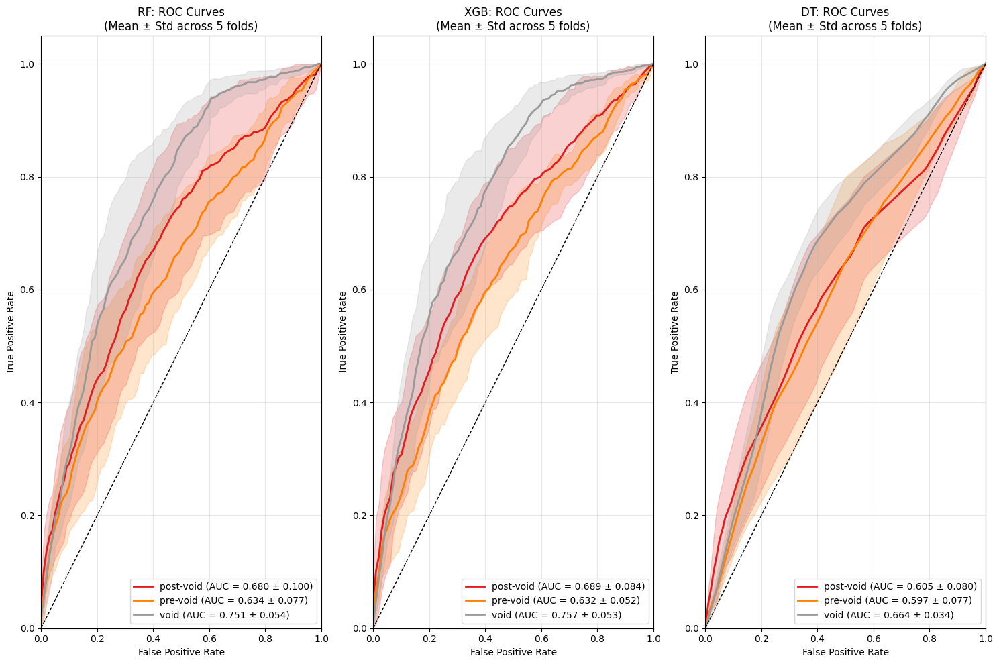

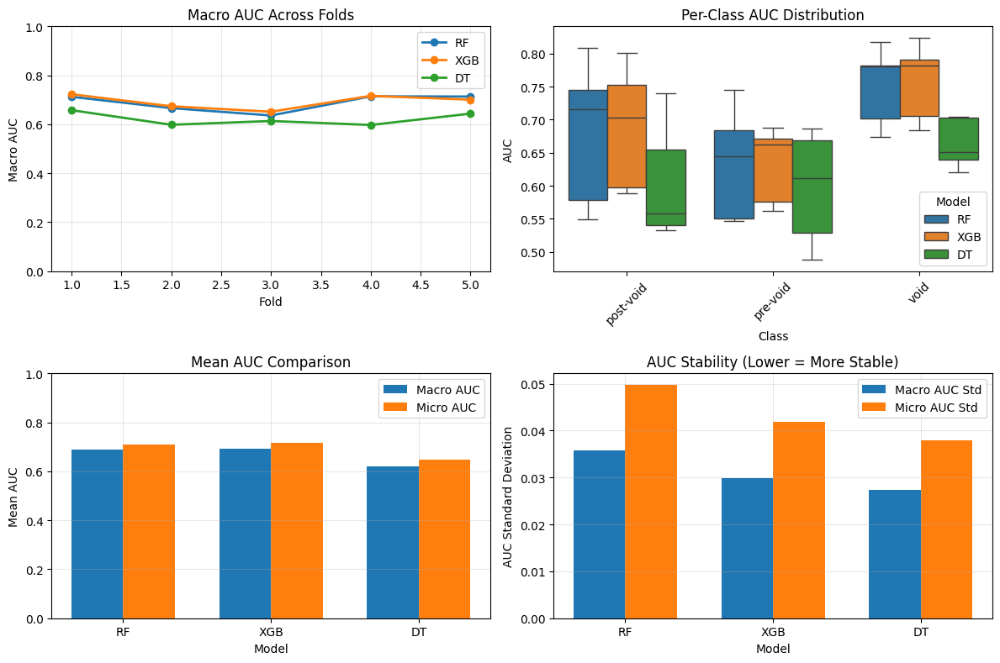

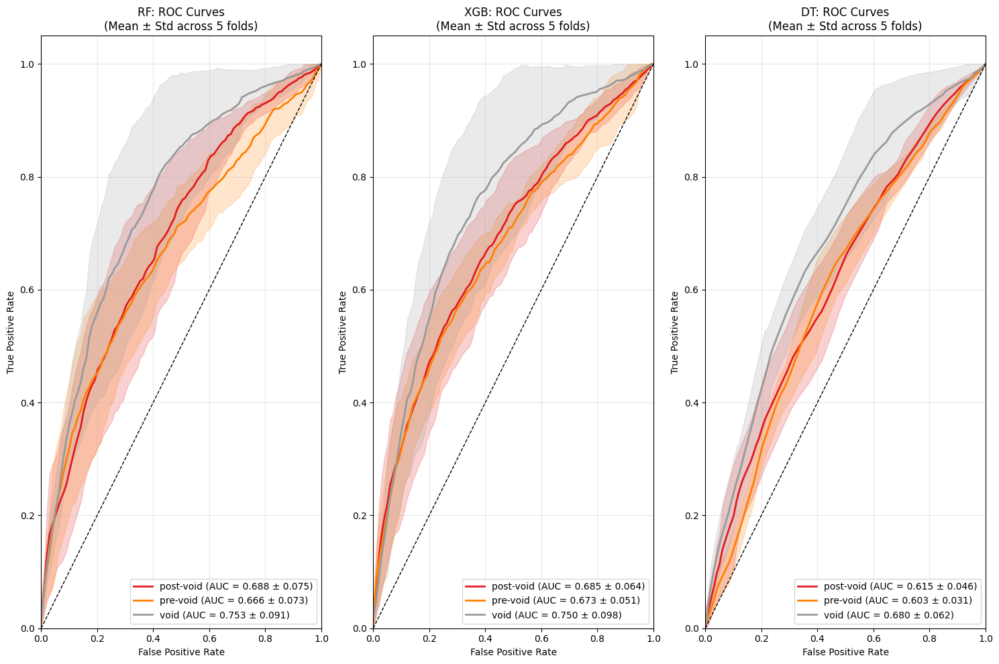

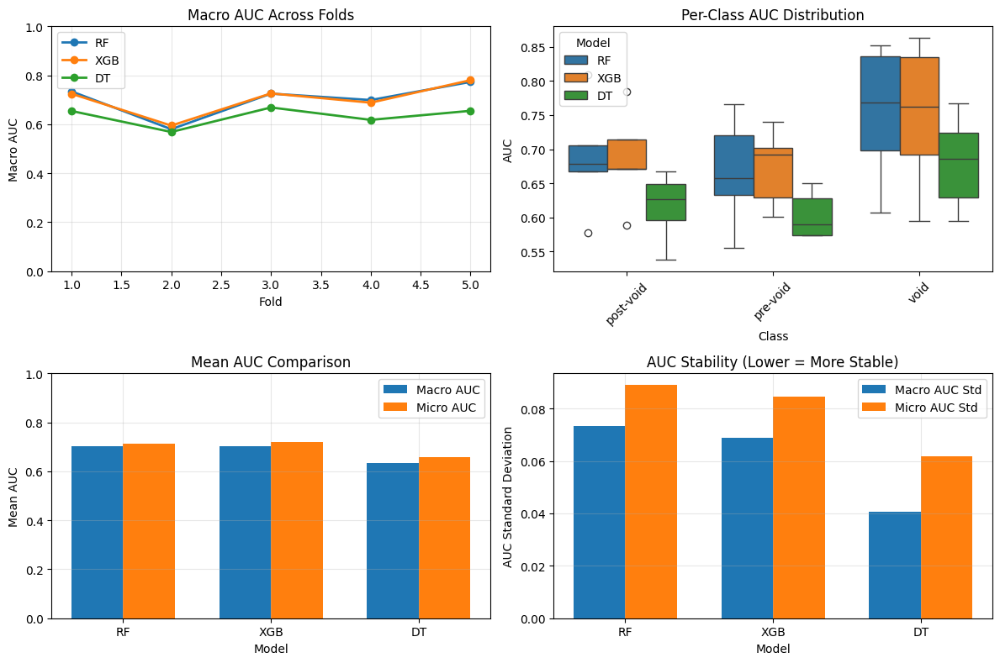

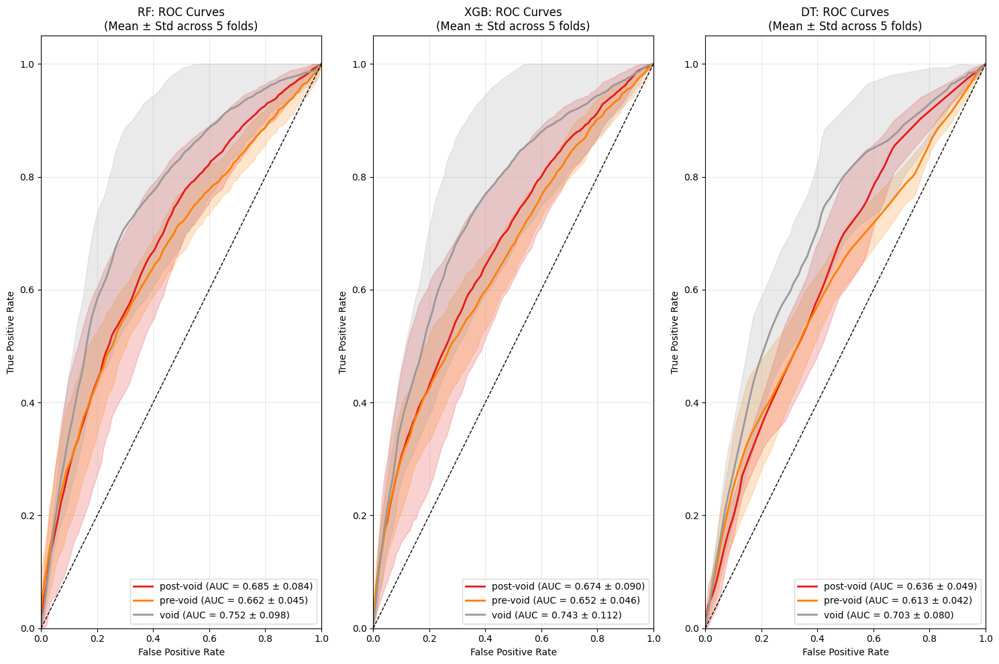

...

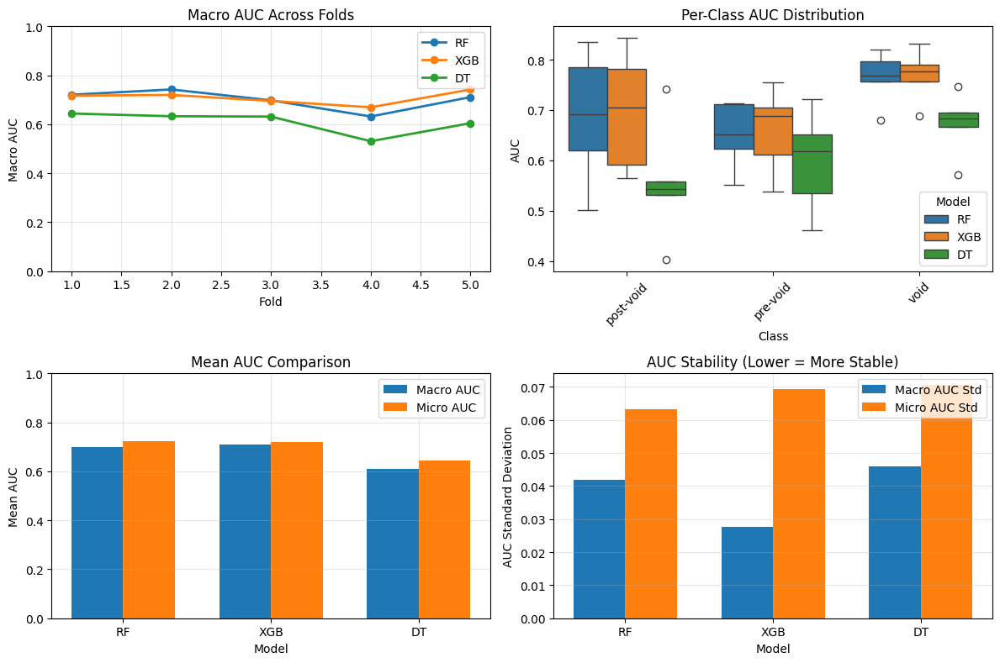

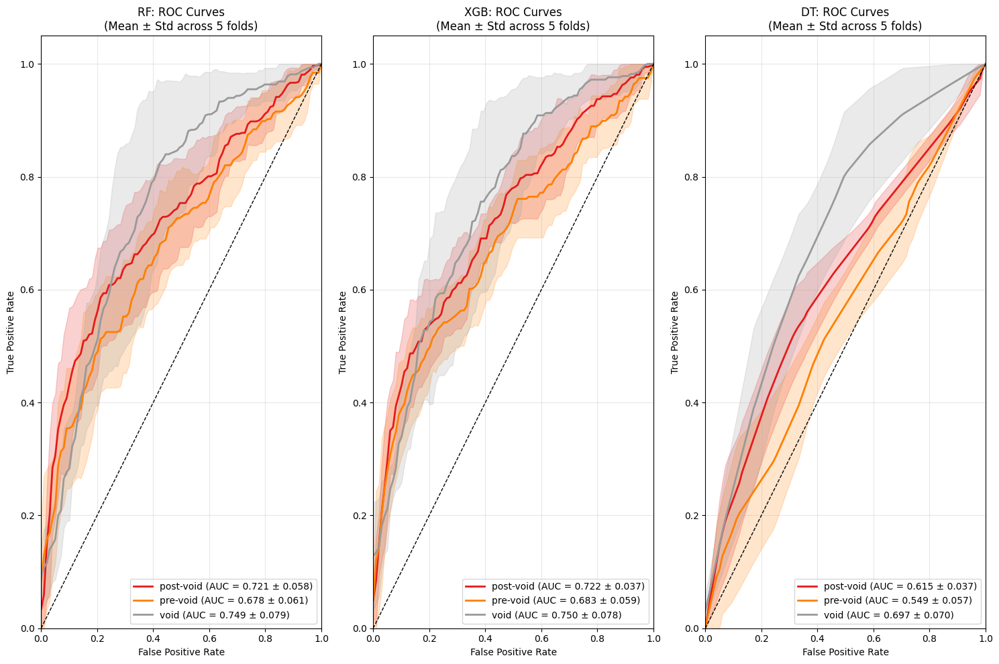

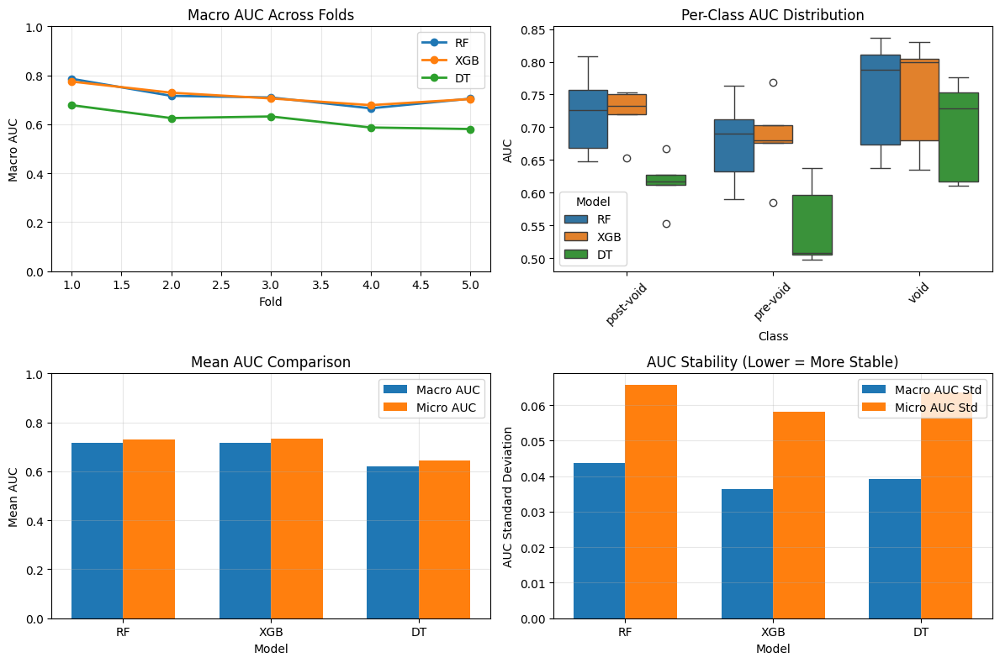

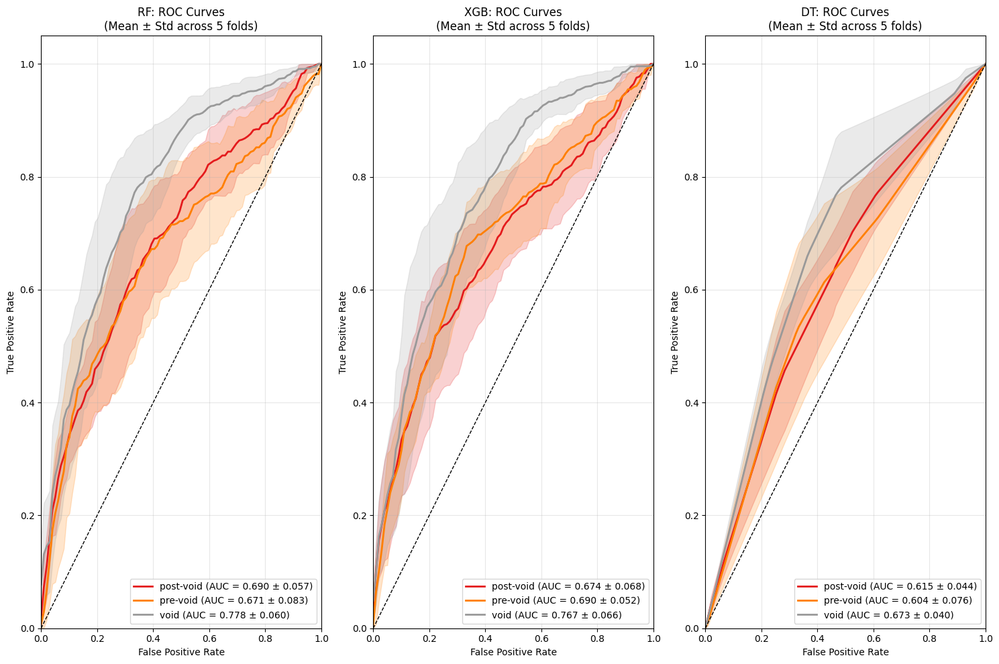

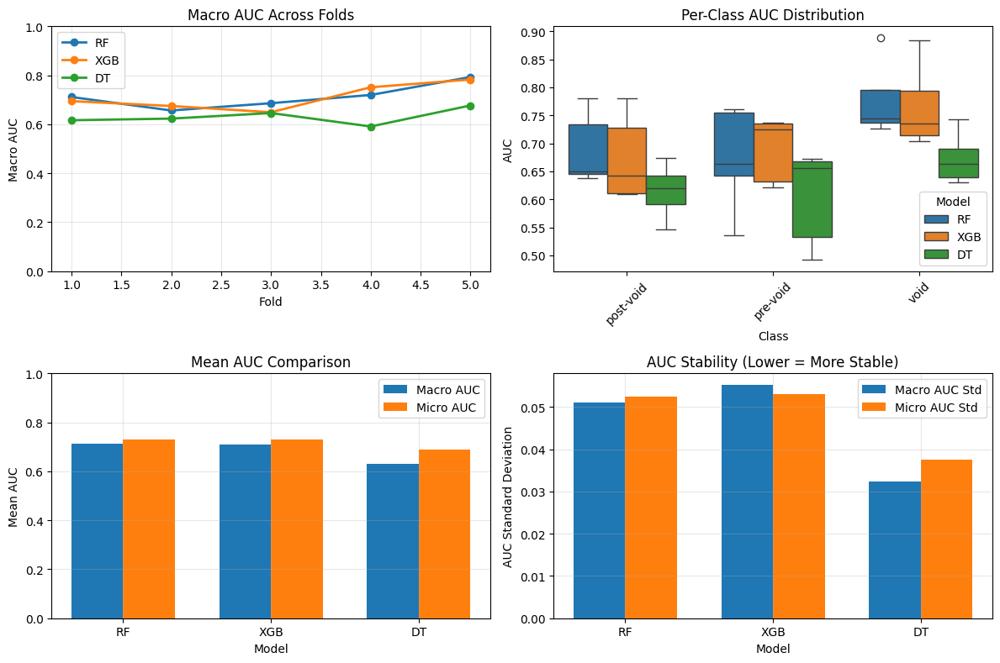

In [8]:
all_results = {}
for file in files:
    data_path = os.path.join(base_path, file)
    features = pd.read_csv(data_path)
    features.drop(columns=['center_time', 'start_time', 'end_time'], inplace=True)
    details = file.split('_')
    exp_name = f"{details[3]}_{details[-1].replace('.csv', '')}"
    print(f"Nested cross-validation for {exp_name}")
    
    X = features.drop(columns=['label', 'experiment_id'])
    y = features['label']
    groups = features['experiment_id']
    
    results_df = nested_cv(X, y, groups, exp_name)

    # Save to csv
    results_df.to_csv(f'/home/edumaba/Public/MPhil_Thesis/Code/wear_uropatch/subject_based_norm_nested_cv/three_class/preprocessed/nested_cv/feature_set_2/with_gravity/metrics/all_metrics_nested_cv_{exp_name}.csv')
    
